In [1]:
# depending on where you run this, this may have to be %matplotlib notebook
%matplotlib inline

import os
import astropy
import requests
import pandas as pd
import numpy as np
import lightkurve as lk 
from scipy.interpolate import interp1d
from astropy.modeling import models, fitting
import matplotlib.pyplot as plt
import emcee
import sys
import csv
from astropy.timeseries import LombScargle
from os.path import basename, exists

# change these paths to wherever you have the files
# sys.path.insert(1,'/Users/neisner/Documents/code/utils/')
import filters # Suzanne's functions
import norm

# change these paths to wherever you have the files
# sys.path.insert(1,'/Users/neisner/Documents/code/ETV')
import etv_functions # Nora's functions 

%matplotlib inline

In [2]:
from IPython.display import display, HTML, Javascript, clear_output

display(HTML("<style>.container { width:99% !important; }</style>"))  # Jupyter 6
display(HTML("<style>.jp-Notebook { --jp-notebook-max-width: 98%; }</style>"))  # Jupyter 7

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
outfile_base = './etv_out'  # for ETV
lk_download_dir = 'C:/dev/_juypter/PH_TESS_LightCurveViewer/data'  

# A command from shell that can be run to notify users, e.g., fitting is finished. Use "echo" if you do not have one
NOTIFY_CMD = "win-notify.bat"

if hasattr(lk, "conf"):  # default download dir
    lk.conf.cache_dir = lk_download_dir
if hasattr(lk.search, "sr_cache"):   # PR for persistent query result cache
    lk.search.sr_cache.cache_dir = lk_download_dir  # None
    lk.search.sr_cache.expire_second = 86400

In [3]:
# define the plotting parameters

figsize = (8,4)

In [5]:
# import the data

# choose a TIC ID to analyze
ticid =  30034081

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
outfile_path = f"{outfile_base}/tic{ticid}_etv_primary.csv"
outfile_path_s = f"{outfile_base}/tic{ticid}_etv_secondary.csv"


# import data using Lightkurve
sr = lk.search_lightcurve('TIC {}'.format(ticid), author = 'SPOC')
display(sr)
search_result = sr.download_all().stitch()

time = search_result.time.value
flux = search_result.flux.value
fluxerr = search_result.flux_err.value
len(search_result)

#,mission,year,author,exptime,target_name,distance,proposal_id
,,,,s,,arcsec,
0,TESS Sector 04,2018,SPOC,120,30034081,0.0,G011154
1,TESS Sector 05,2018,SPOC,120,30034081,0.0,G011154
2,TESS Sector 06,2018,SPOC,120,30034081,0.0,G011154
3,TESS Sector 07,2019,SPOC,120,30034081,0.0,G011154
4,TESS Sector 08,2019,SPOC,120,30034081,0.0,G011154
5,TESS Sector 09,2019,SPOC,120,30034081,0.0,G011154
6,TESS Sector 10,2019,SPOC,120,30034081,0.0,G011154
7,TESS Sector 12,2019,SPOC,120,30034081,0.0,G011154
8,TESS Sector 13,2019,SPOC,120,30034081,0.0,G011154


528422

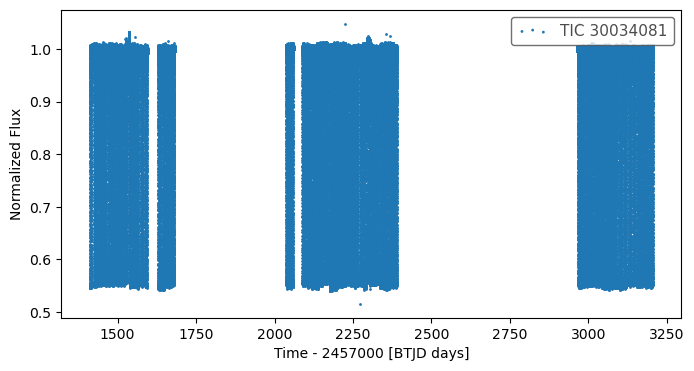

In [5]:
# mask out data you don't like...

fig, ax = plt.subplots(figsize=figsize)
search_result.scatter(ax = ax)

# t0 = 2337.376
# period_triple = 0.774

mask = time < 0  # (time > 2893.16-1) & (time < 2893.16+1) 

time = time[~mask]
flux = flux[~mask]
fluxerr = fluxerr[~mask]

# make sure that therte are no nans!

finite_mask = np.isfinite(time) * np.isfinite(flux) * np.isfinite(fluxerr)

# make a dictionary of the data 

data = pd.DataFrame({'time': time[finite_mask], 'flux': flux[finite_mask], 'err': fluxerr[finite_mask]})


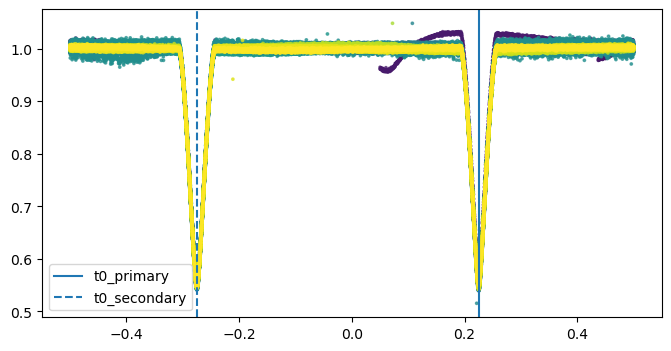

C:\pkg\_winNonPortables\miniforge3\envs\my_lk_plus\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


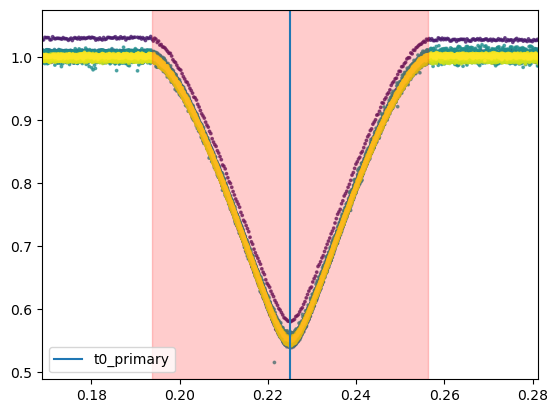

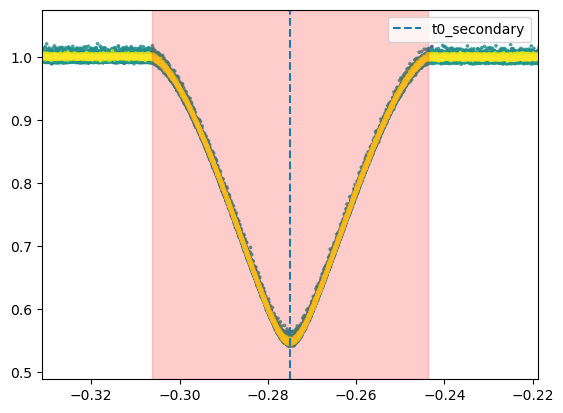

In [41]:
%matplotlib inline
# %matplotlib widget

# define the orbital period and the t0 

# FILL-IN THE eclipse epoch / period, 
# we assume the TCE caught both primary and secondary eclipses
# epoch=1411.5528, duration_hr=7.0212, period=2.344623, label="s0001-s0069:TCE1"
# MCMC:  period=4.689244543697671, std_p: 1.86213120094379e-08 ; t-1413.8976811481466, std_t0: 4.107298966845845e-06
# period = 4.689246  # TCE X 2
period = 4.689244 # MCMC


t0_primary = 1411.5528 + period / 2
t0_secondary = 1411.5528

duration_hr_primary = 7.0212  # used for the window to cut the lighcurve around eclipses in later cells
duration_hr_secondary = 7.0212


# Move t0 to the first dip in the data (some of the subsequent codes, espically fit_each_eclipse(), assumes that)
t0_primary = t0_primary - int((t0_primary - data['time'][0]) / period) * period
if t0_secondary is not None:
    t0_secondary = t0_secondary - int((t0_secondary - data['time'][0]) / period) * period


# t0_for_plotting = 0  # keep 0 for plotting purposes
t0_for_plotting = t0_primary - np.abs(t0_primary - t0_secondary) * 0.25  # use a custom one so that the eclipses are not near the edge (-0.5 or +0.5)
if t0_secondary is not None:
    t0_for_plotting = t0_primary - np.abs(t0_primary - t0_secondary) * 0.45  # use a custom one so that the eclipses are not near the edge (-0.5 or +0.5)

phase = etv_functions.phase_data(data['time'], t0_for_plotting, period)

fig, ax = plt.subplots(figsize = (8,4))

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])

# add the phase to the dataframe
data['phase'] = phase

plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
if t0_secondary is not None:
    plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
plt.legend()
# plt.ylim(0.535, 0.55)
# plt.xlim(-0.5, 0.1)
plt.show();

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])
plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
t1_p, t4_p = etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] - 0.5 * duration_hr_primary / 24/ period, etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] + 0.5 * duration_hr_primary / 24/ period
plt.xlim(t1_p - 0.025, t4_p + 0.025);
plt.axvspan(t1_p, t4_p, color="red", alpha=0.2);plt.legend();
# plt.ylim(0.75, 0.85);
plt.show()

if t0_secondary is not None:
    plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])
    plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
    t1_s, t4_s = etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0] - 0.5 * duration_hr_secondary / 24/ period, etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0] + 0.5 * duration_hr_secondary / 24/ period
    plt.xlim(t1_s - 0.025, t4_s + 0.025);
    plt.axvspan(t1_s, t4_s, color="red", alpha=0.2);plt.legend();
    plt.legend();
    # plt.ylim(0.975, 1.005);
    plt.show()

### Detrend (optional)

- detrended flux is in `flux_detrended`, and won't be used in subsequent work by default

In [ ]:
# show data to visualize what's changed in each step below
data  

In [ ]:
# phase fold the data and create an appoximate binary model (top) and subtract it from the data (bottom)
#_, _ , flux_sub_binary, model, _, _ = etv_functions.trend_removal_interact(period, 0, data['time'], data['flux'], data['time'], data['flux'])

data = etv_functions.trend_removal_interact(period, t0_for_plotting, data)
data

In [ ]:
# if you want to detrend the data run this line!

data = etv_functions.detrend_suz(data, T_dur = 10, plot = True)
data

In [ ]:
# plot the phase folded data here so that you know at what phase you want to cut the data to model 
fig, ax = plt.subplots(figsize = figsize)
plt.scatter(data.phase, data.flux_detrended, s = 1)
plt.show()

### Now that the data is ready we can start 

In [42]:
# define the midpoints of the primary and secondary eclipses and the window width

# if these don't look central - change them!! the eclipses should be central
midpoint_p =  etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0]  # convet to time in phase
# midpoint_p -= 0.004  # the offset is added back to t0_primary (& secondary above
print('Primary:  ', t0_primary, midpoint_p)

# change depending on the width of the eclipses, default to be slightly larger than the primary eclipse
window_width_p = 0.8 * duration_hr_primary / 24 / period   # it seems to be difficult to bit model the flat bottom and the curves outside, focus on the overall shape for now
# use a shoter duration to avoid fitting the out-of-eclipse LC, which has its own variability that the model is not equipped to hanlde
# window_width_p = 0.095
print("window_width_p (phase):", window_width_p)

data_primary = data[(data['phase'] > midpoint_p - window_width_p / 2) & (data['phase'] < midpoint_p + window_width_p / 2) ]
ph_binned,flux_binned,err_binned = etv_functions.run_binning_phased(data_primary.phase, data_primary.flux, yerr=data_primary.err,nbins=1000)


if t0_secondary is not None:
    midpoint_s =  etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0]
    print('Secondary:', t0_secondary, midpoint_s)

    # the coshgauss model seems problematic, try to use a larger width to give it more shape to fit
    window_width_s = 0.8 * duration_hr_secondary / 24 / period
    # window_width_s = 0.22
    print("window_width_s (phase):", window_width_s)

    data_secondary = data[(data['phase'] > midpoint_s - window_width_s / 2) & (data['phase'] < midpoint_s + window_width_s / 2) ]
    ph_binned_s,flux_binned_s,err_binned_s = etv_functions.run_binning_phased(data_secondary.phase, data_secondary.flux, yerr=data_secondary.err,nbins=1000)


### # you need initial guesses!! The order is :
# alpha0, alpha1, t0, d, Tau - CHANGE THESE TO YOUR OWN INITIAL GUESSES
# median flux, -eclipse depth, t0, related to duration, related to shape (U or V)
# t0 in normalixed phase
start_vals = [1.021, -0.476, midpoint_p, 0.01591, 0.6614]
start_vals_s = [1.0, -0.45, midpoint_s, 0.0143, 0.78]


# -- -- -- -- -- -- -- -- --
# etv_functions.plot_initial_guess(data_primary, ph_binned, flux_binned, err_binned, *start_vals)
etv_functions.plot_initial_guess_interactive(data_primary, ph_binned, flux_binned, err_binned, "midpoint_p", *start_vals)
if t0_secondary is not None:
    # etv_functions.plot_initial_guess(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, *start_vals_s)
    etv_functions.plot_initial_guess_interactive(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, "midpoint_s", *start_vals_s)

print("Start params for  fitting period with MCMC on df_primary:")
print(f"[{start_vals[0]}, {start_vals[1]}, t0_primary, {start_vals[3]}, {start_vals[4]}, {period}],");

Primary:   1413.897422 0.2250000000000021
window_width_p (phase): 0.04990996416479927
Secondary: 1411.5528 -0.2750000000000133
window_width_s (phase): 0.04990996416479927


Output(layout=Layout(padding='1em 0px'))

Output(layout=Layout(padding='1em'))

Output(layout=Layout(padding='1em 0px'))

Output(layout=Layout(padding='1em'))

Start params for  fitting period with MCMC on df_primary:
[1.021, -0.476, t0_primary, 0.01591, 0.6614, 4.689244],


emcee parallel enabled, use 4 CPUs.


100%|██████████████████████████████████████████████████████████| 1000/1000 [11:17<00:00,  1.48it/s]


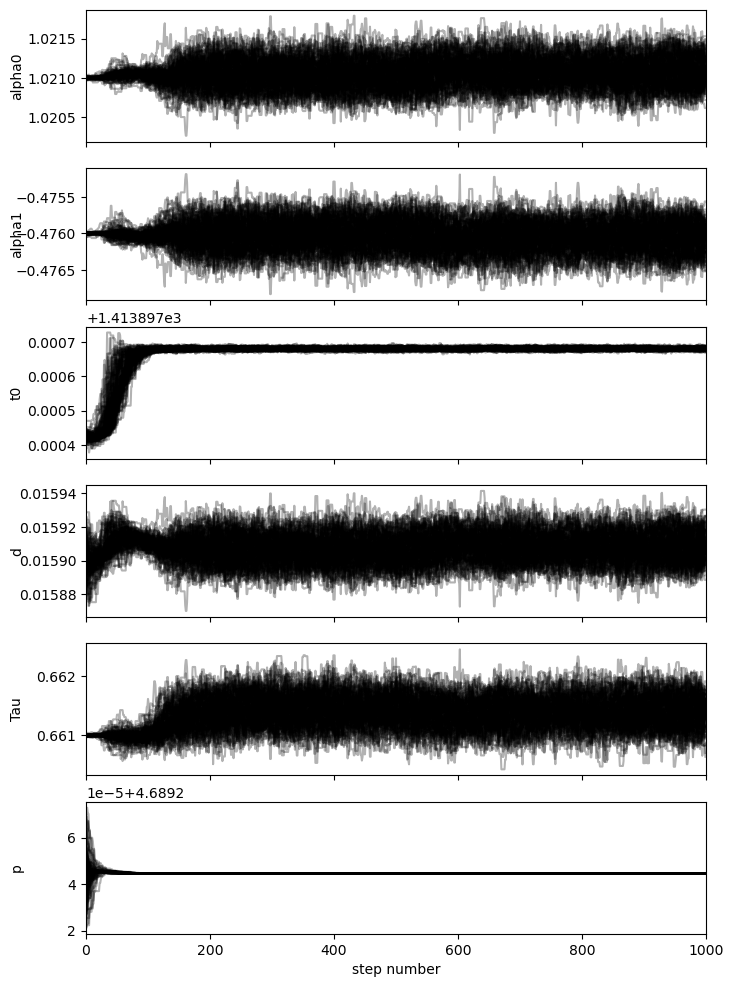

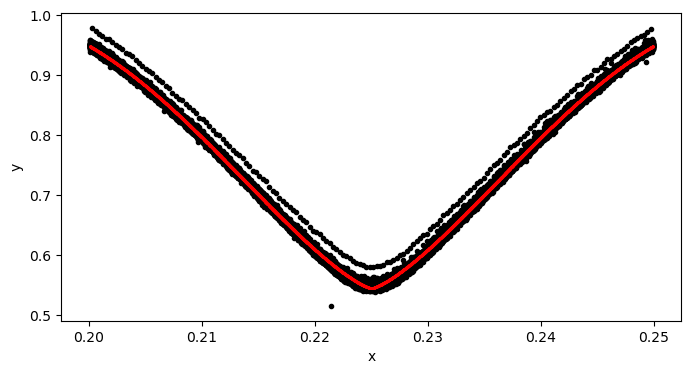

mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p = 1.021080184726654, -0.4760513256695035, 1413.8976811481466, 0.015908147373506168, 0.6613924601787362, 4.689244543697671
std_p: 1.86213120094379e-08 ; std_t0: 4.107298966845845e-06


In [39]:
# use MCMC to refine the period

use_mcmc_to_fit_period = True


if use_mcmc_to_fit_period:
    import etv_functions_with_period as etvp

    etv_functions.enable_info_log_for_jupyter()

    # MCMC result
    # mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p = 1.021080184726654, -0.4760513256695035, 1413.8976811481466, 0.015908147373506168, 0.6613924601787362, 4.689244543697671
    # std_p: 1.86213120094379e-08 ; std_t0: 4.107298966845845e-06    
    mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p, fit_params_p_stats = etvp.run_mcmc_initial_fit_p(
        data_primary[:],
        [1.021, -0.476, t0_primary, 0.0159, 0.661, 4.689246],
        # nruns=20, discard=1, # for a sanity test,  to ensure the initial guess is not way off.
        nruns=1000, discard=600,
        pool=-2,
        plot_chains=True,
        plot=True,
        also_return_stats=True,
    )
    print("mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p = " + ", ".join([str(v) for v in [mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p]]))
    print("std_p:", fit_params_p_stats["std_p"], "; std_t0:", fit_params_p_stats['std_t0'])
    !$NOTIFY_CMD "Fitting period done."

emcee parallel enabled, use 4 CPUs.


100%|██████████████████████████████████████████████████████████| 1000/1000 [02:24<00:00,  6.91it/s]


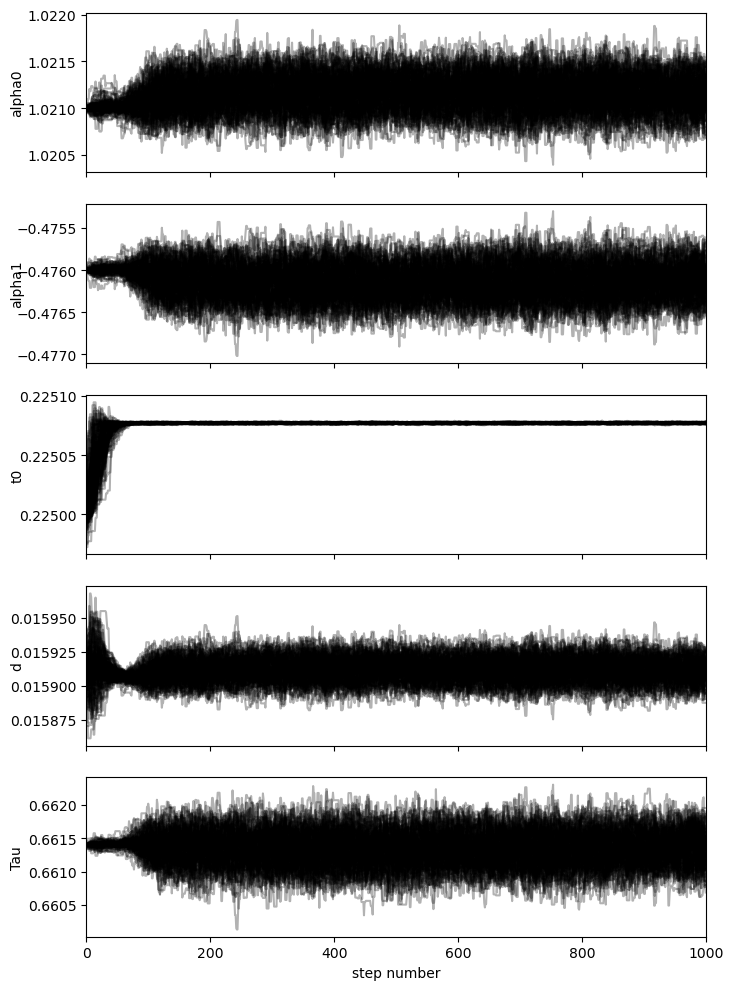

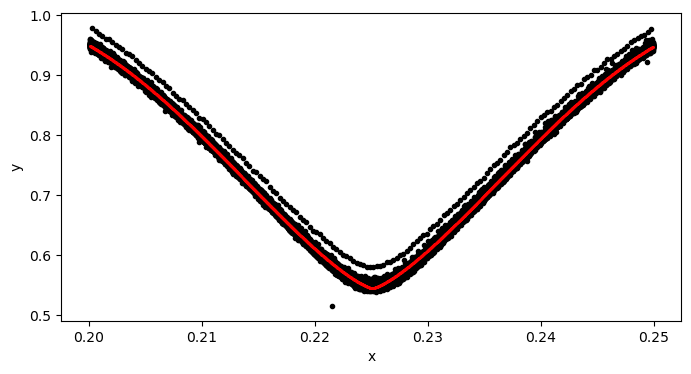

emcee parallel enabled, use 4 CPUs.


100%|██████████████████████████████████████████████████████████| 1000/1000 [02:19<00:00,  7.18it/s]


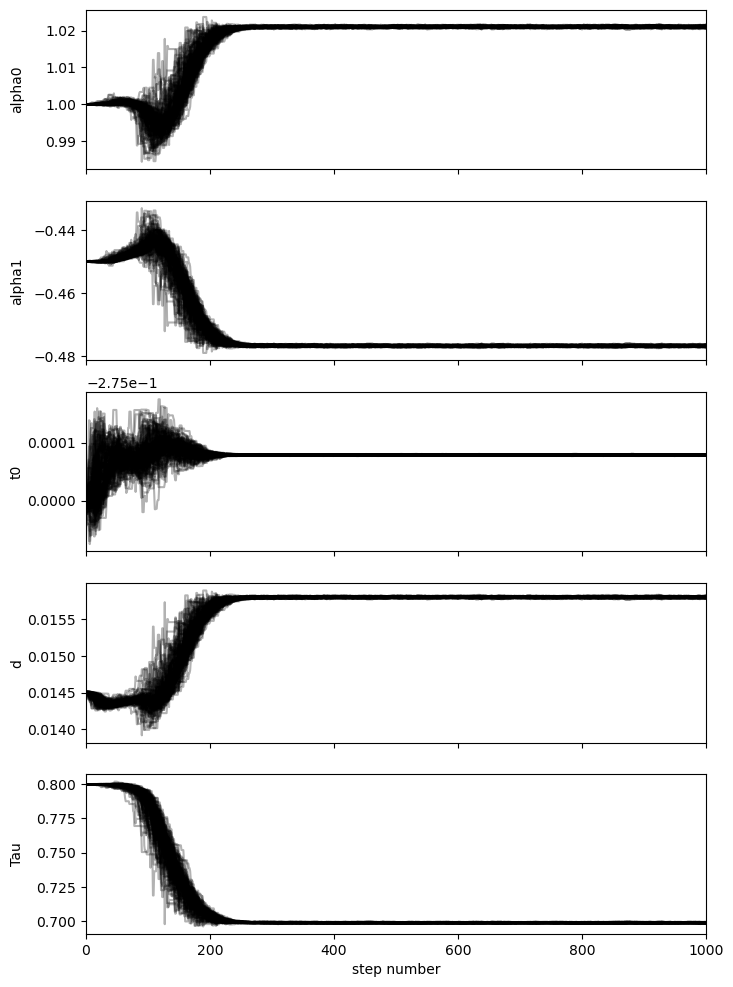

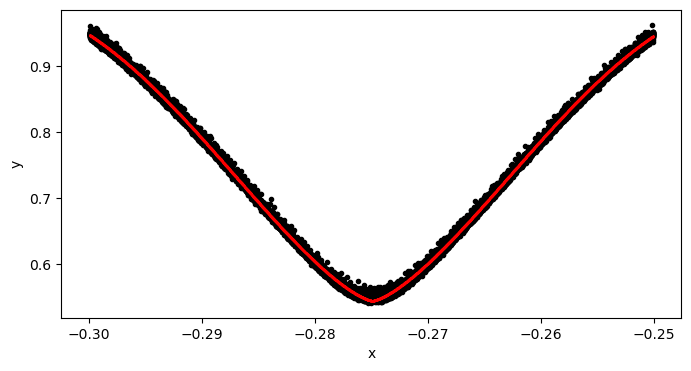

In [43]:
# run the initial model fit using MCMC for the primary and secondary eclipses
run_init_fit = True

if run_init_fit:
    etv_functions.enable_info_log_for_jupyter()
    mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = etv_functions.run_mcmc_initial_fit(data_primary, start_vals, nruns=1000, discard=600, pool=-2, plot_chains = True, plot = True)
    if t0_secondary is not None:
        mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = etv_functions.run_mcmc_initial_fit(data_secondary, start_vals_s, nruns=1000, discard=600, pool=-2, plot_chains = True, plot = True)
    !$NOTIFY_CMD "Initial fit done"

In [13]:
if not run_init_fit:  # case init fit has been previously saved and to be reussed
    print("Use pre-defined inital model params:")
    # initial fit params from TESS data with ingress/egress included in  the model
    # mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.0011142495421985, -0.4510105175356701, 0.12499719178254205, 0.014577189327488124, 0.7247681117651352
    # mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 1.0013589390322668, -0.452358403656157, -0.37500037502926503, 0.014534760518686683, 0.7649265918969392

    # initial fit params from TESS data excluding ingress/egress included in  the model
    # mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.0210511236538362, -0.4760141589004201, 0.2249972617711794, 0.015906219092416175, 0.6614578692058887
    # mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 1.020917401075947, -0.47666570014192355, -0.2750002079995911, 0.01580059145330234, 0.6987895837758958    

    # initial fit params from TESS data excluding ingress/egress included in  the model, + using MCMC period
    mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.0211653276225232, -0.47613977945730757, 0.22507702764520632, 0.015911678942151085, 0.661339137098932
    mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 1.0210189608529545, -0.47678101779065185, -0.27492145435421206, 0.01580360916252184, 0.6986945656765037

    etv_functions.plot_initial_guess(data_primary, ph_binned, flux_binned, err_binned, *[mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau])
    etv_functions.plot_initial_guess(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, *[mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s])

In [44]:
print("Initial model params:")  # For information, and they can be copied to the cell above for future reuse

print("mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = " + ", ".join([str(v) for v in [mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau]]))
if t0_secondary is not None:
    print("mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = " + ", ".join([str(v) for v in [mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s]]))

Initial model params:
mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.0211653276225232, -0.47613977945730757, 0.22507702764520632, 0.015911678942151085, 0.661339137098932
mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 1.0210189608529545, -0.47678101779065185, -0.27492145435421206, 0.01580360916252184, 0.6986945656765037


382

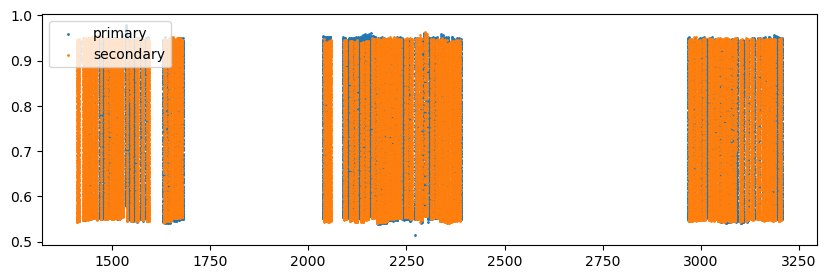

In [45]:
fig = plt.subplots(figsize=(10, 3), sharex=True)
plt.scatter(data_primary.time,data_primary.flux , s = 1, label = 'primary')
plt.scatter(data_secondary.time,data_secondary.flux , s = 1, label = 'secondary')
plt.legend()

# calculate the number of transits there are within the data 
n_transits = int((max(data_primary.time) - min(data_primary.time)) / period)
n_transits

1413.897422 4.689244 1413.897422


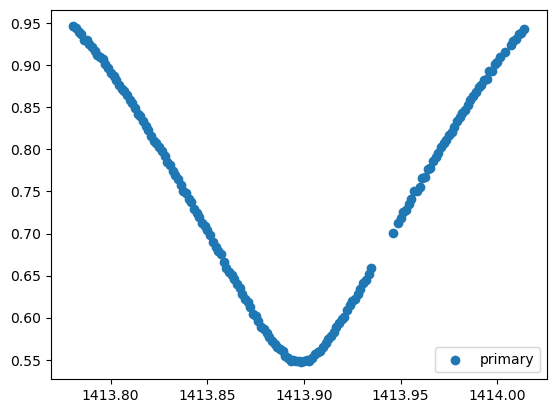

1413.897422 4.689244 1418.586666


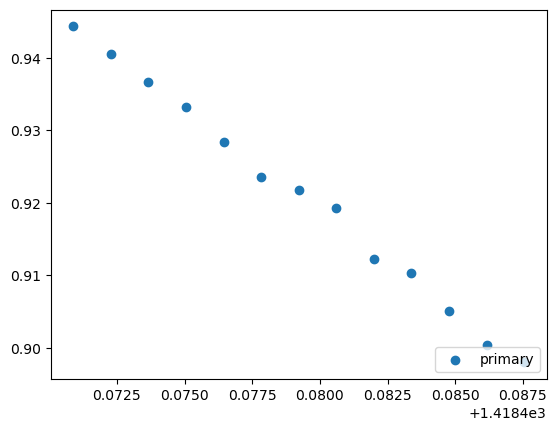

1413.897422 4.689244 1423.27591


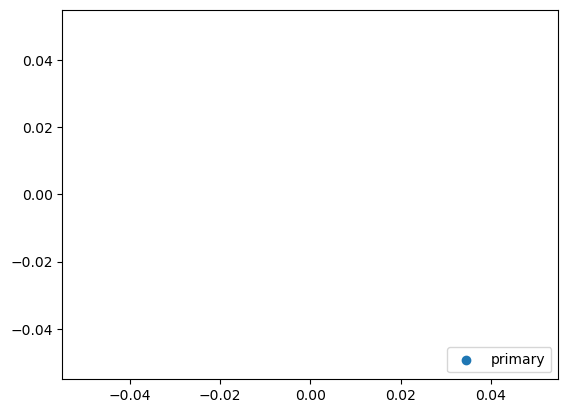

1411.5528 4.689244 1411.5528


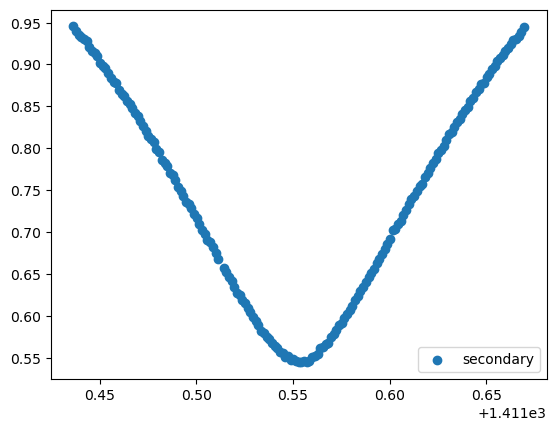

1411.5528 4.689244 1416.2420439999999


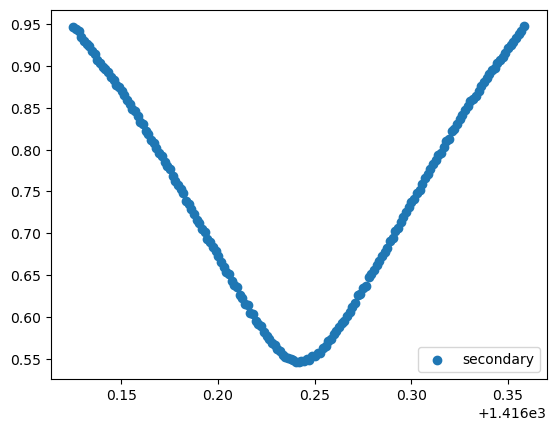

1411.5528 4.689244 1420.931288


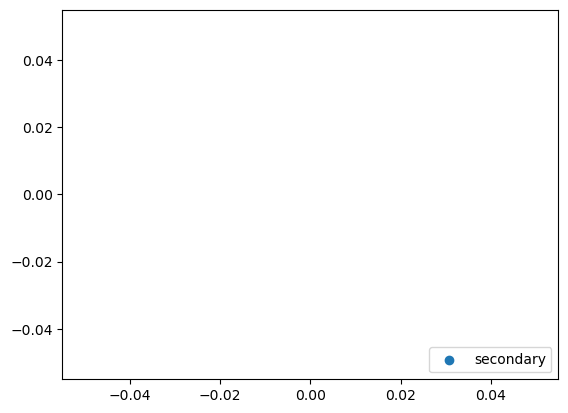

In [46]:
tr_index = range(0,n_transits)

for i in tr_index[0:3]:        
    transit_time = t0_primary+(period*i)
    x = np.array(data_primary.time)
    y = np.array(data_primary.flux) 
    yerr = np.array(data_primary.err)
    
    print (t0_primary, period, transit_time)
    
    mask = (x > (transit_time - (0.2*period))) & (x < (transit_time + (0.2*period))) 
    
    x = np.array(x[mask])
    y = np.array(y[mask]) 
    yerr = np.array(yerr[mask])
    fig, ax = plt.subplots()
    plt.scatter(x,y, label="primary")
    plt.legend(loc="lower right")
    plt.show()
    

for i in tr_index[0:3]:        
    transit_time = t0_secondary+(period*i)
    x = np.array(data_secondary.time)
    y = np.array(data_secondary.flux) 
    yerr = np.array(data_secondary.err)
    
    print (t0_secondary, period, transit_time)
    
    mask = (x > (transit_time - (0.2*period))) & (x < (transit_time + (0.2*period))) 
    
    x = np.array(x[mask])
    y = np.array(y[mask]) 
    yerr = np.array(yerr[mask])
    fig, ax = plt.subplots()
    plt.scatter(x,y, label="secondary")
    plt.legend(loc="lower right")
    plt.show()

Fitting individual primary eclipses...
Existing manifest file found, will skip previously processed LCs and append to end of manifest file
Number 0 has already been completed -- skip
Time 1418.586666 does not have enough data points: 13
1427.965154 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.08it/s]


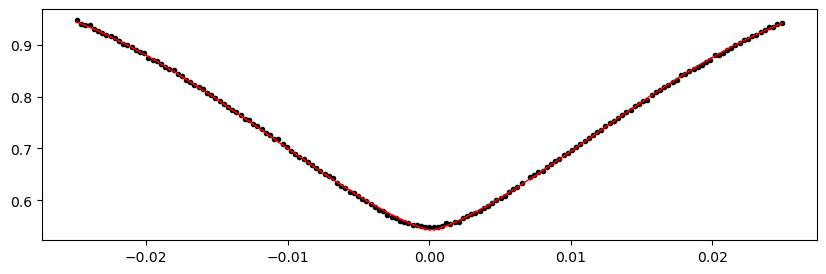

1432.654398 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.32it/s]


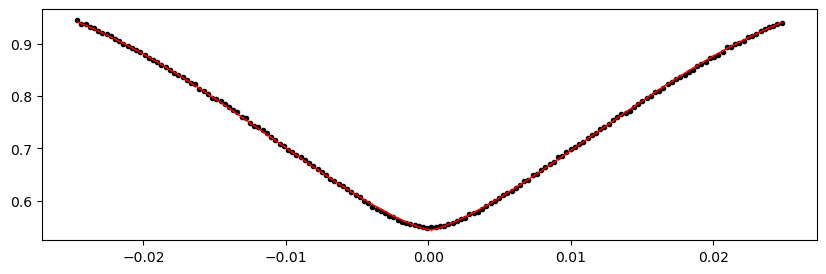

1442.032886 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 344.85it/s]


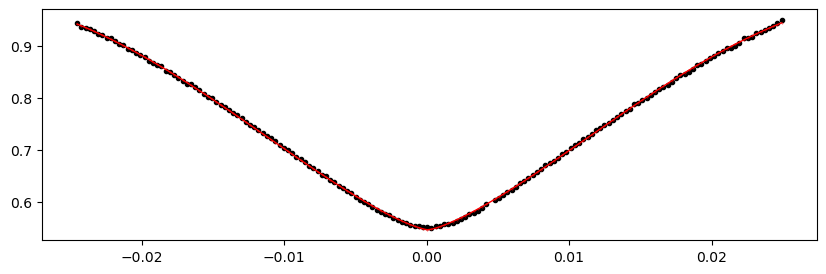

1446.72213 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.13it/s]


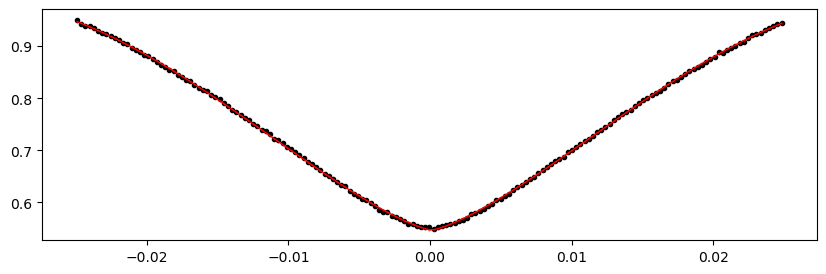

1456.100618 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.71it/s]


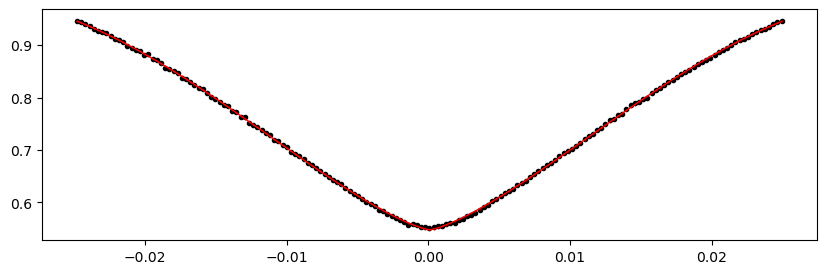

1460.789862 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.47it/s]


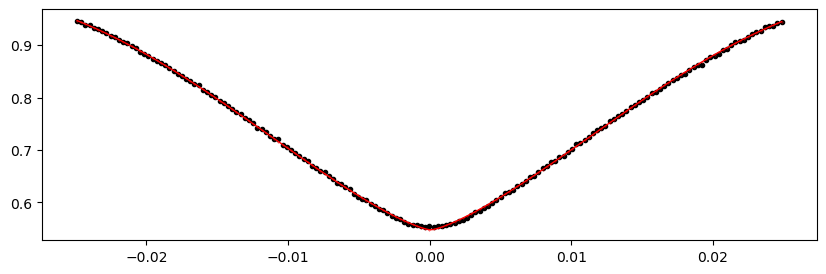

1470.16835 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.10it/s]


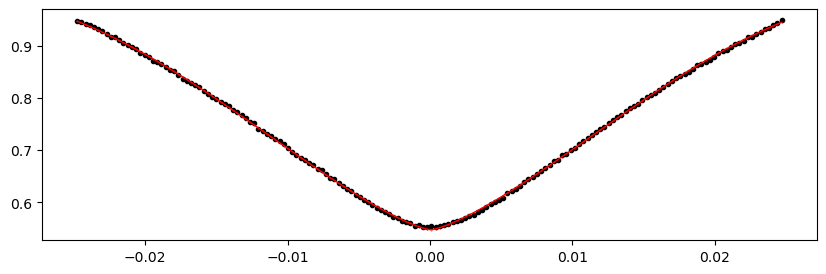

1474.857594 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.21it/s]


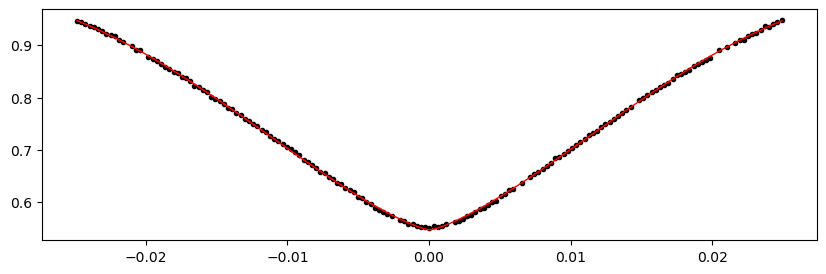

1479.546838 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.38it/s]


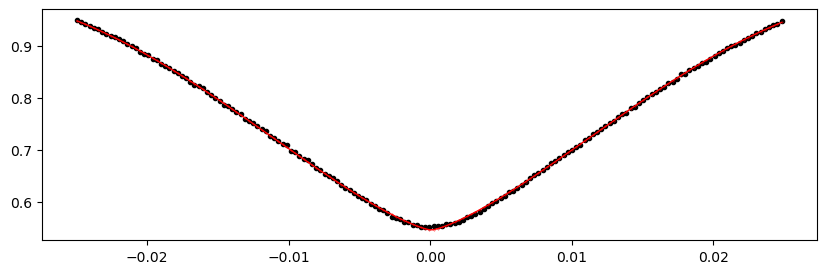

1484.236082 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.80it/s]


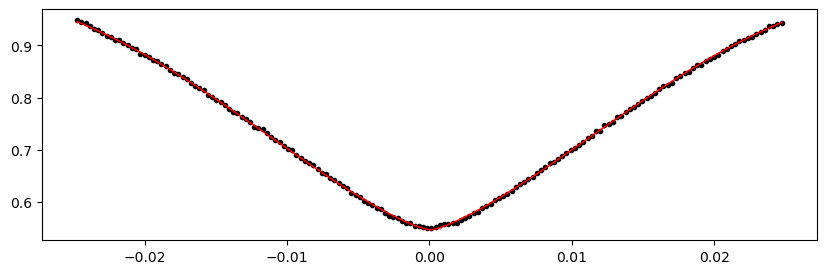

1488.925326 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.73it/s]


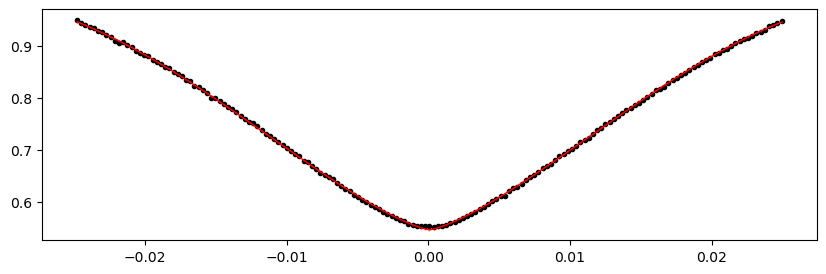

1493.61457 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.85it/s]


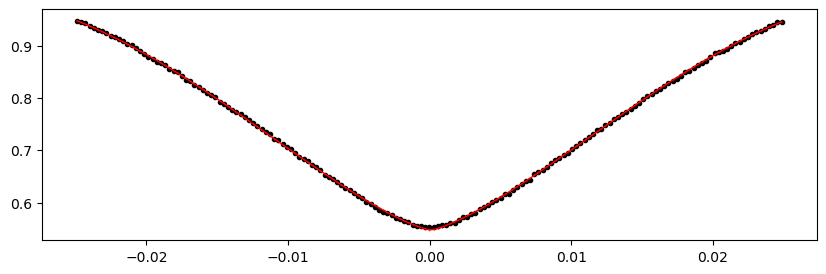

1498.303814 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.31it/s]


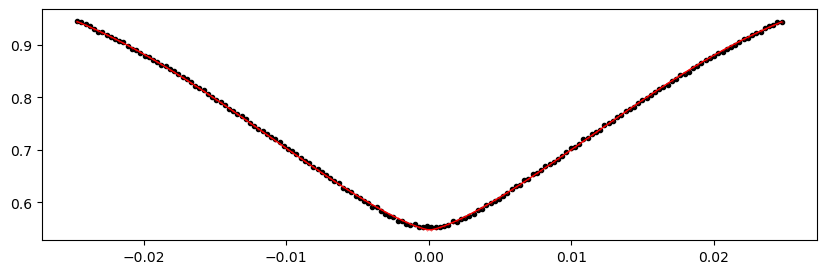

1502.993058 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.66it/s]


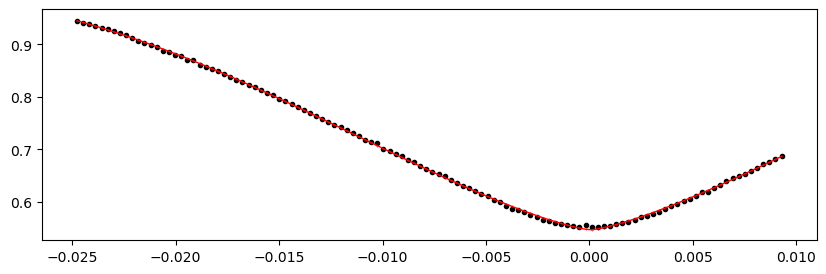

1507.682302 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 344.94it/s]


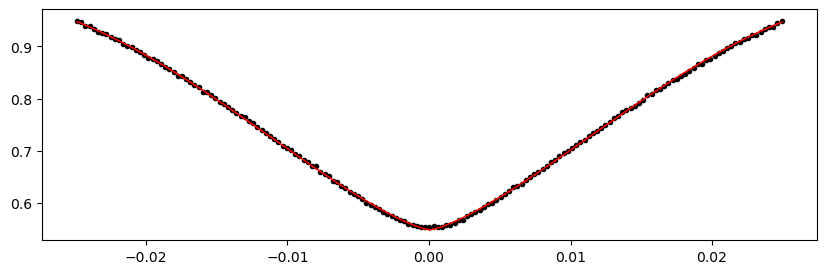

1512.371546 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.32it/s]


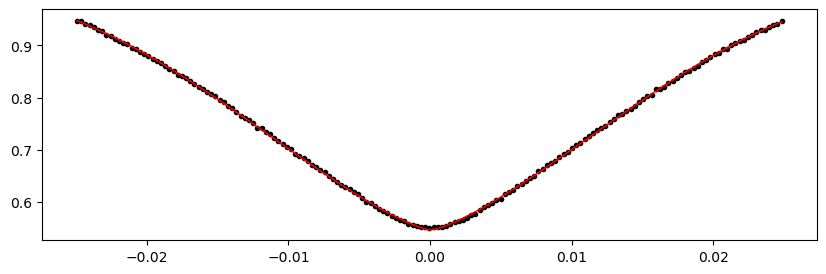

1521.750034 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.87it/s]


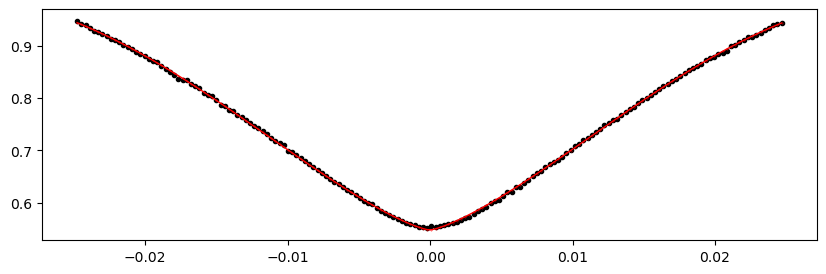

1526.439278 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.90it/s]


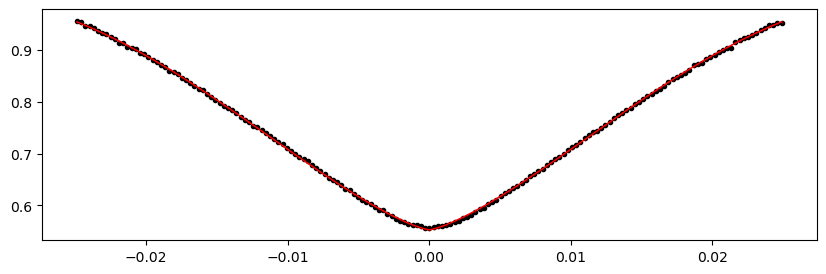

1535.8177660000001 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.28it/s]


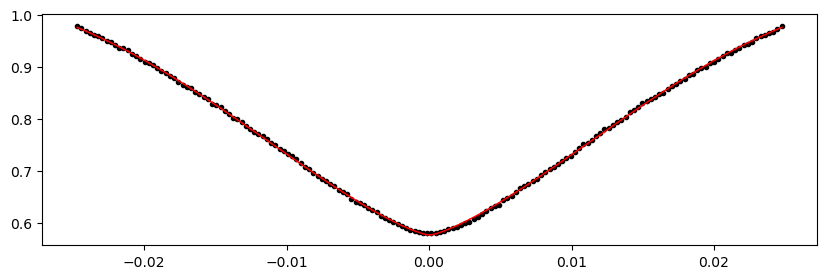

1540.50701 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.01it/s]


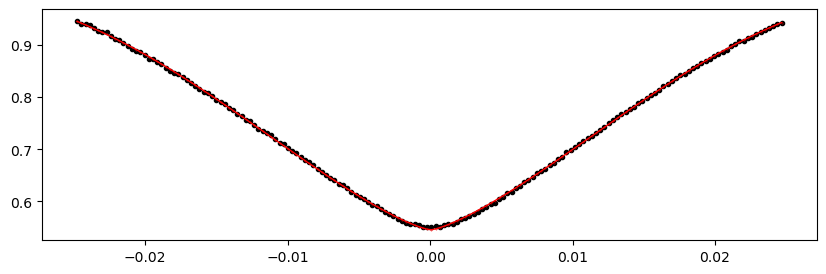

1545.196254 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.50it/s]


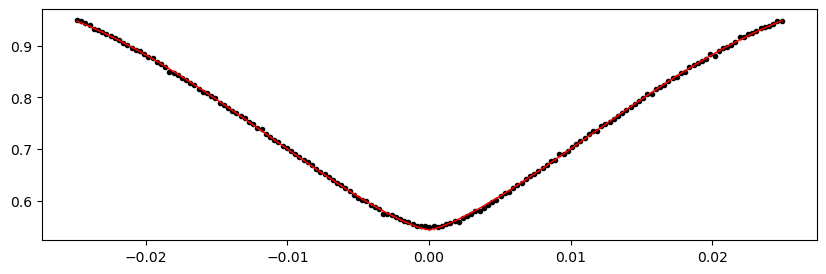

1549.885498 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 344.95it/s]


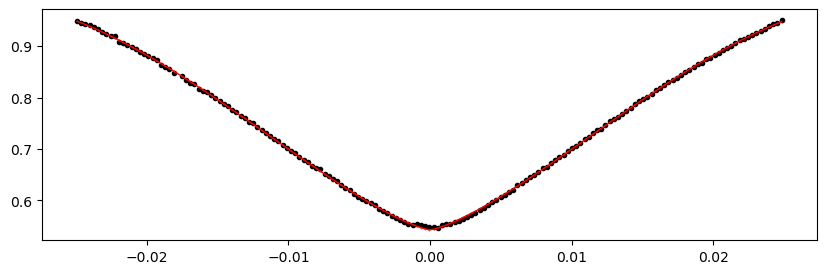

1554.574742 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.87it/s]


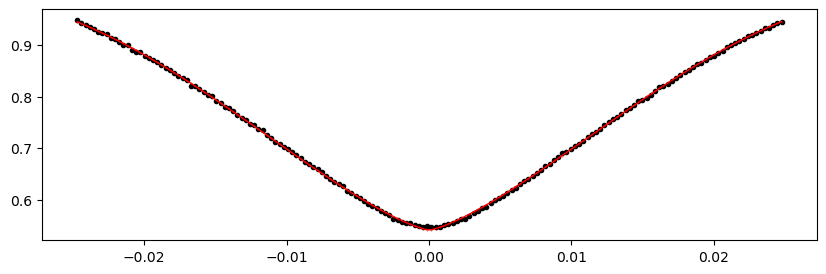

1559.263986 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.99it/s]


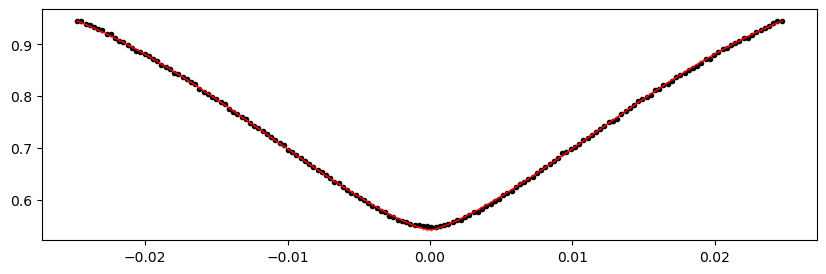

1563.95323 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.92it/s]


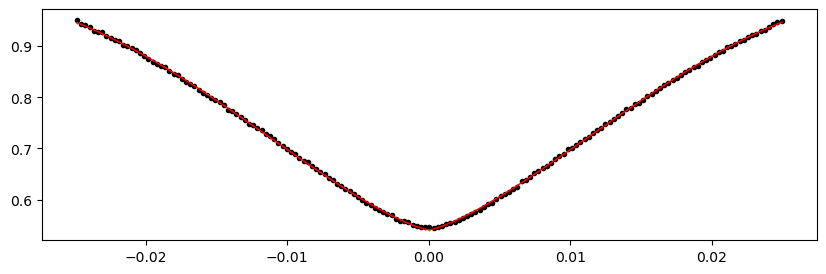

1573.331718 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.31it/s]


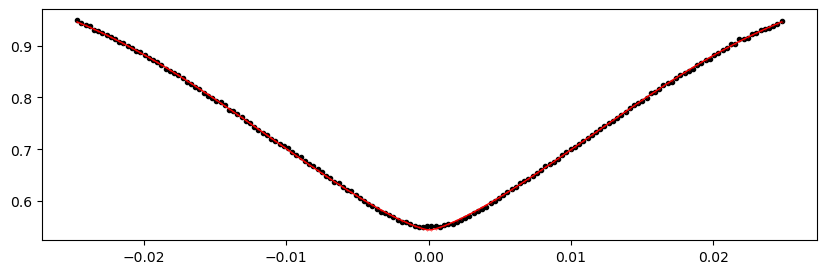

1578.020962 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.87it/s]


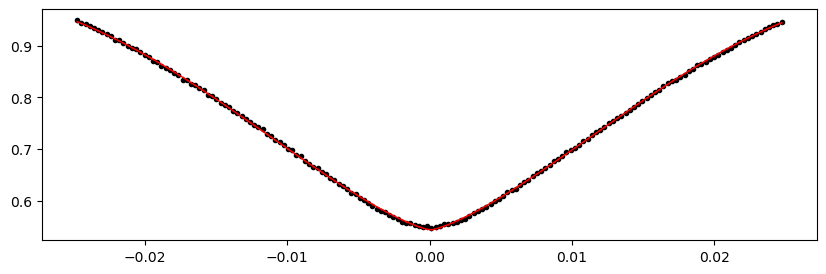

1587.3994500000001 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 344.83it/s]


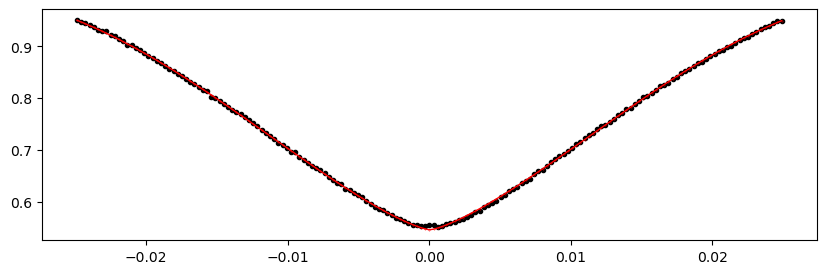

1592.088694 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.29it/s]


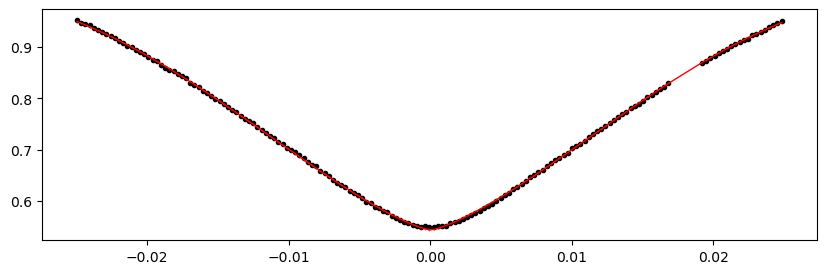

1629.602646 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.96it/s]


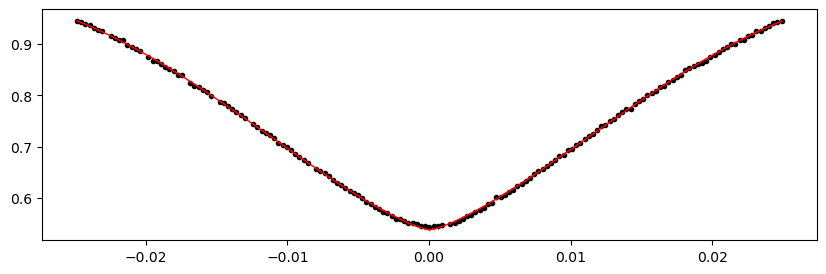

1634.29189 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 318.78it/s]


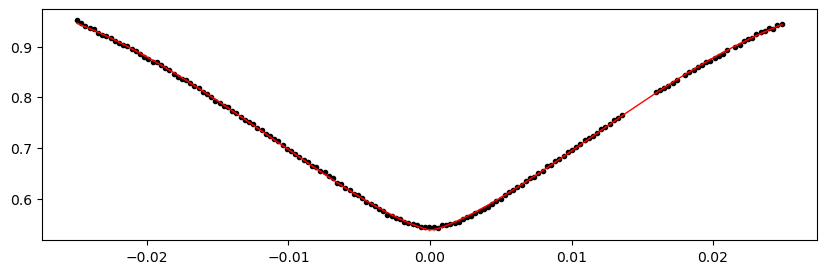

1638.981134 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.70it/s]


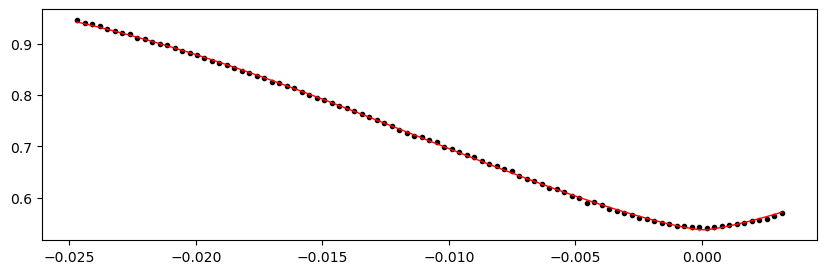

1643.670378 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.58it/s]


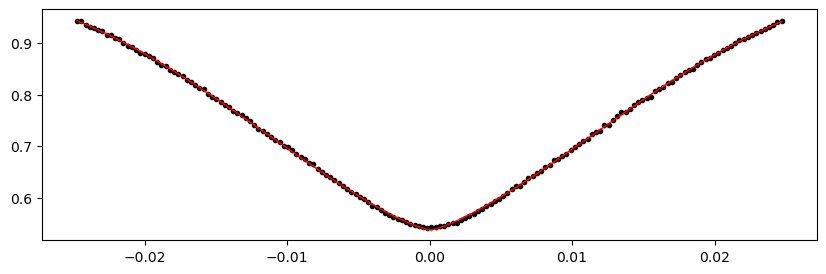

1648.359622 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.71it/s]


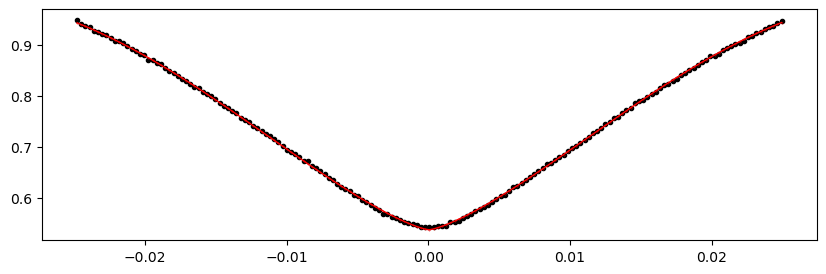

1657.73811 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.71it/s]


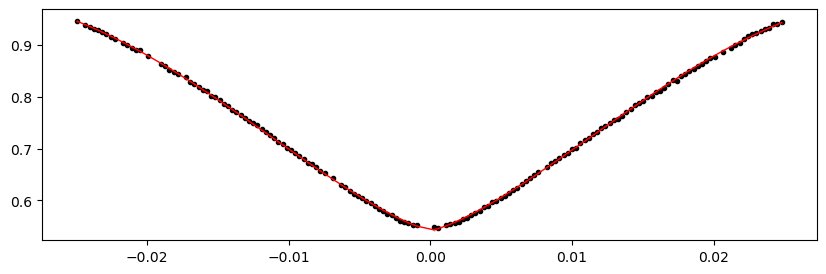

1662.427354 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.25it/s]


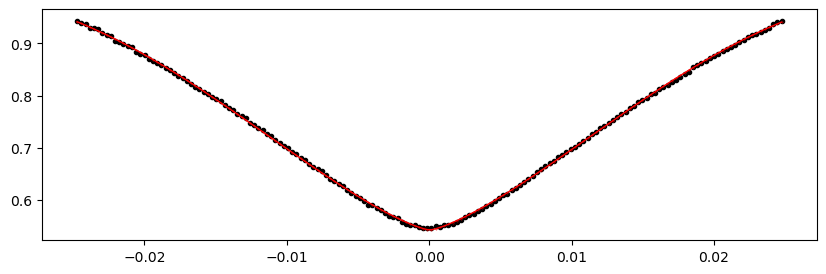

1667.116598 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.08it/s]


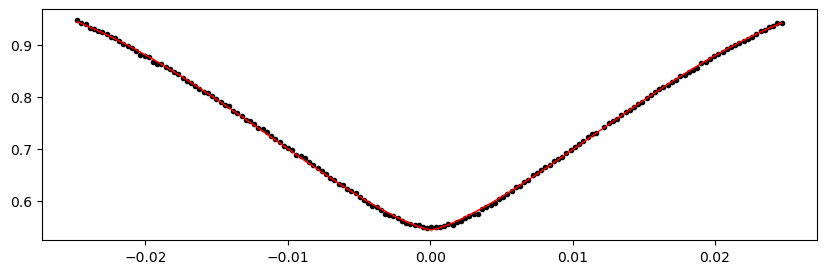

1671.805842 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.70it/s]


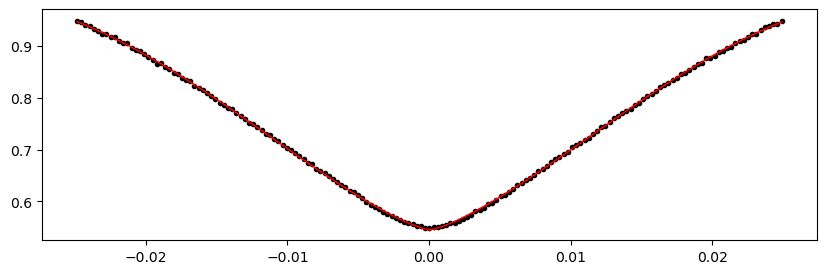

1676.495086 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.61it/s]


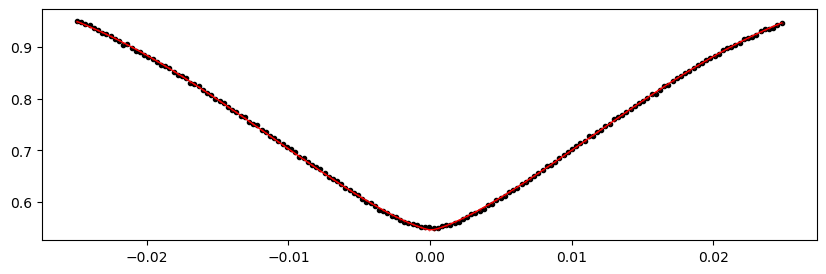

1681.18433 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.65it/s]


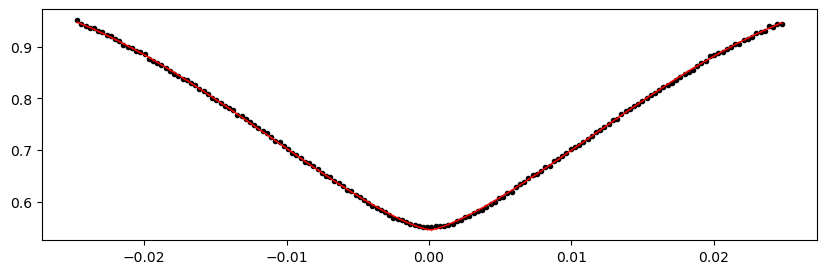

2037.566874 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.10it/s]


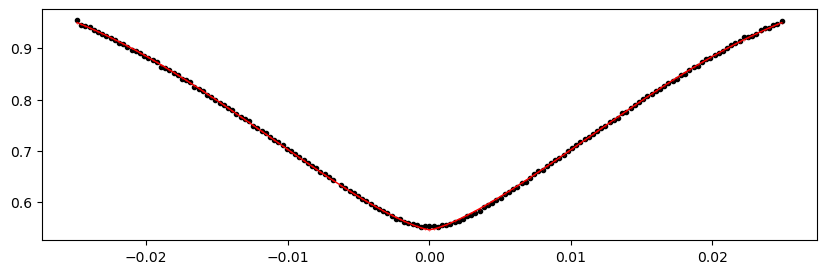

2042.256118 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.73it/s]


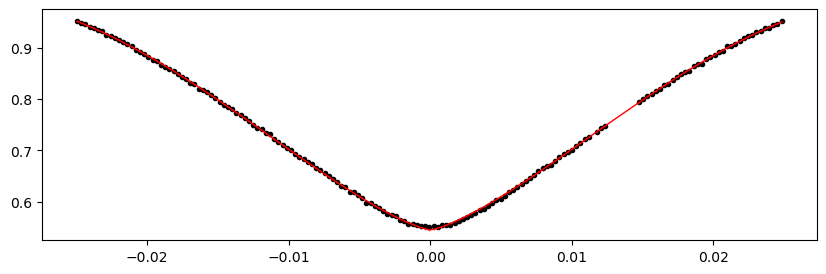

2046.945362 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.78it/s]


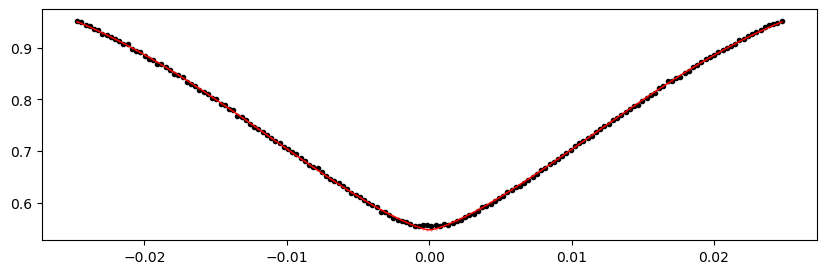

2051.634606 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.76it/s]


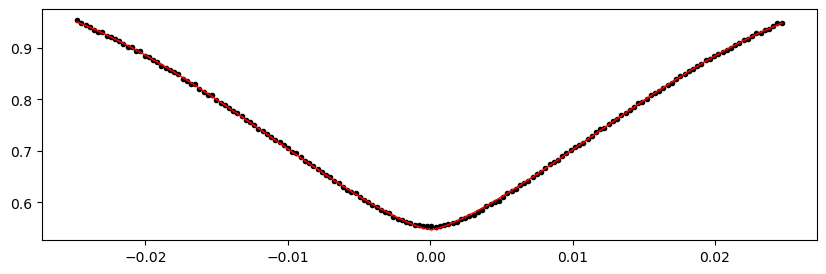

2056.32385 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 314.02it/s]


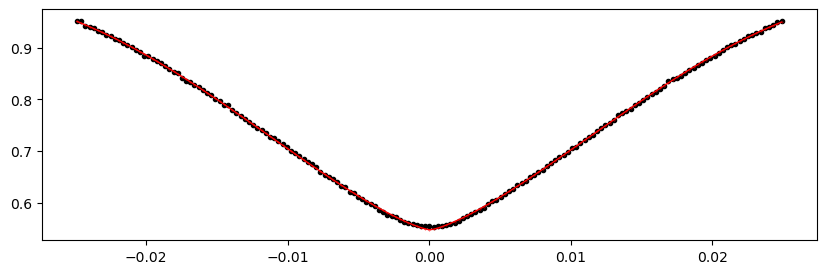

2089.148558 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.06it/s]


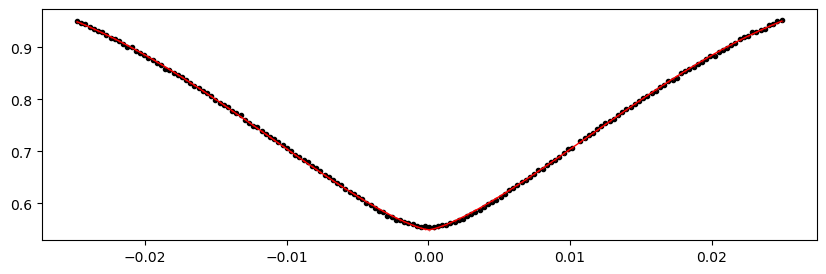

2093.837802 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.01it/s]


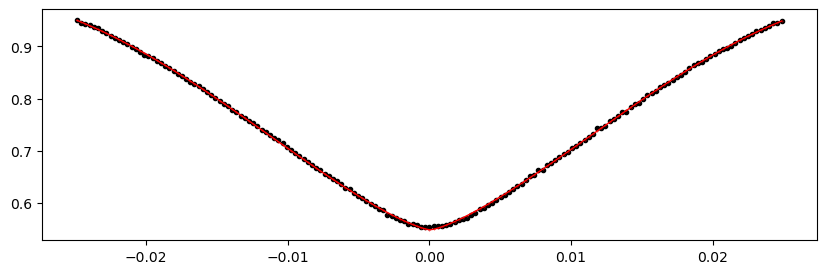

2098.527046 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.12it/s]


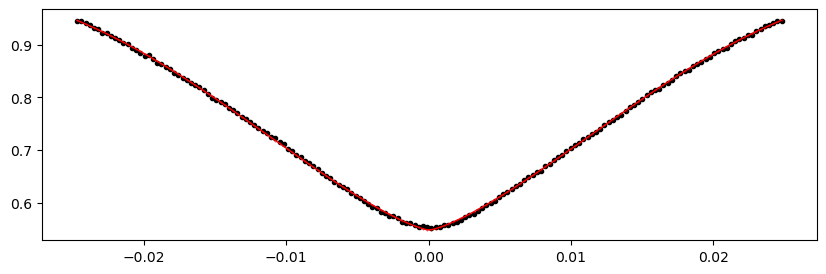

2103.2162900000003 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 344.86it/s]


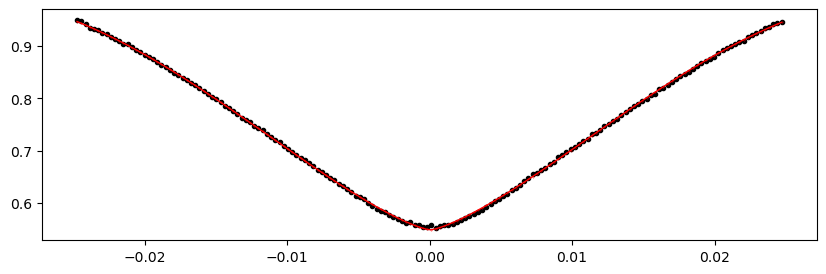

2107.905534 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.84it/s]


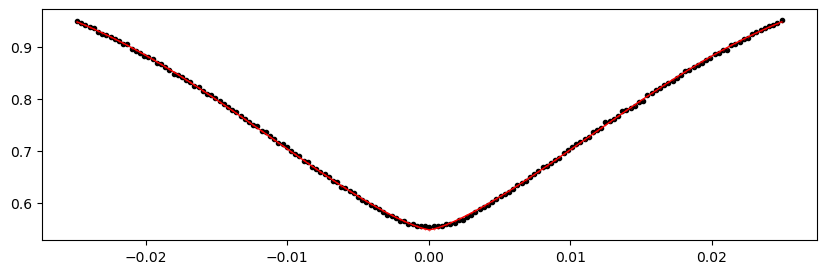

2112.594778 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 344.83it/s]


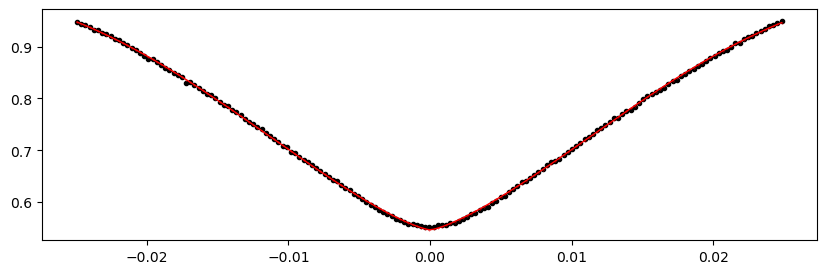

2117.284022 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.53it/s]


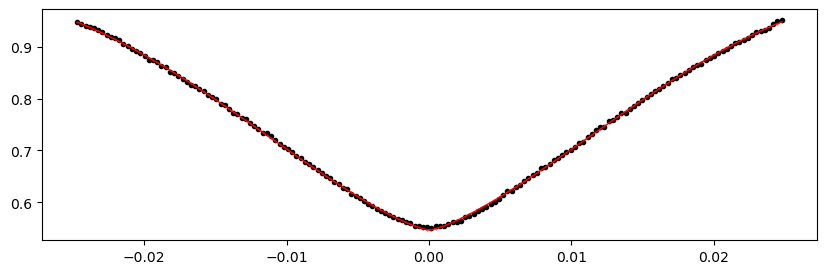

2121.973266 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.64it/s]


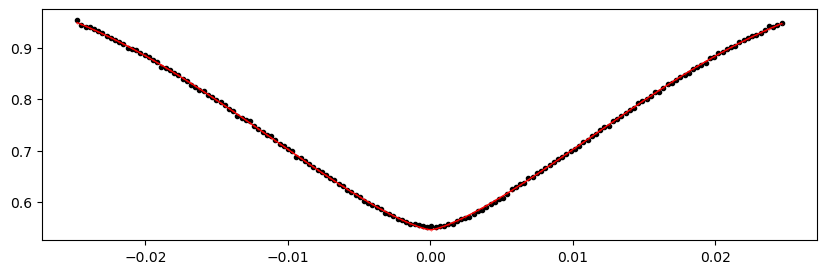

2126.66251 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.00it/s]


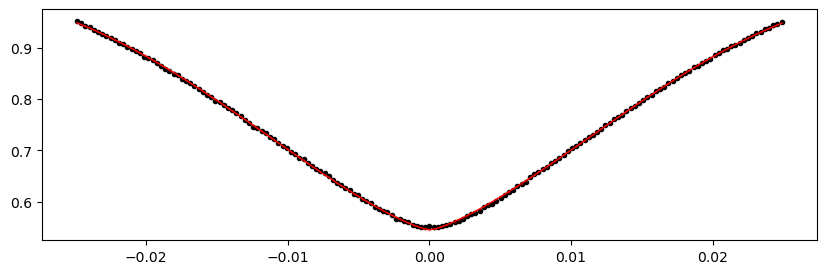

2131.3517540000003 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.10it/s]


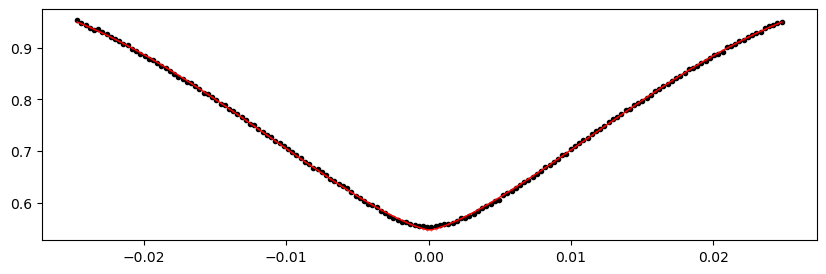

2136.040998 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.38it/s]


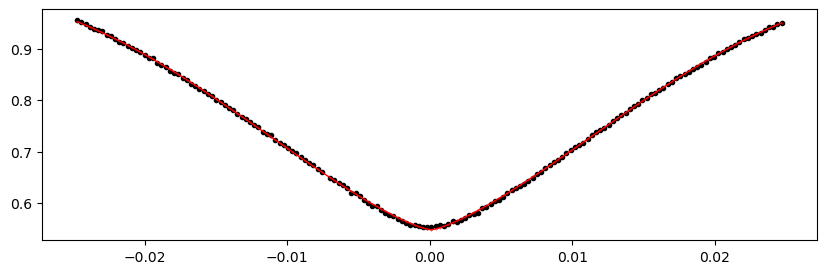

2140.730242 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.12it/s]


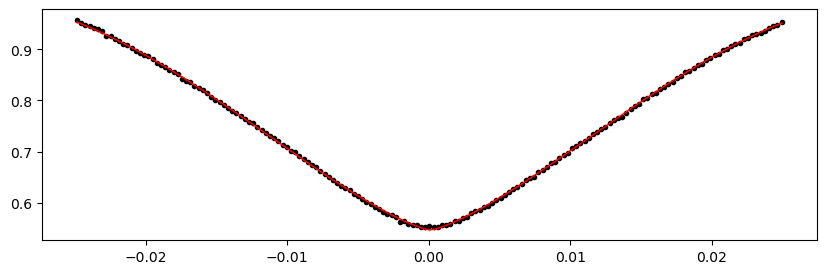

2145.4194860000002 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.39it/s]


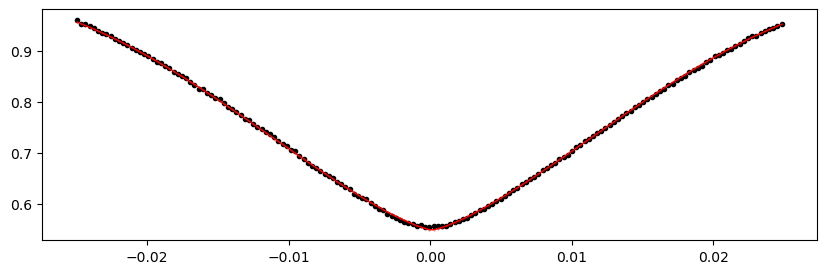

2150.10873 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.12it/s]


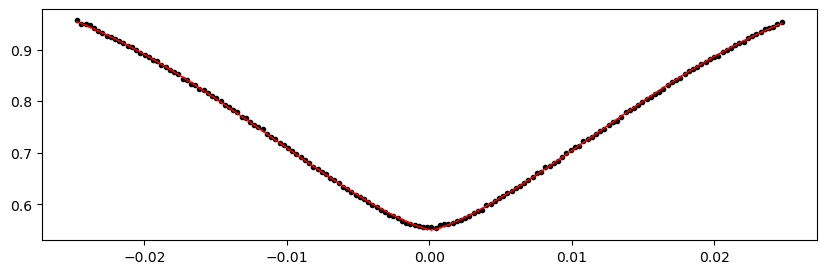

2154.797974 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.14it/s]


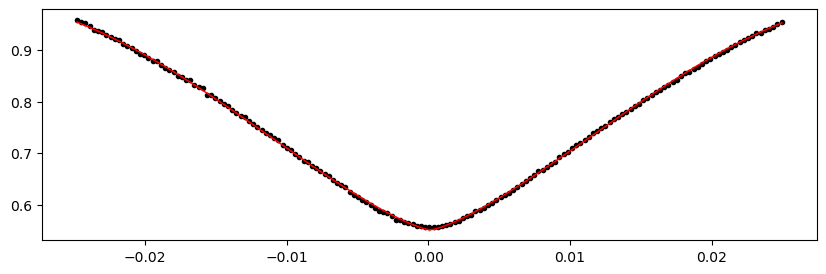

2159.487218 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.45it/s]


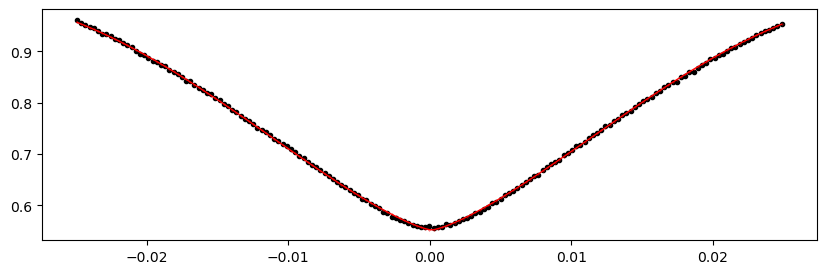

2164.1764620000004 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.64it/s]


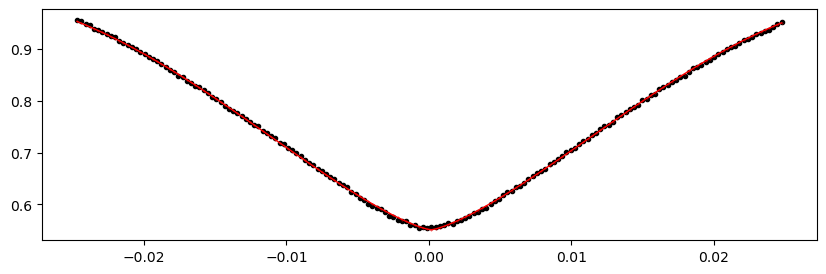

2168.865706 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.99it/s]


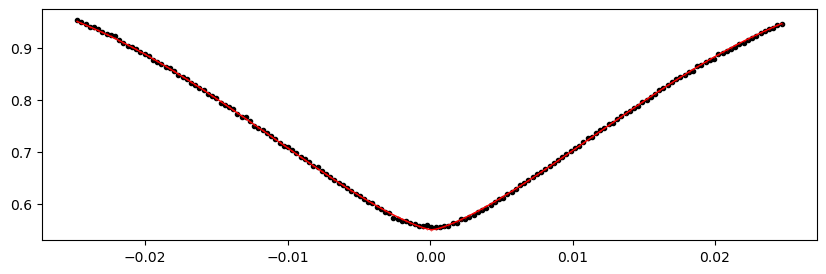

2178.244194 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.55it/s]


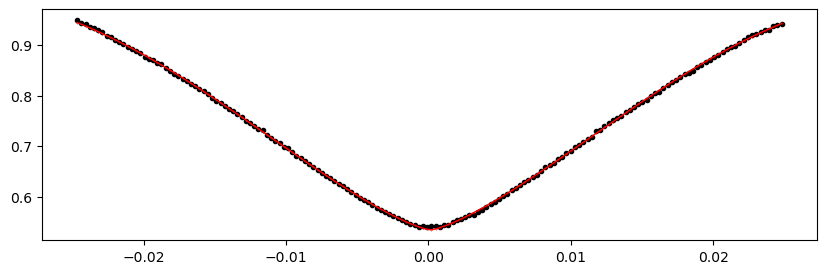

2182.933438 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.66it/s]


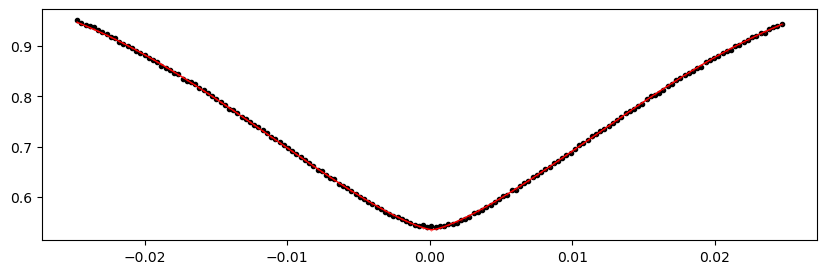

2187.622682 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.41it/s]


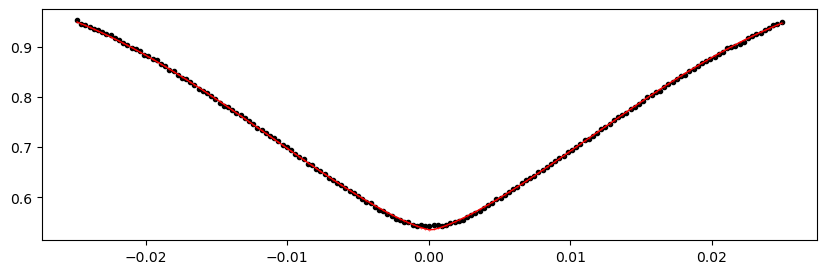

2192.3119260000003 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.56it/s]


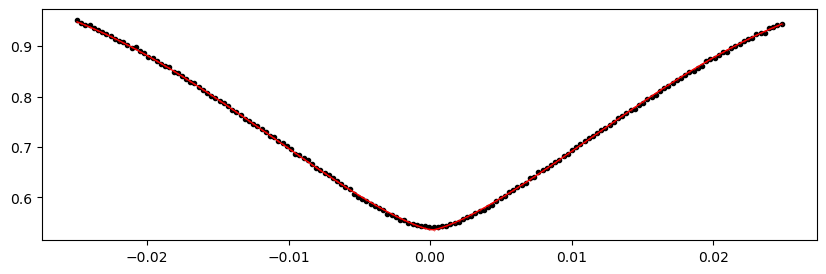

2197.00117 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.00it/s]


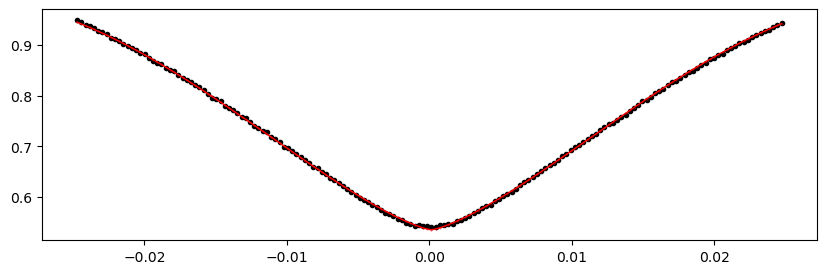

2201.690414 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 417.57it/s]


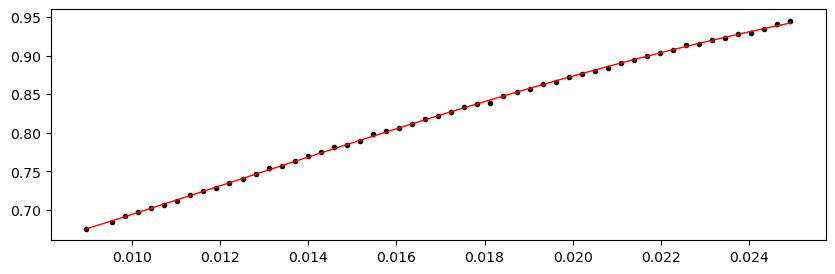

2206.379658 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.03it/s]


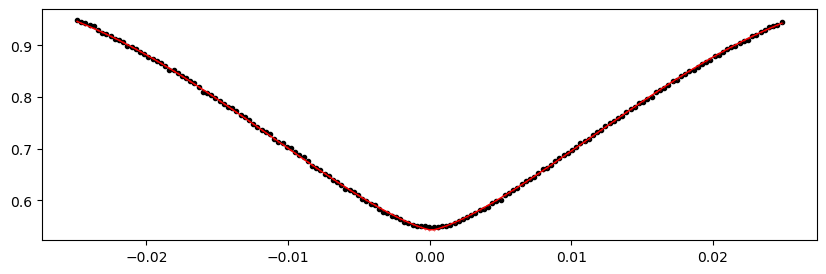

2211.068902 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.41it/s]


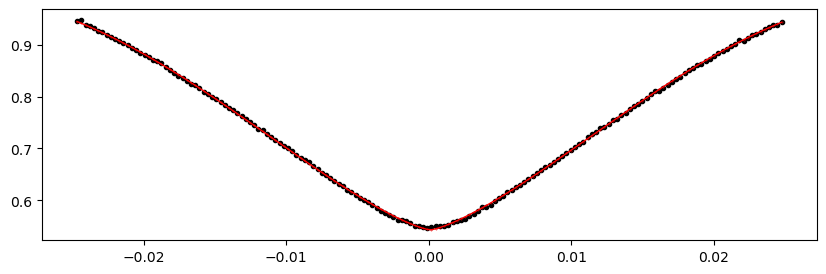

2215.758146 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.48it/s]


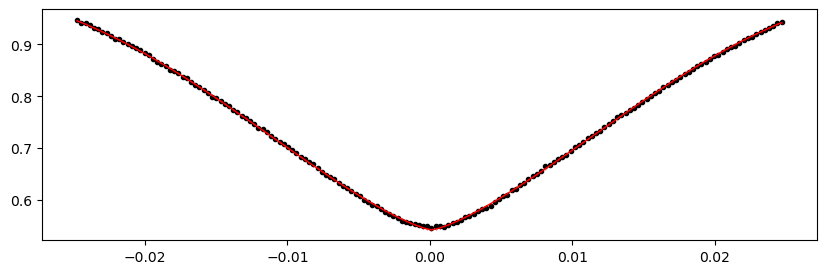

2220.4473900000003 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.00it/s]


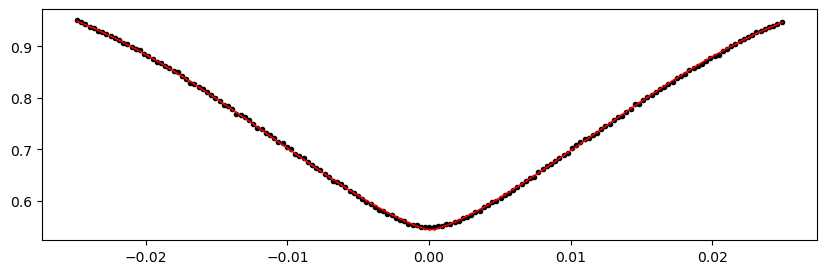

2225.136634 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 306.27it/s]


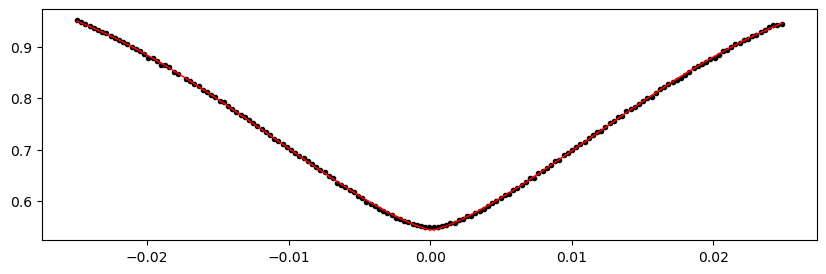

2229.825878 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 311.88it/s]


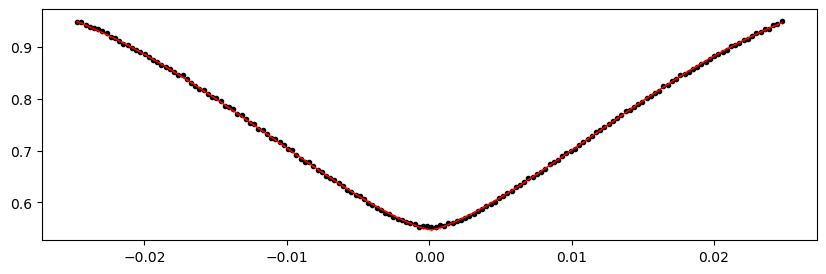

2234.5151220000002 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.04it/s]


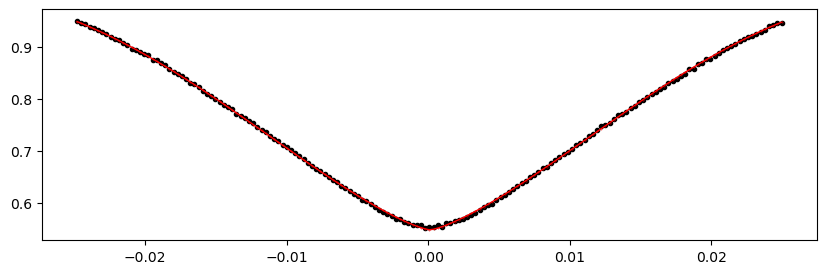

2239.204366 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 334.12it/s]


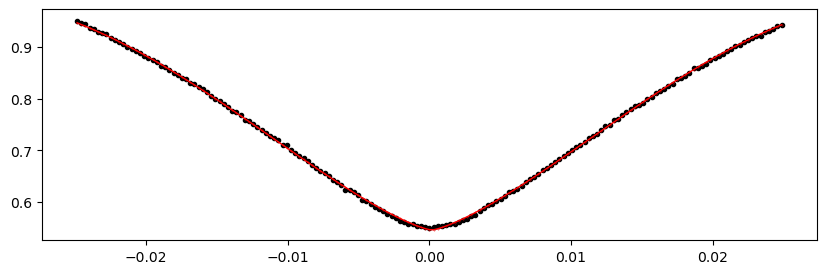

2243.89361 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.43it/s]


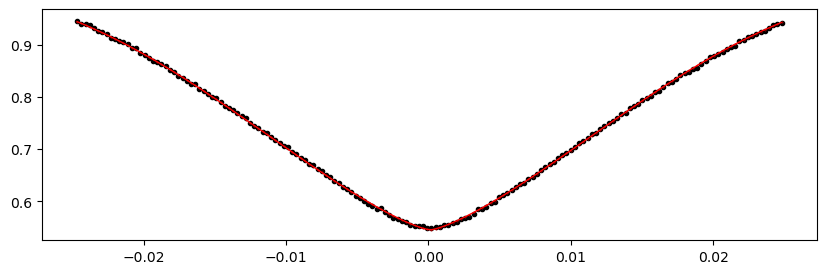

2248.582854 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.20it/s]


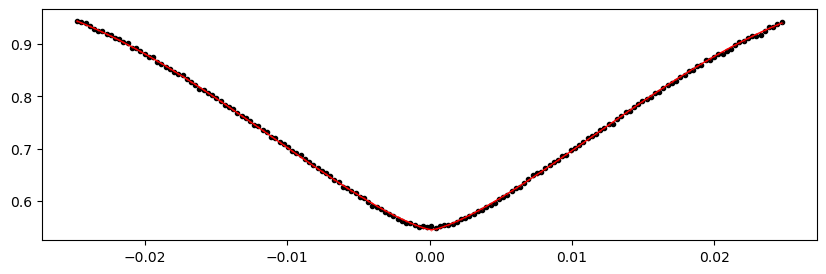

2253.272098 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.84it/s]


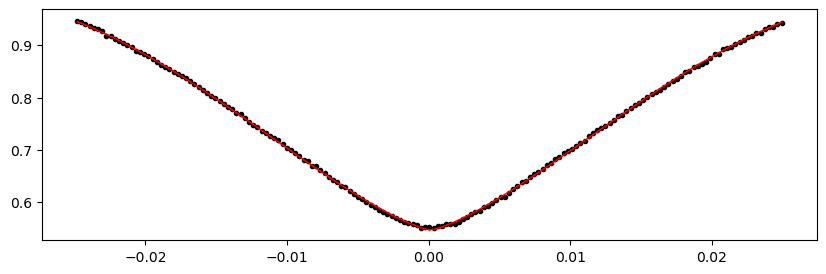

2257.961342 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.43it/s]


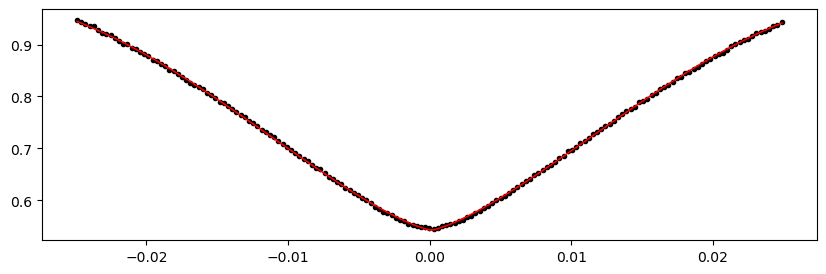

2262.650586 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.83it/s]


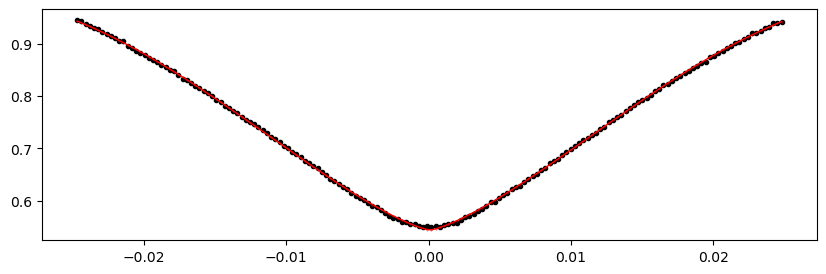

2272.029074 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.91it/s]


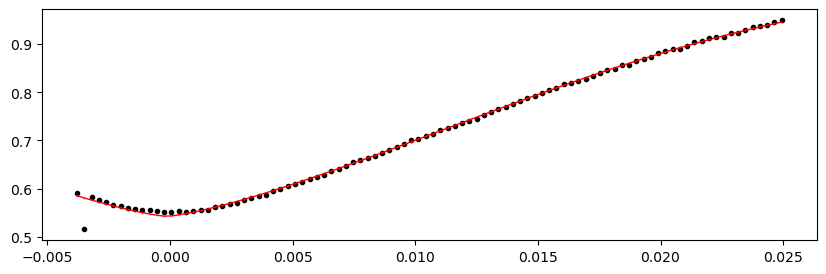

2276.718318 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.86it/s]


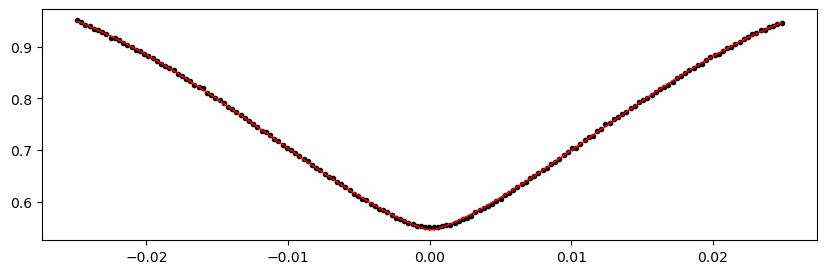

2286.096806 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.02it/s]


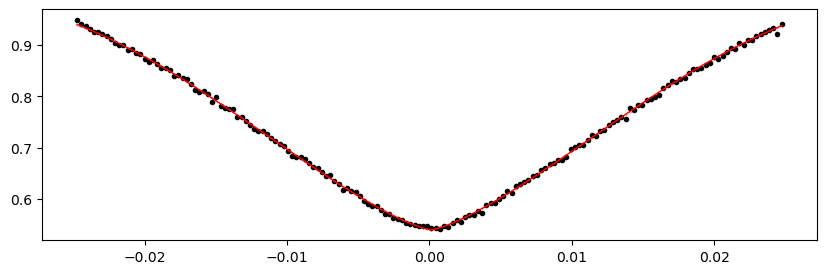

2290.78605 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.43it/s]


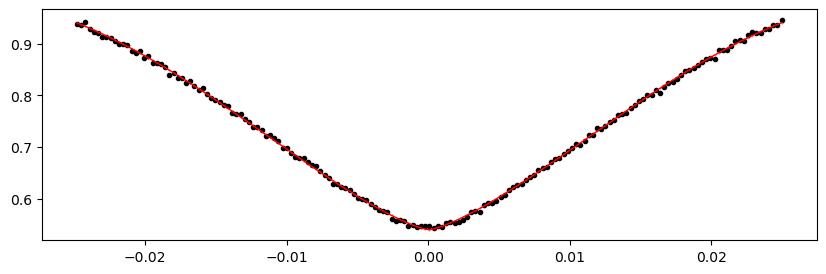

2295.475294 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.33it/s]


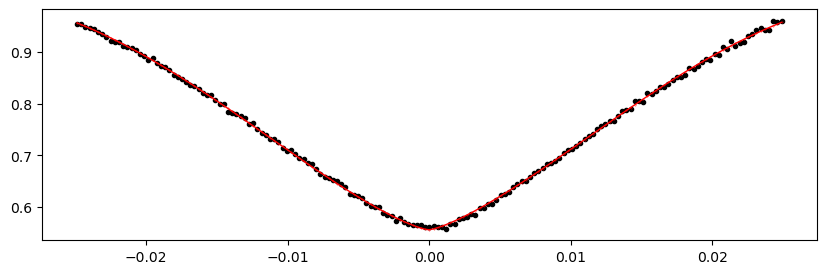

2300.164538 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.39it/s]


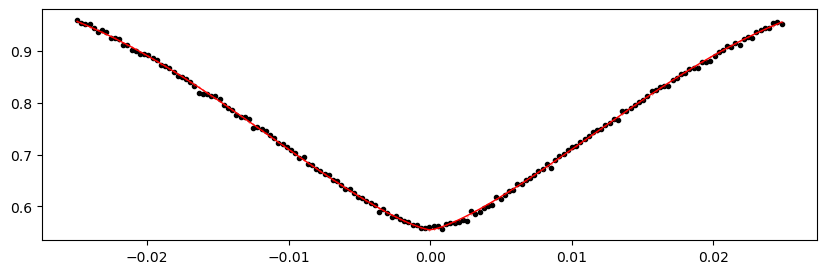

2304.853782 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.28it/s]


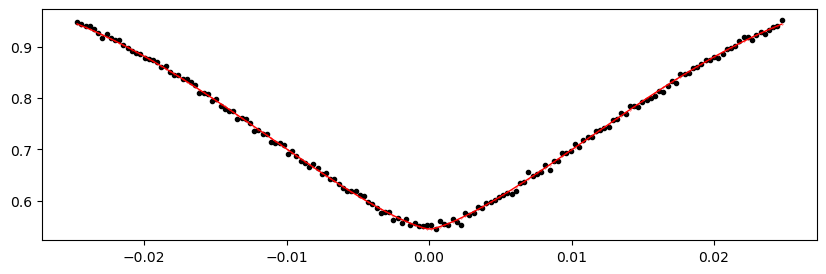

2309.5430260000003 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.63it/s]


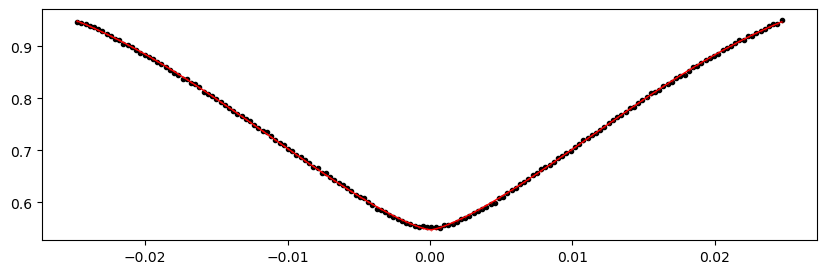

2314.23227 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.53it/s]


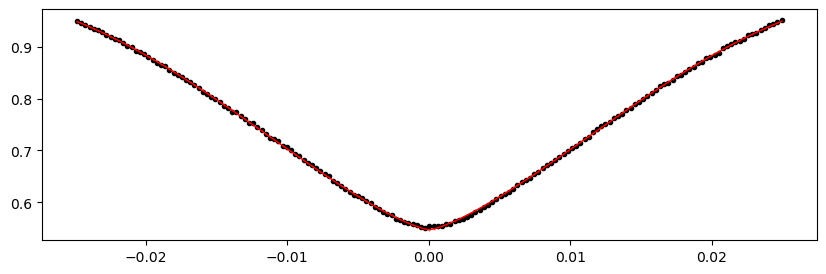

2318.921514 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 316.41it/s]


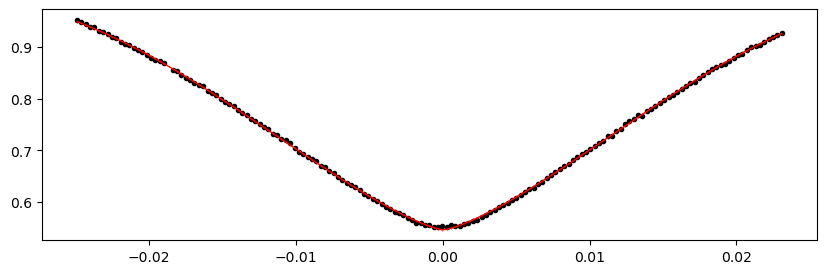

2323.610758 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 334.13it/s]


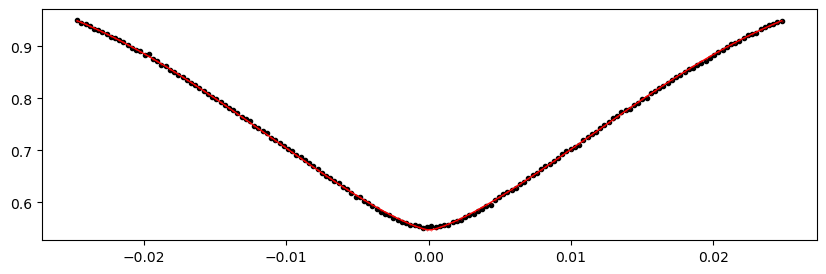

2328.300002 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.14it/s]


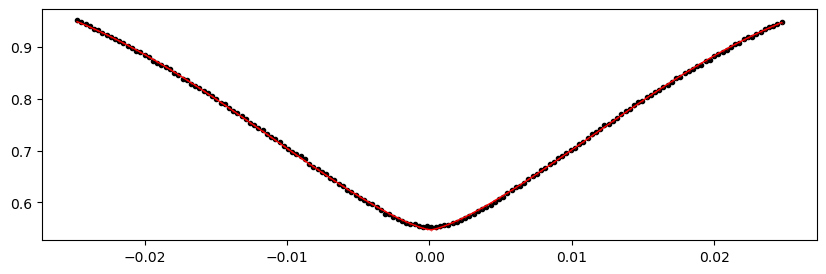

2337.6784900000002 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.57it/s]


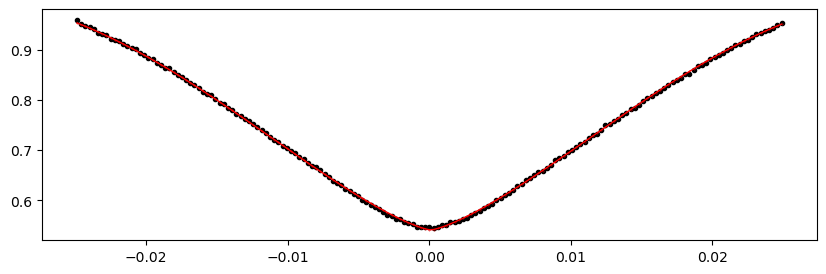

2342.367734 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.36it/s]


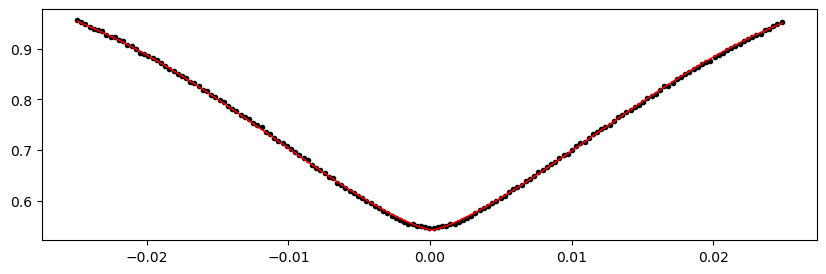

2351.746222 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 334.38it/s]


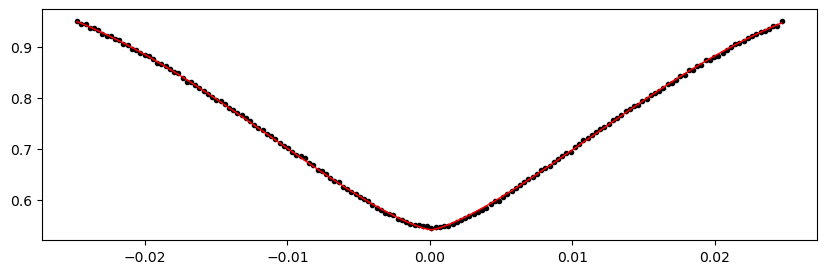

2356.435466 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.58it/s]


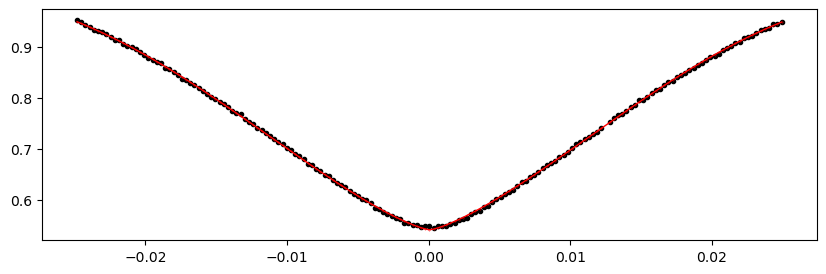

2365.813954 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 306.09it/s]


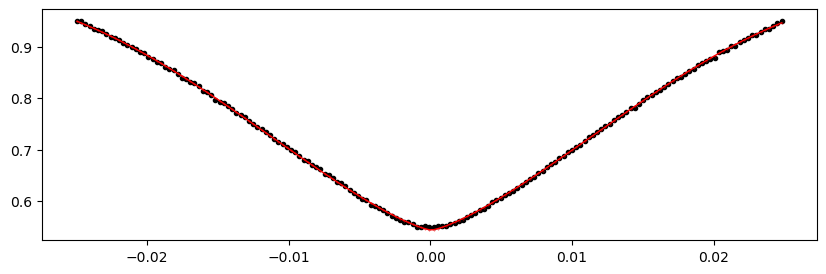

2370.5031980000003 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.09it/s]


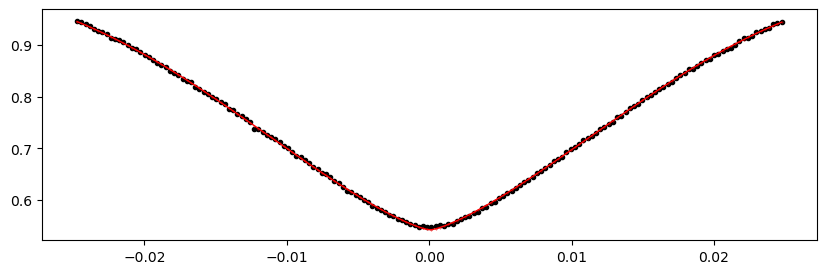

2379.881686 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.81it/s]


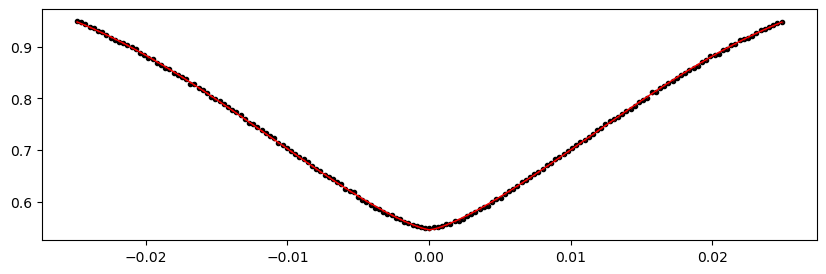

2384.57093 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.27it/s]


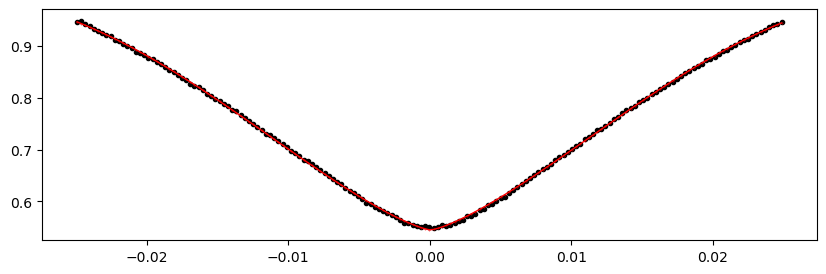

2389.260174 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.45it/s]


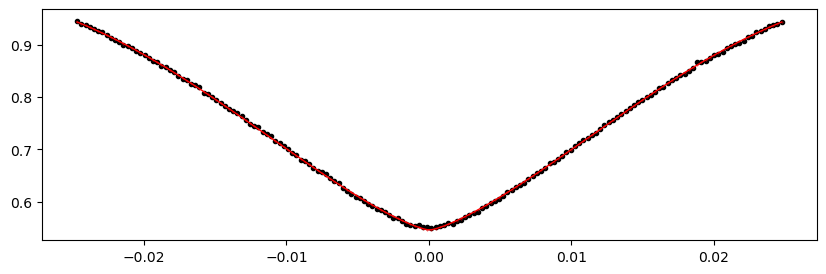

2966.0371860000005 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.40it/s]


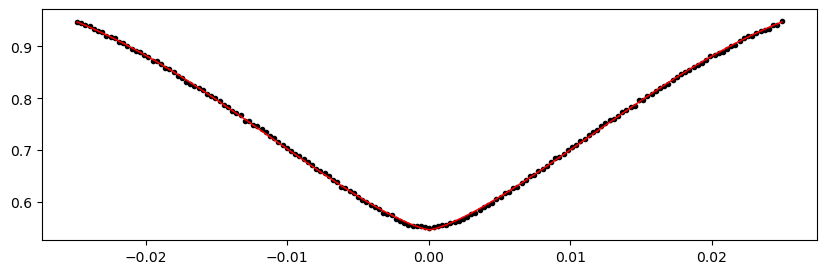

2970.72643 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.26it/s]


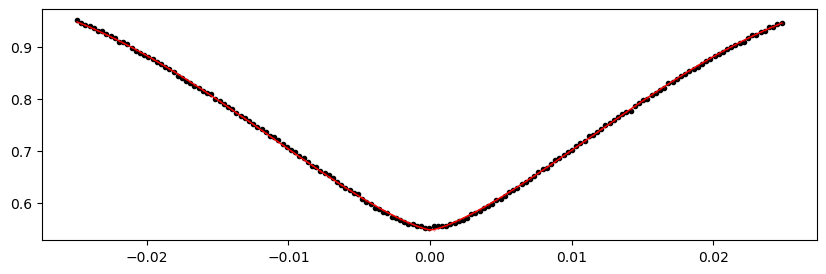

2980.104918 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.23it/s]


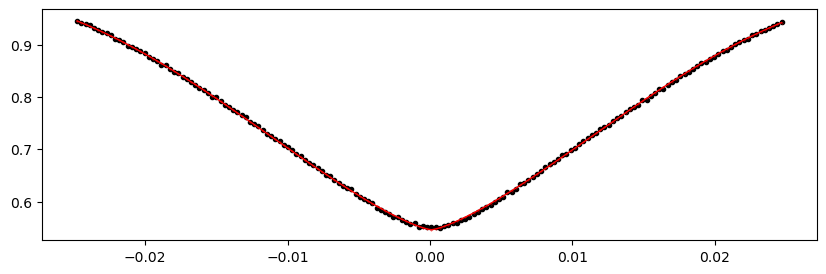

2984.794162 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.07it/s]


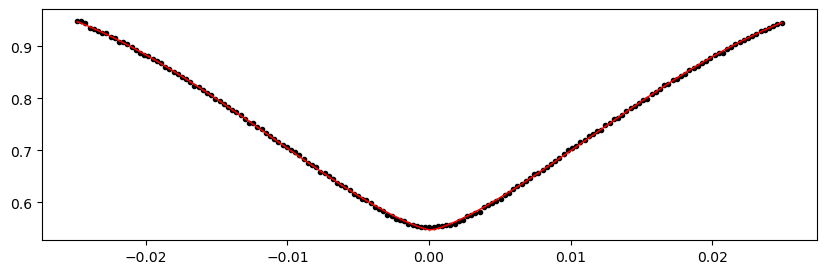

2994.1726500000004 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.11it/s]


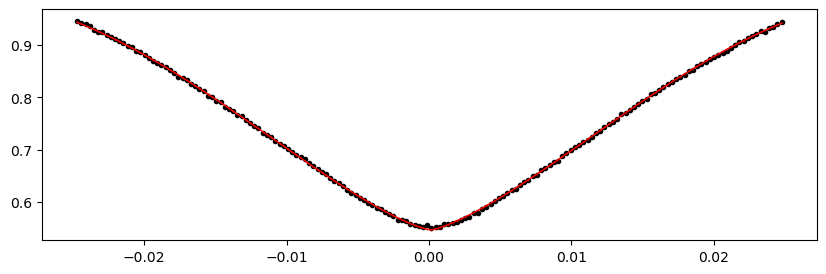

2998.861894 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.95it/s]


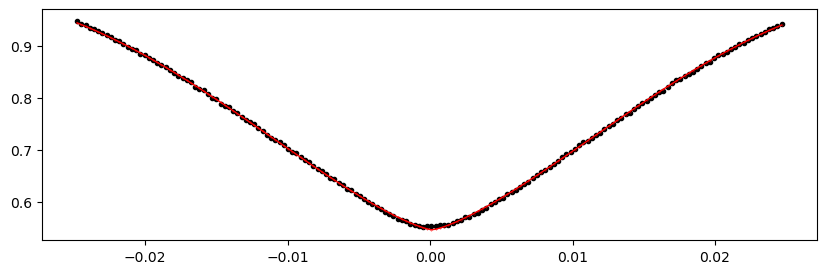

3003.551138 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.71it/s]


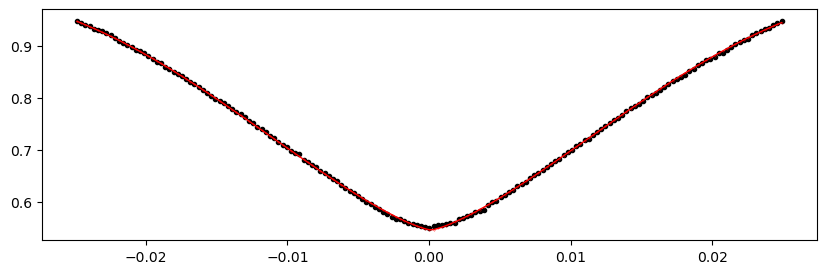

3008.240382 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.17it/s]


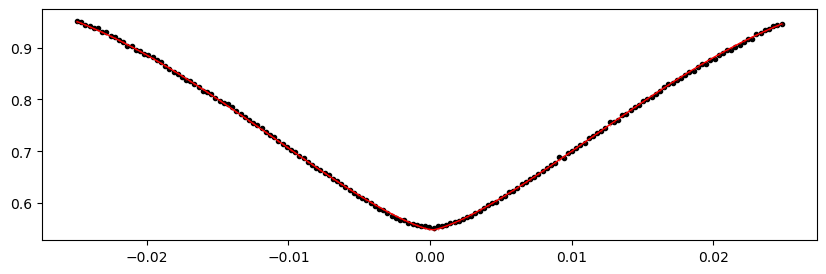

3012.929626 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.09it/s]


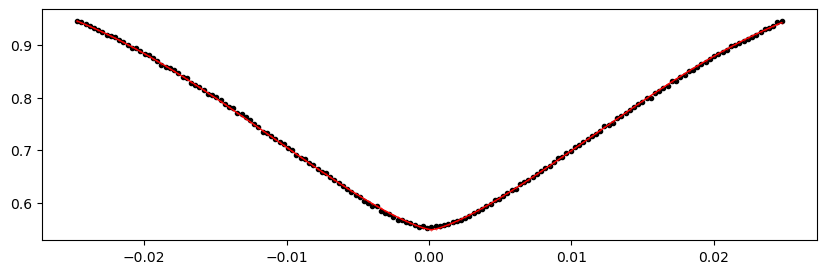

3017.6188700000002 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.14it/s]


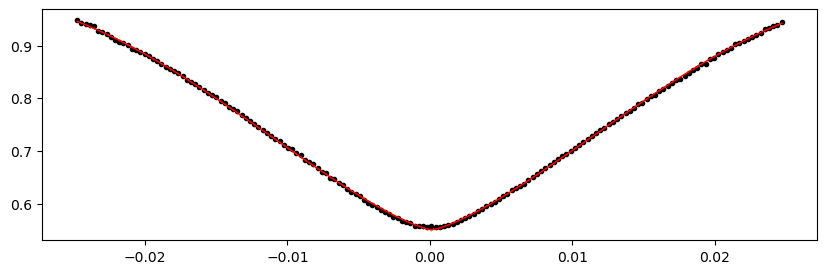

3022.3081140000004 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.94it/s]


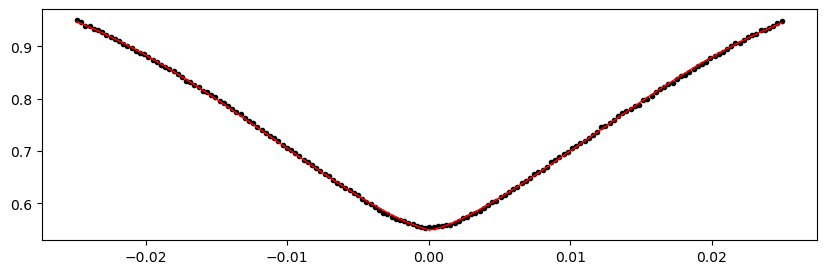

3026.997358 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.03it/s]


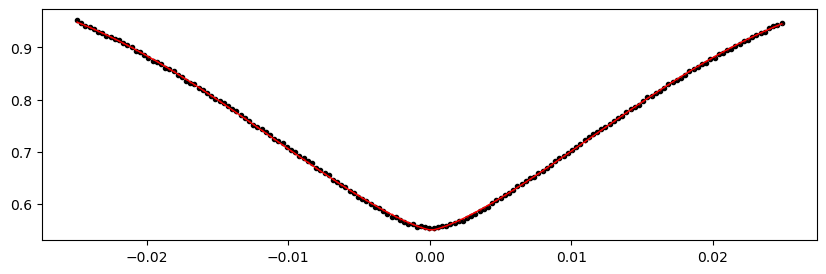

3031.686602 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.12it/s]


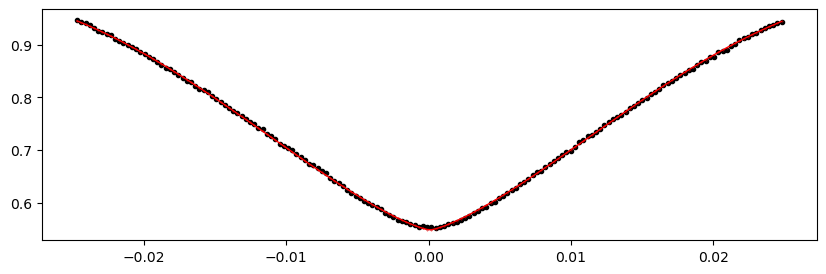

3036.375846 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.18it/s]


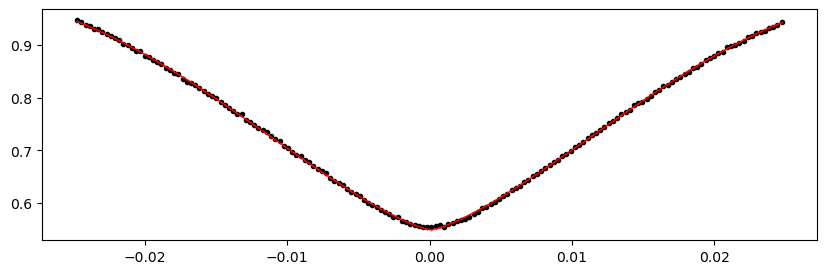

3041.06509 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 413.72it/s]


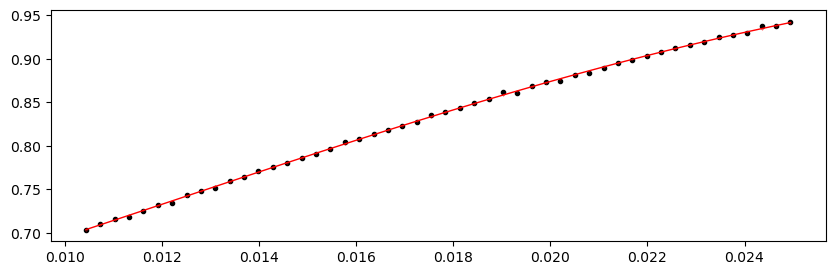

3045.754334 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.70it/s]


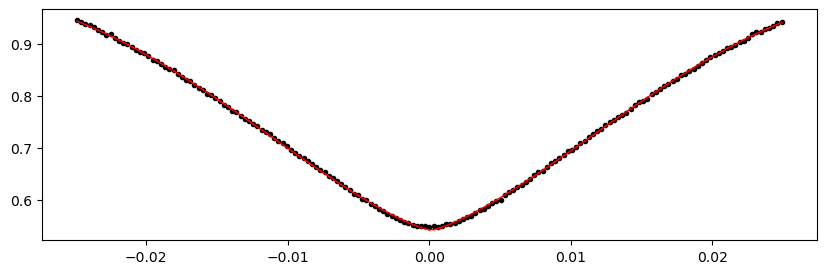

3050.4435780000003 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.72it/s]


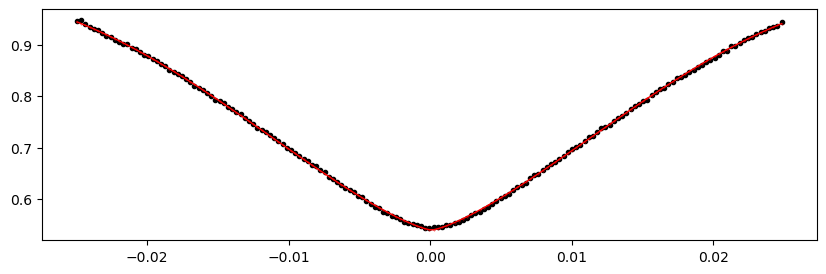

3055.1328220000005 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 414.59it/s]


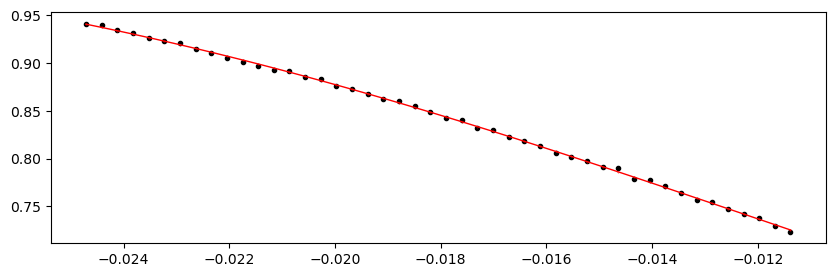

3059.822066 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.45it/s]


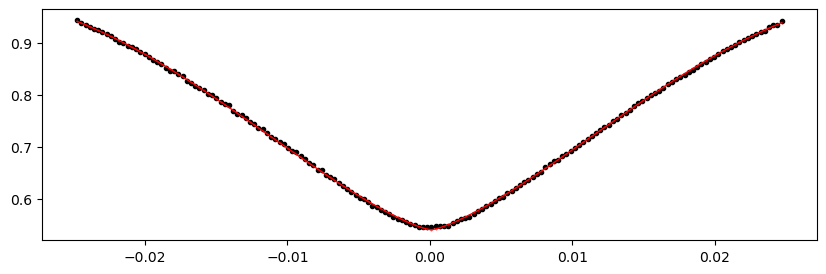

3064.51131 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 330.41it/s]


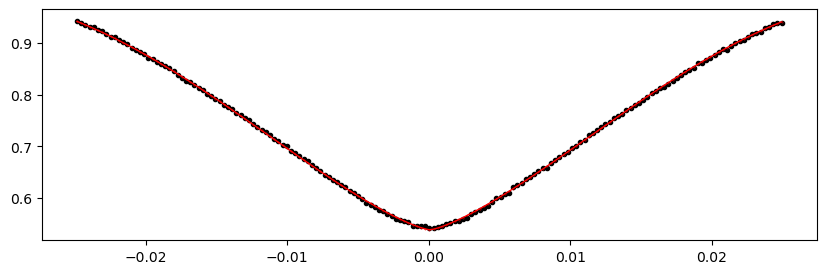

3069.200554 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.59it/s]


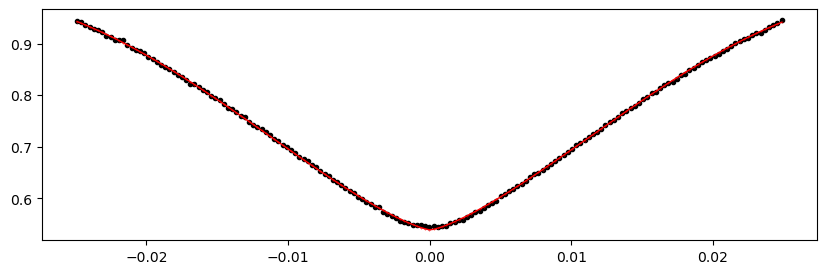

3073.889798 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.71it/s]


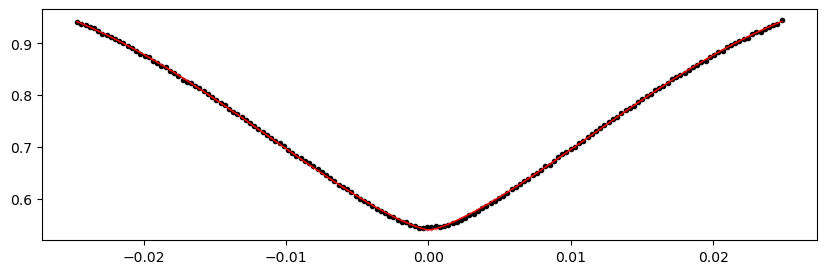

3078.5790420000003 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.26it/s]


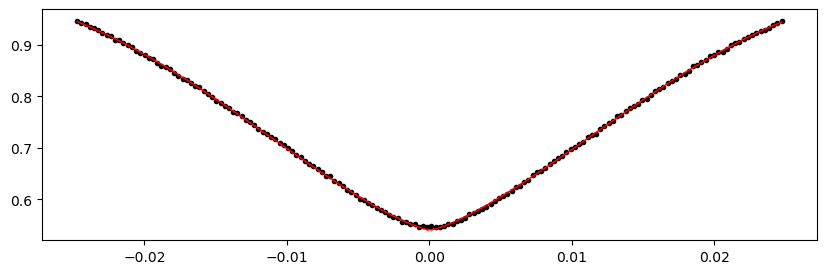

3083.2682860000004 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.08it/s]


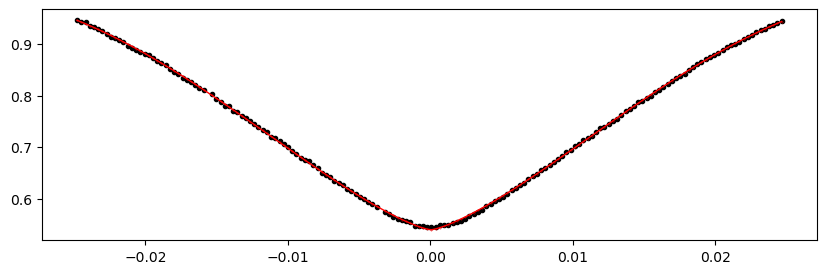

3087.95753 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 329.33it/s]


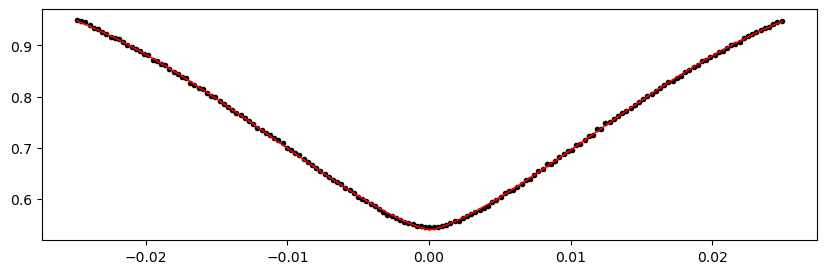

3092.646774 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 333.31it/s]


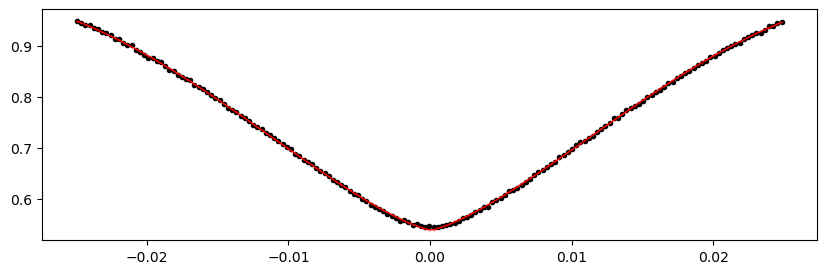

3102.025262 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 331.35it/s]


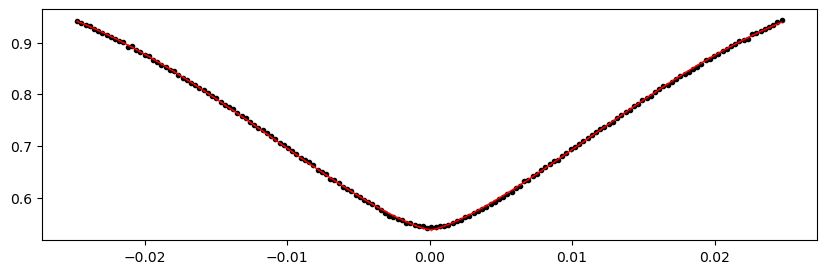

3106.7145060000003 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 332.26it/s]


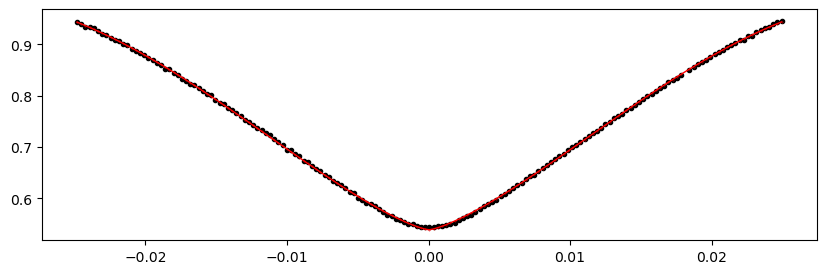

3111.4037500000004 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.79it/s]


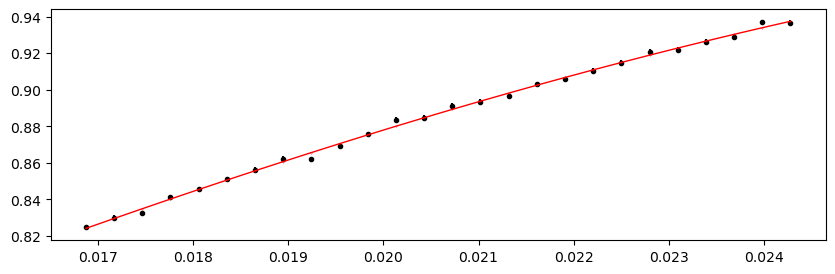

3116.092994 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 329.27it/s]


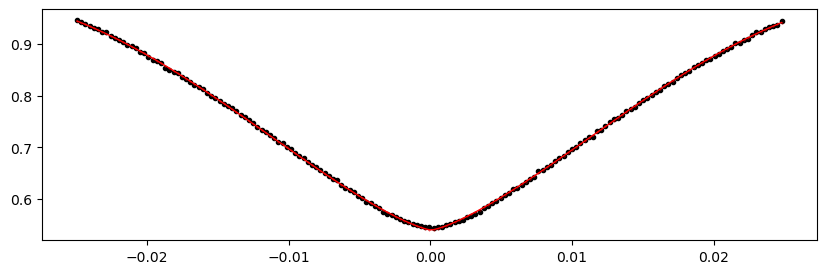

3120.7822380000002 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.73it/s]


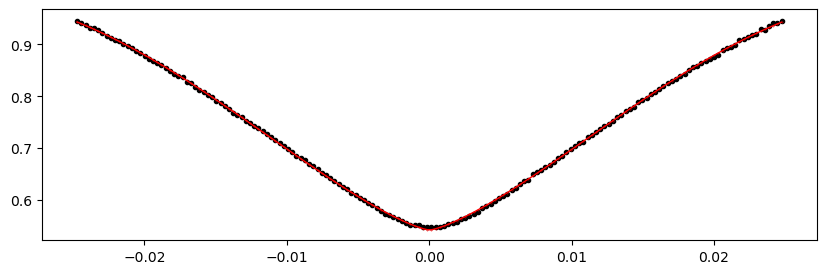

3130.160726 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 330.80it/s]


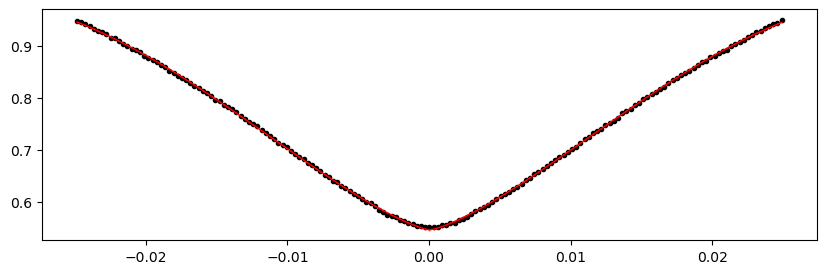

3134.84997 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 328.03it/s]


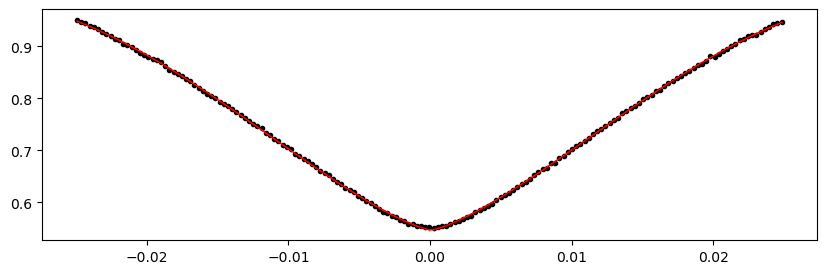

3144.228458 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.88it/s]


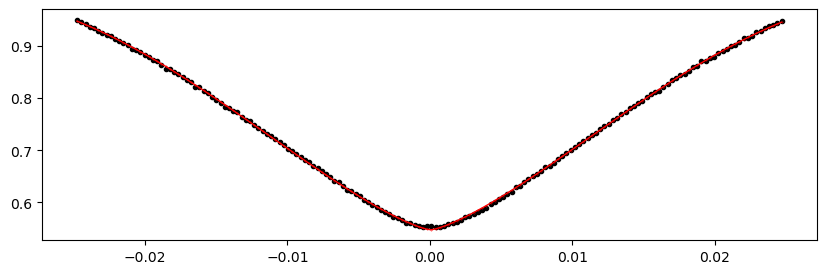

3148.917702 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.81it/s]


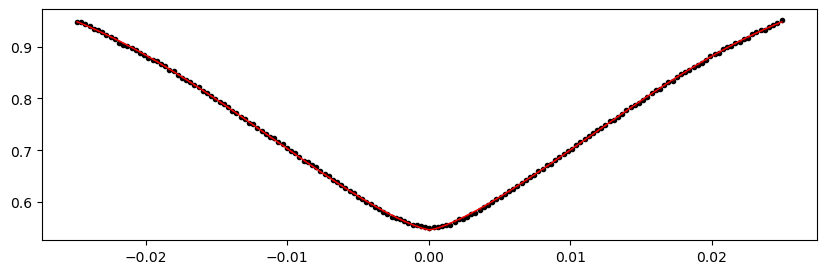

3158.29619 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.24it/s]


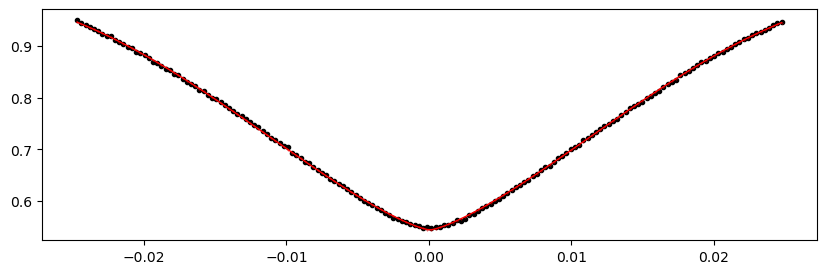

3162.985434 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.88it/s]


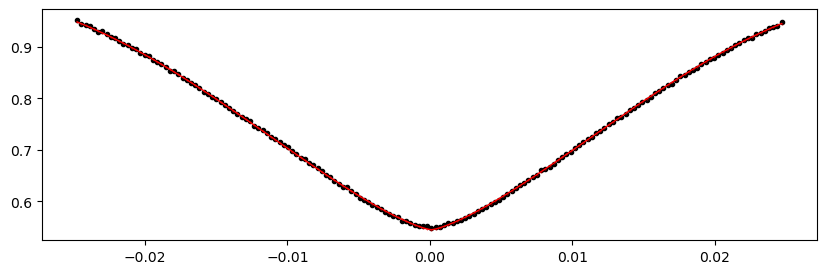

3172.3639220000005 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.84it/s]


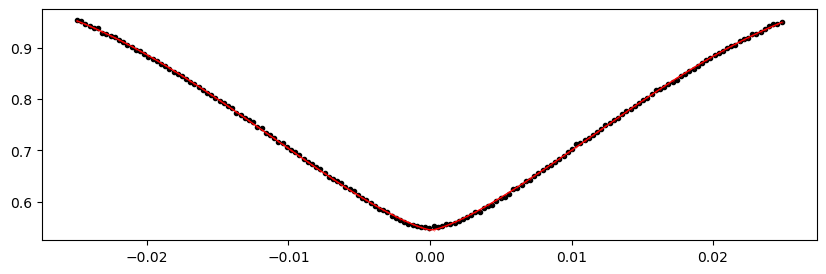

3177.053166 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.12it/s]


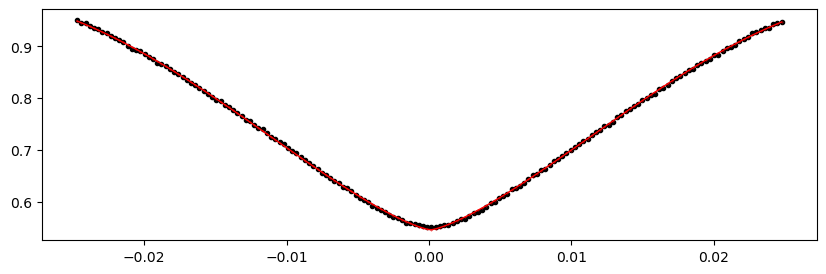

3186.431654 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.19it/s]


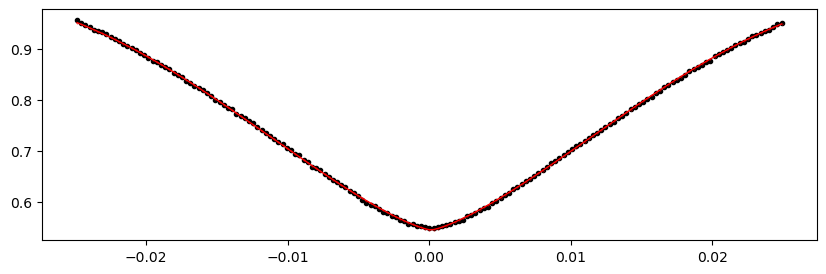

3191.120898 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.53it/s]


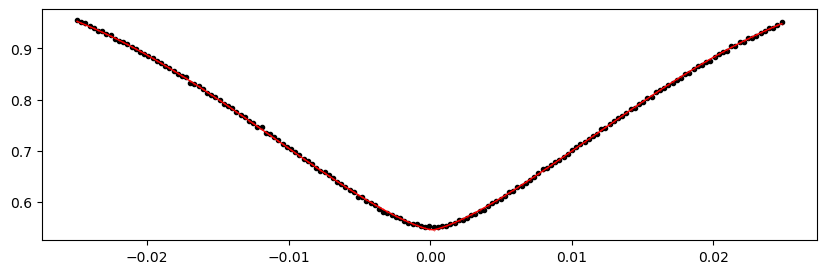

3195.8101420000003 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 344.97it/s]


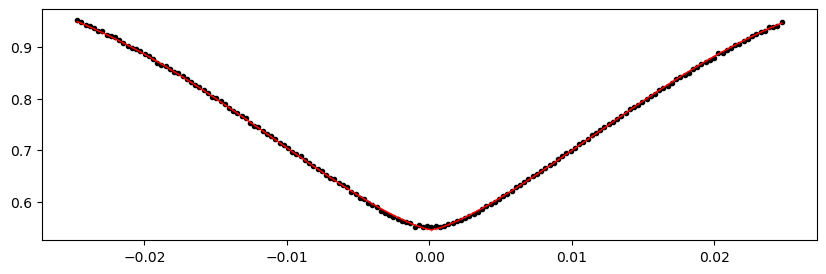

3200.4993860000004 1.0211653276225232 -0.47613977945730757 0.22507702764520632


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.65it/s]


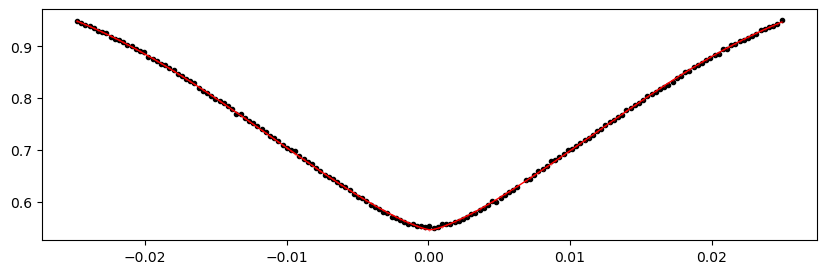

In [49]:
%matplotlib inline

print("Fitting individual primary eclipses...")
etv_functions.fit_each_eclipse(data_primary, n_transits, t0_primary, period, mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, outfile_path)
!$NOTIFY_CMD "Individual primary eclipses fit done"


Fitting individual secondary eclipses...
Existing manifest file found, will skip previously processed LCs and append to end of manifest file
Number 0 has already been completed -- skip
1416.2420439999999 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.23it/s]


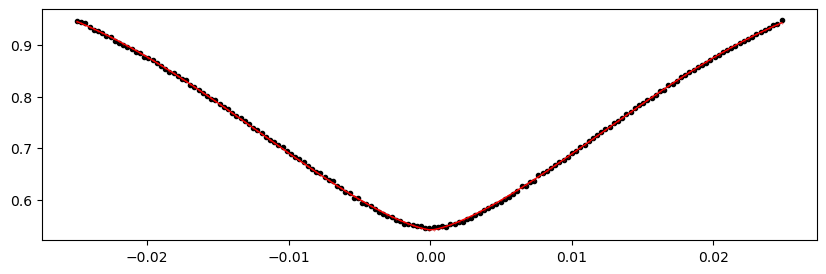

1425.620532 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.67it/s]


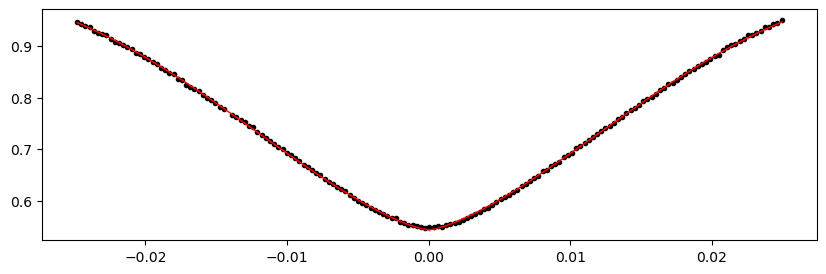

1430.3097759999998 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.22it/s]


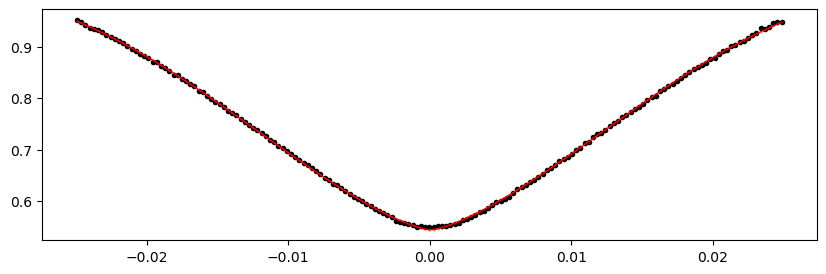

1434.99902 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.53it/s]


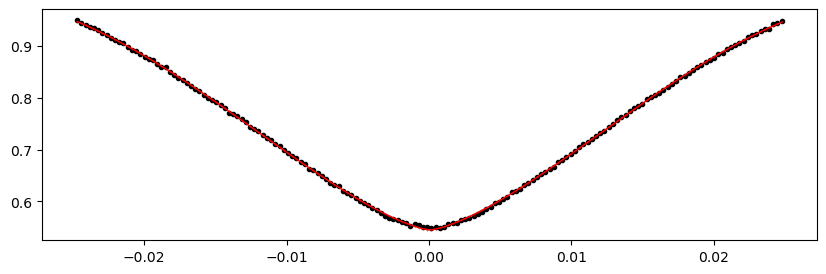

1439.688264 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.63it/s]


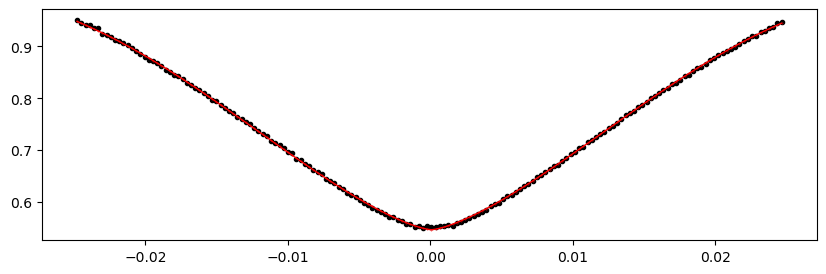

1444.377508 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 324.53it/s]


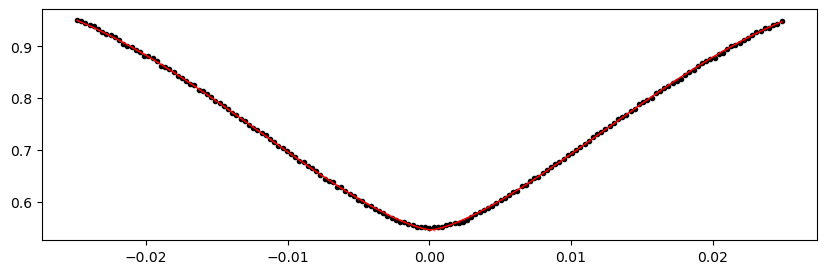

1449.066752 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.61it/s]


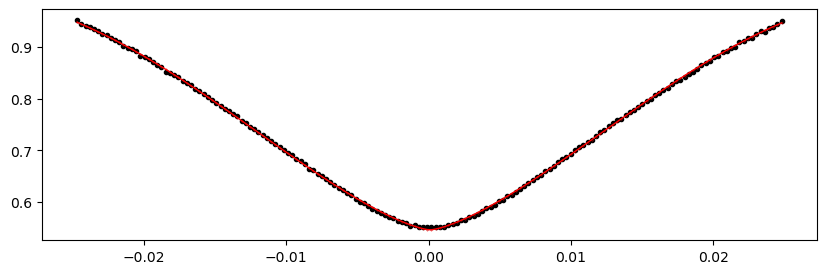

1453.7559959999999 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.26it/s]


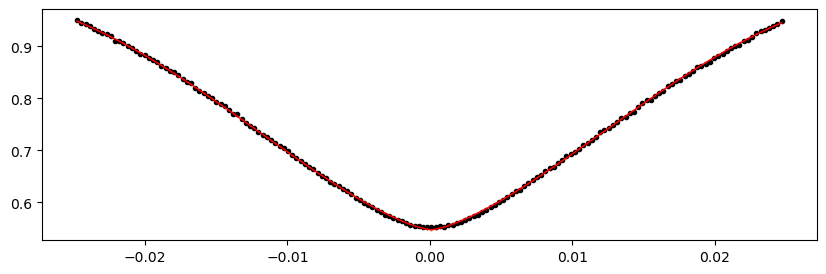

1458.44524 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.00it/s]


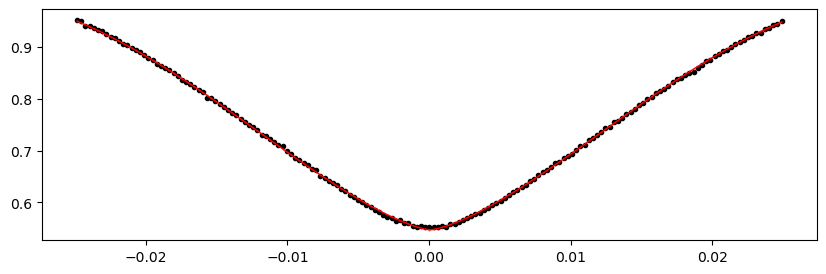

1463.134484 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.87it/s]


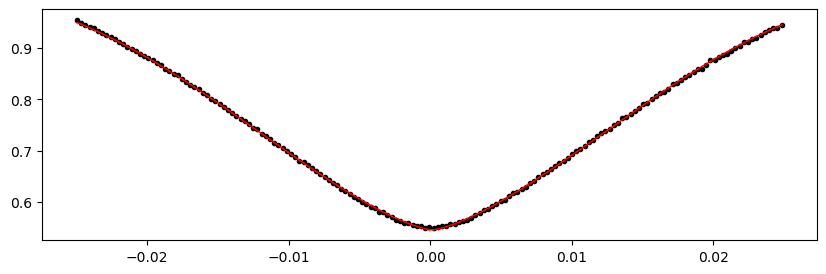

1472.512972 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.09it/s]


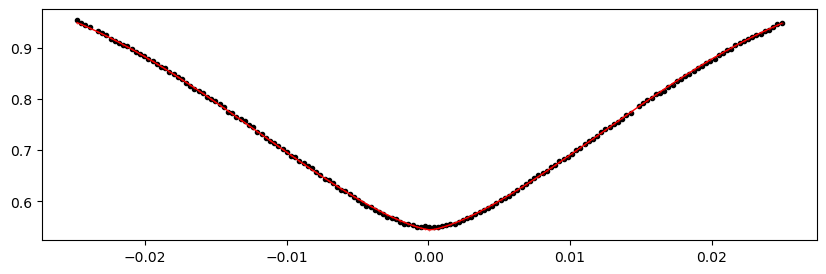

1481.8914599999998 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.02it/s]


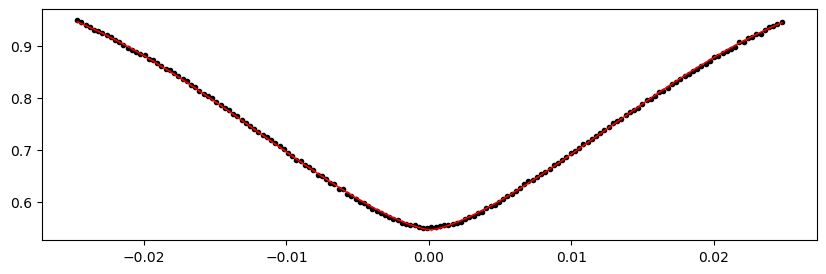

1486.580704 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.80it/s]


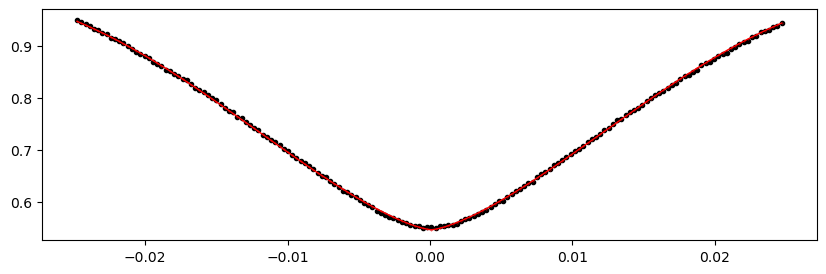

1495.959192 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.86it/s]


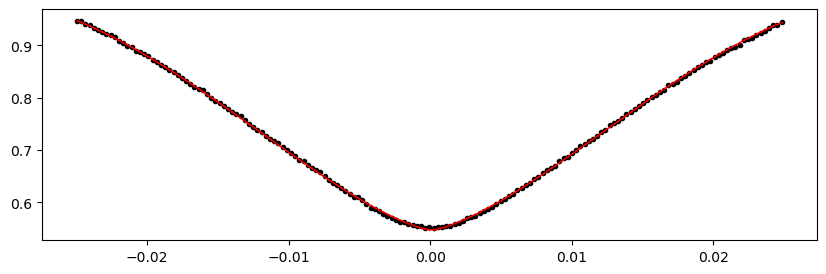

1500.648436 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.20it/s]


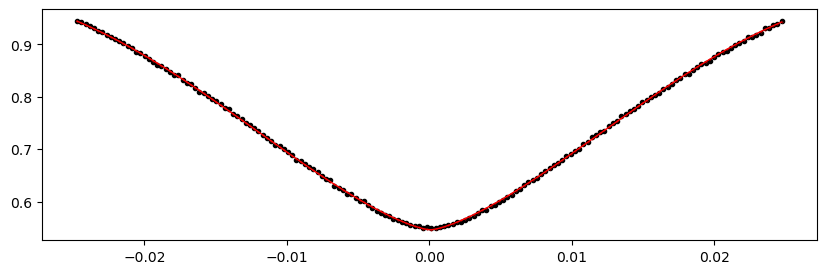

1505.3376799999999 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.78it/s]


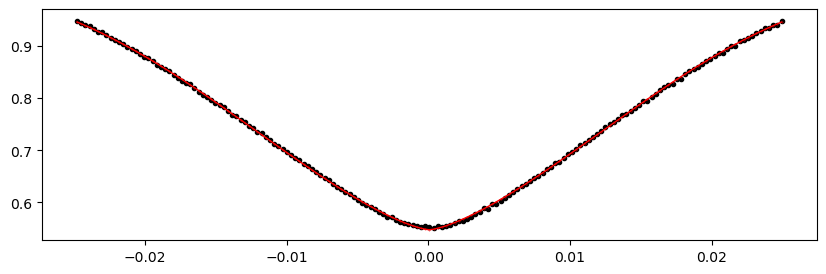

1510.026924 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.21it/s]


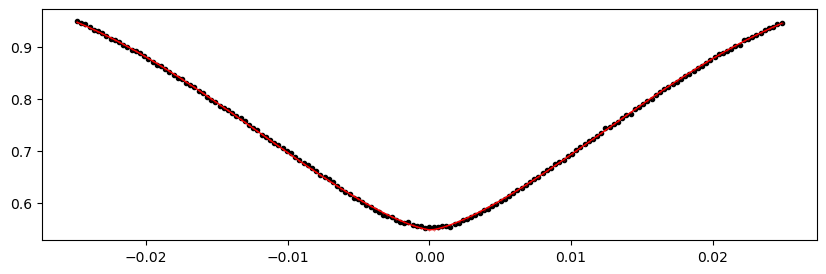

1514.716168 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.38it/s]


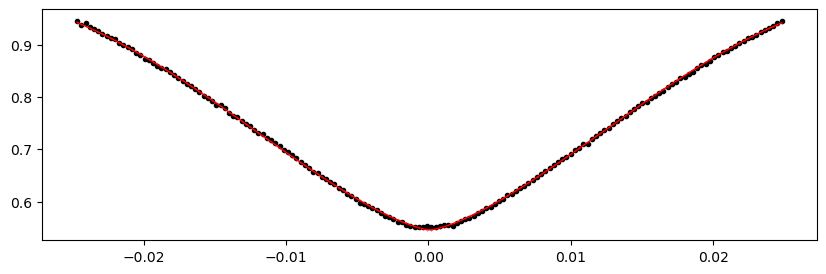

1519.4054119999998 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 333.44it/s]


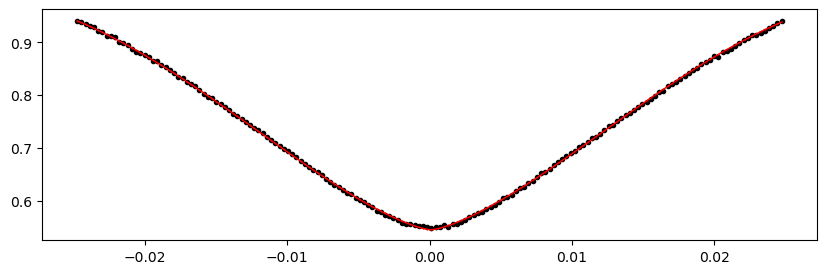

1524.094656 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.61it/s]


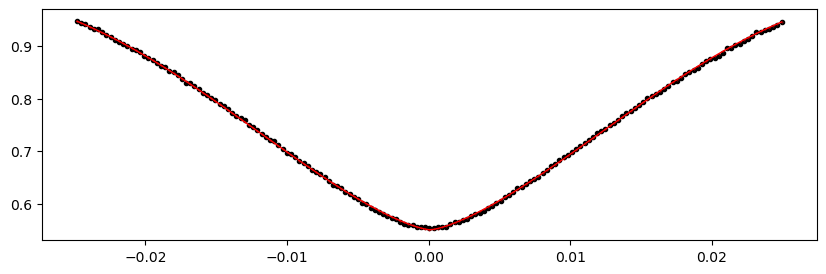

1528.7839 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.70it/s]


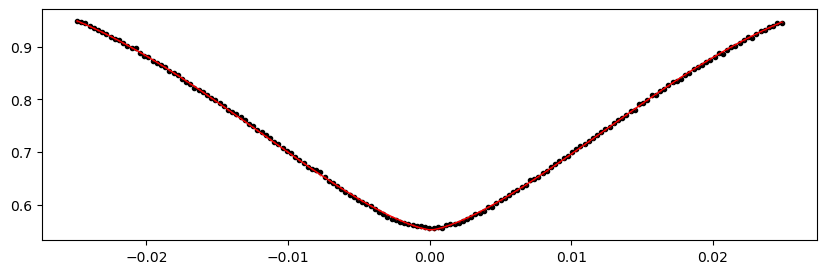

1538.162388 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.67it/s]


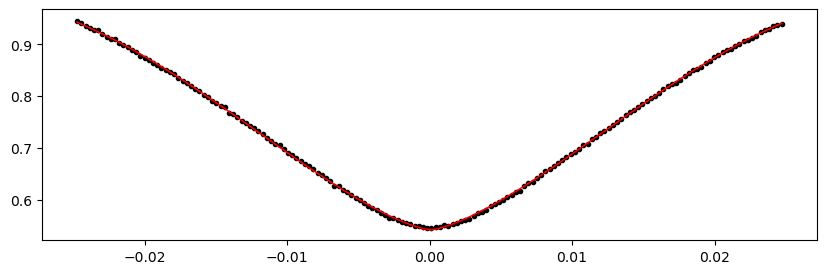

1547.540876 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.01it/s]


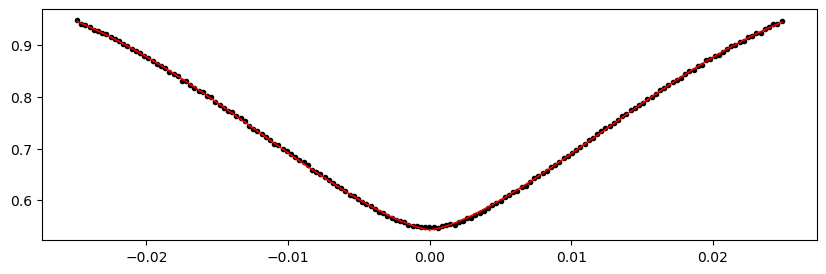

1552.23012 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.47it/s]


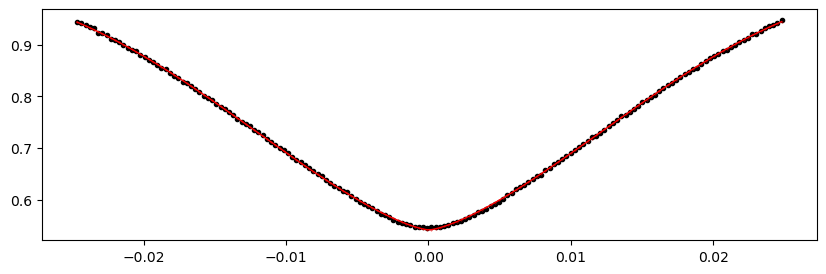

1561.608608 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.93it/s]


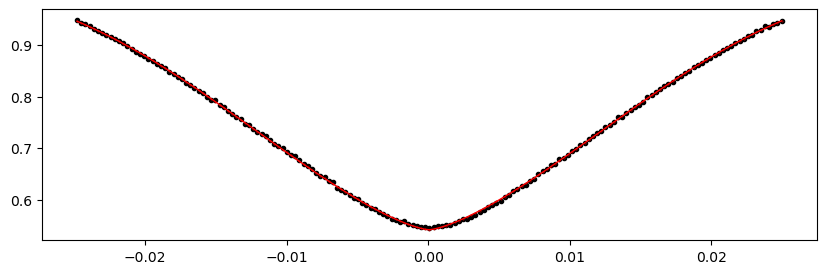

1566.297852 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.40it/s]


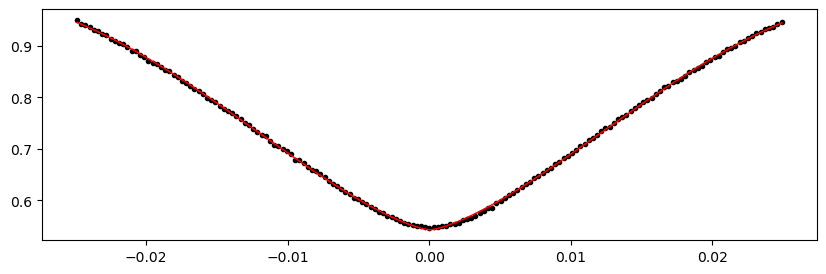

1575.67634 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 321.84it/s]


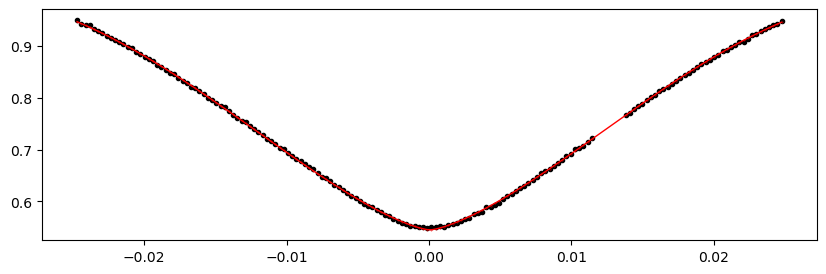

1580.365584 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.73it/s]


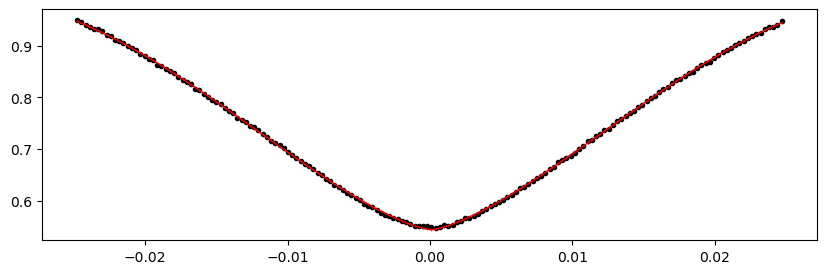

1589.744072 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.59it/s]


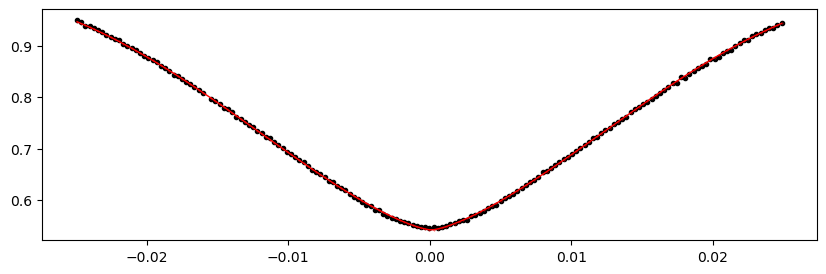

1594.4333159999999 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.15it/s]


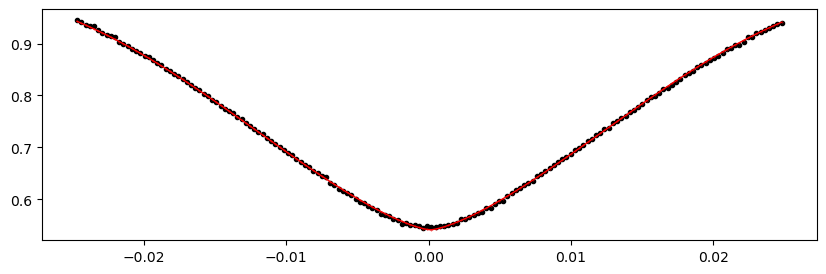

1631.947268 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.95it/s]


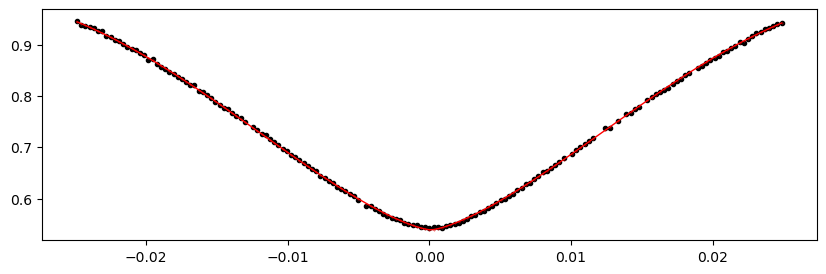

1636.636512 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.54it/s]


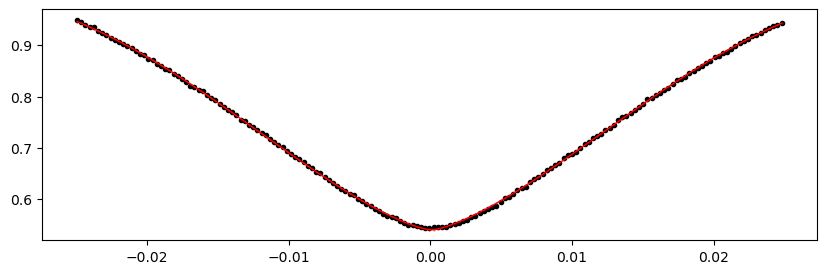

1646.0149999999999 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.09it/s]


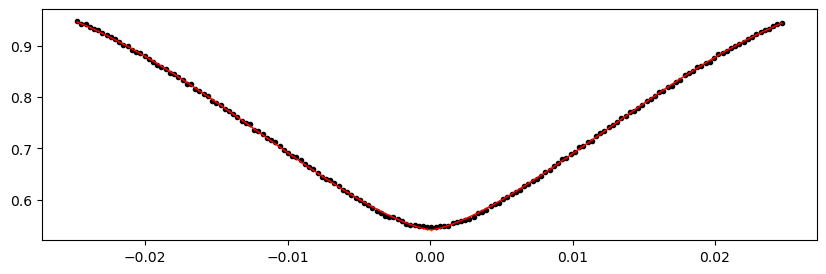

1650.704244 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.22it/s]


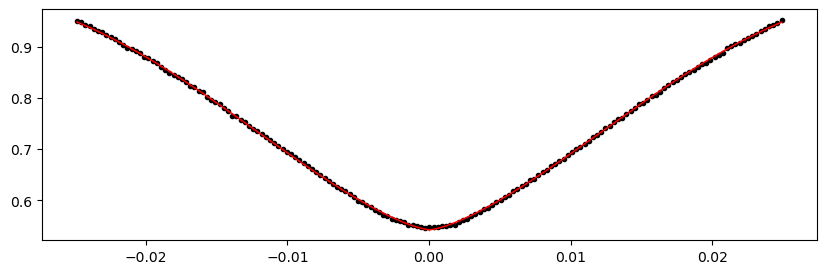

1655.393488 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.11it/s]


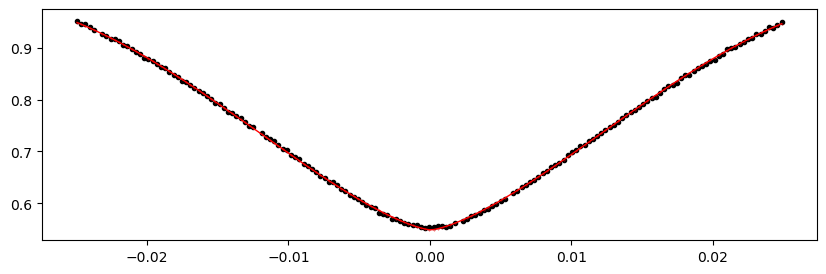

1660.0827319999999 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.24it/s]


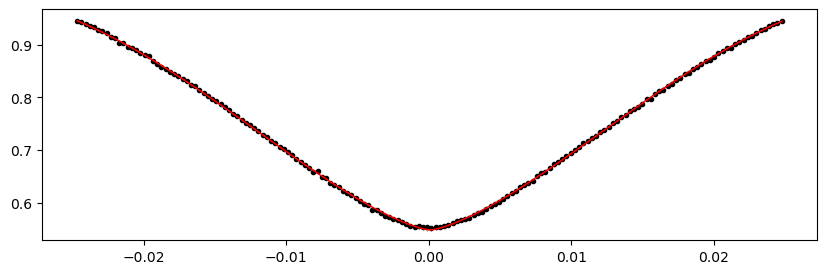

1664.771976 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.92it/s]


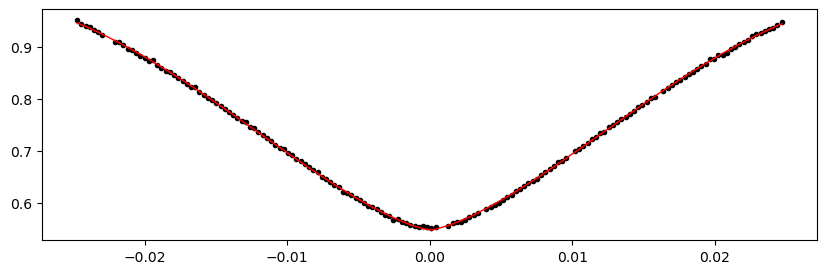

1669.46122 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.58it/s]


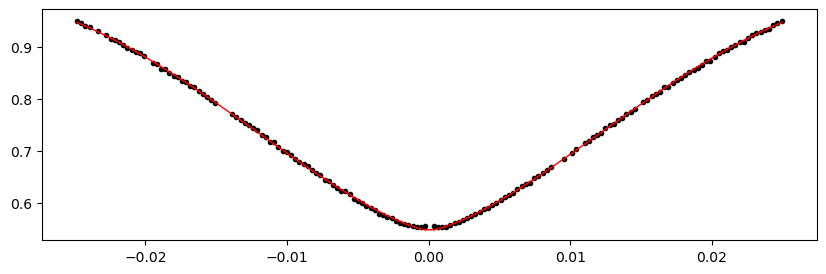

1674.1504639999998 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.86it/s]


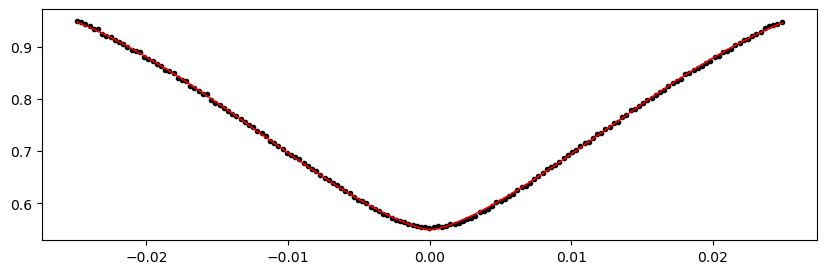

1678.839708 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.67it/s]


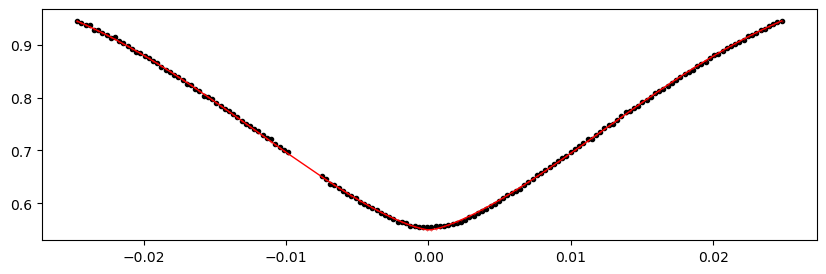

2039.911496 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.15it/s]


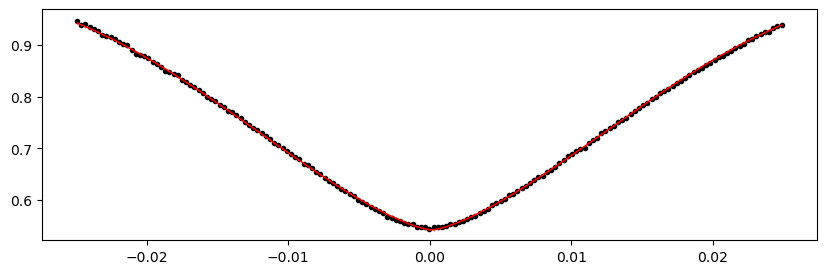

2044.6007399999999 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.74it/s]


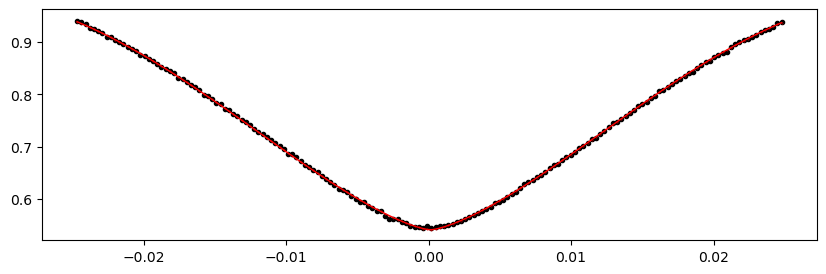

2049.289984 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.85it/s]


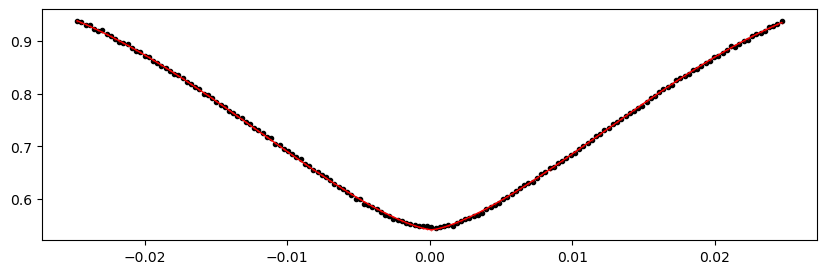

2053.979228 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.12it/s]


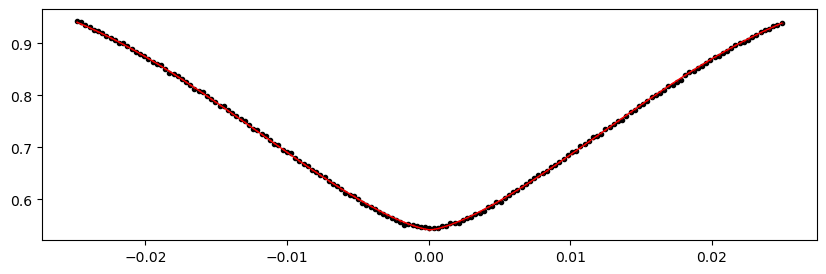

2058.668472 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.44it/s]


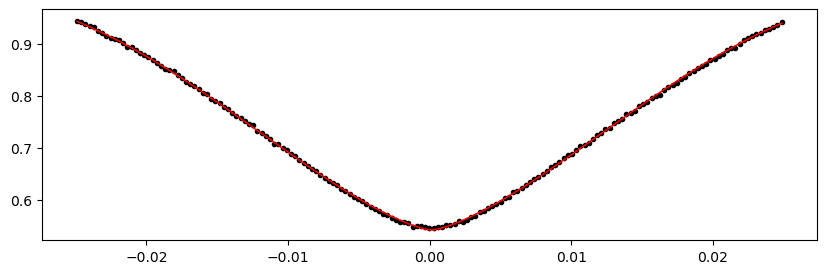

2091.49318 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.45it/s]


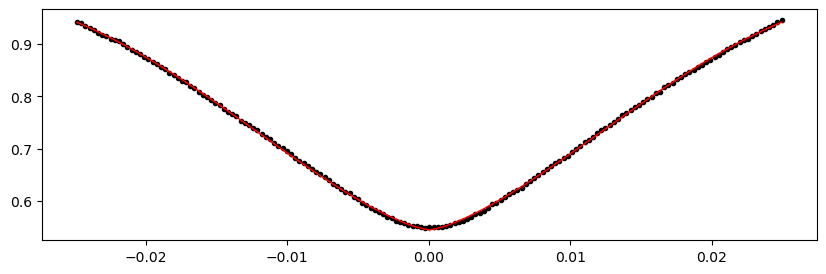

2096.182424 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.57it/s]


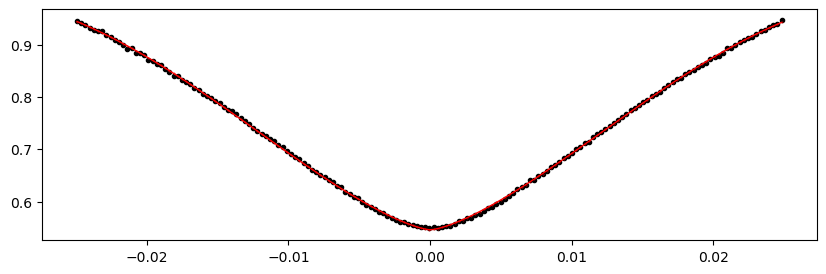

2105.560912 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.27it/s]


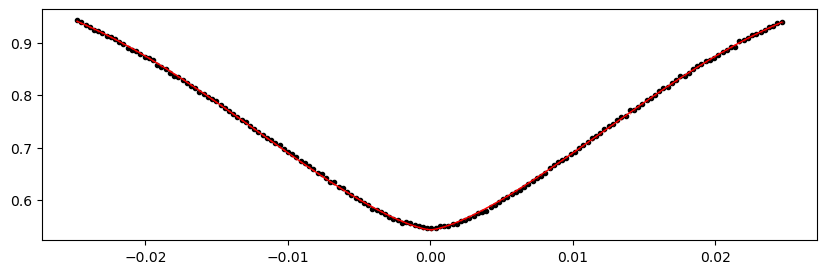

2110.250156 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.86it/s]


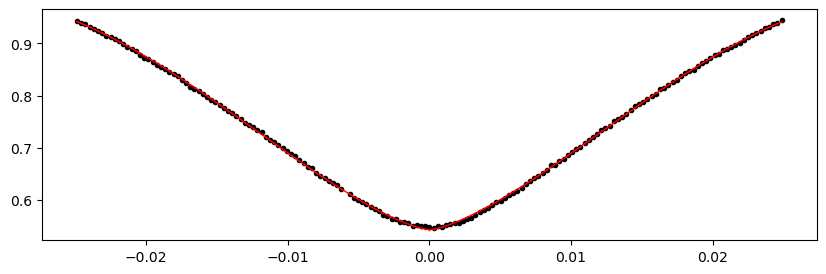

2119.628644 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.76it/s]


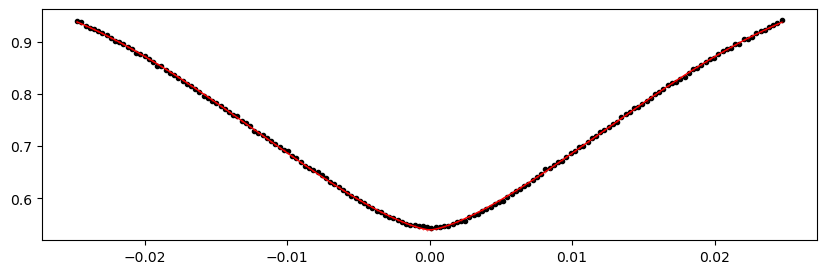

2124.317888 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 329.29it/s]


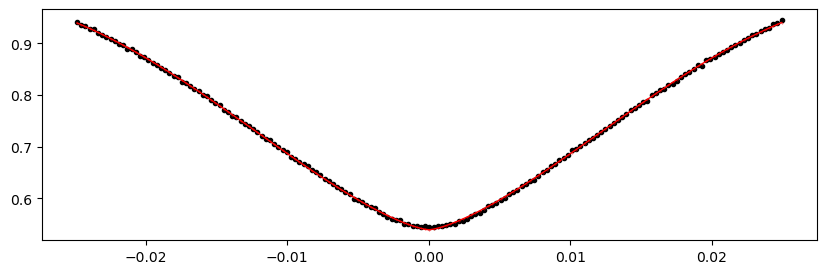

2133.696376 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.71it/s]


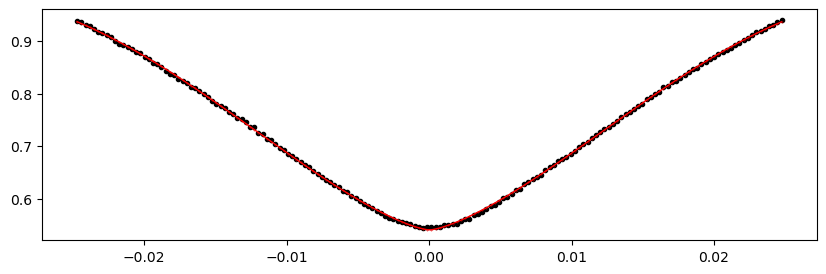

2138.38562 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.54it/s]


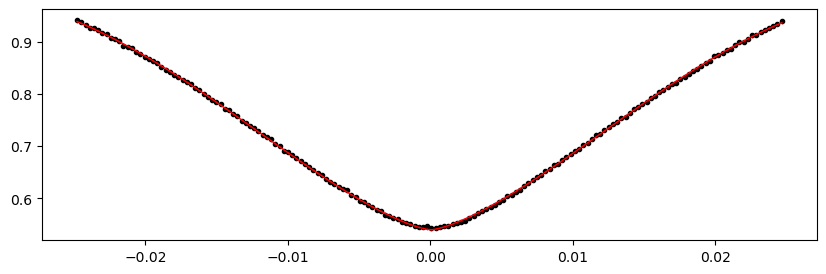

2147.764108 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.03it/s]


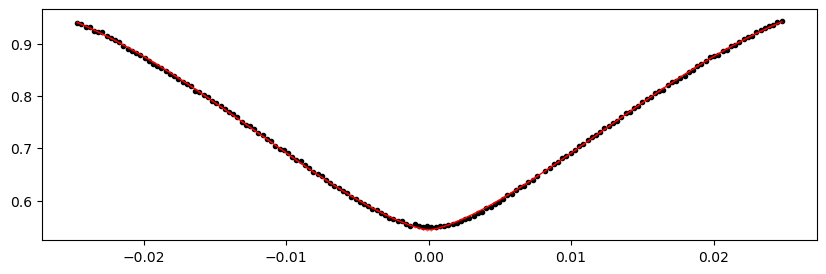

2152.453352 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.65it/s]


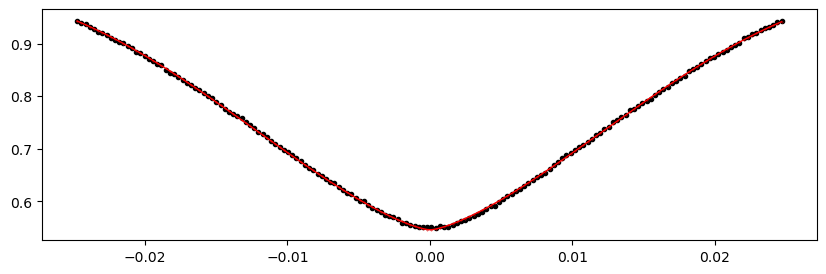

2161.83184 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.97it/s]


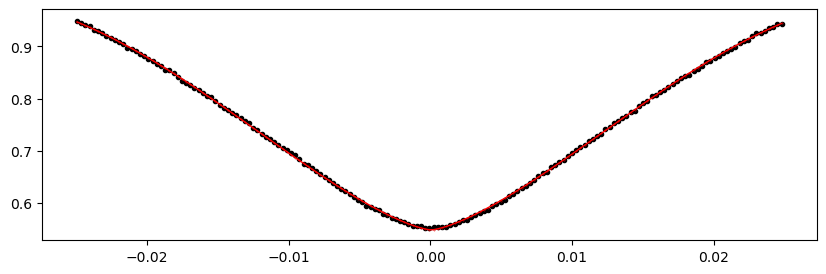

2166.521084 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.83it/s]


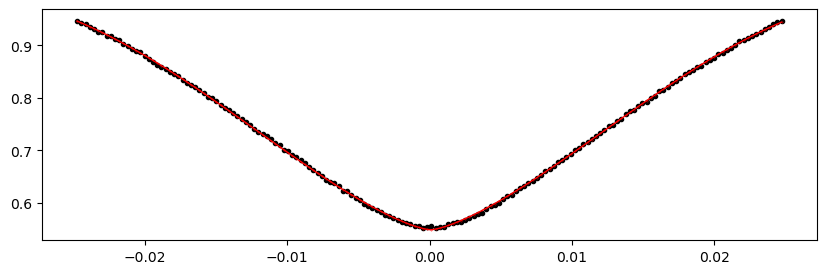

2175.8995720000003 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.34it/s]


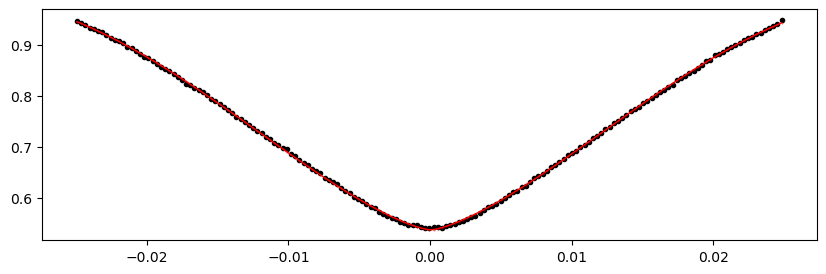

2180.588816 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 329.77it/s]


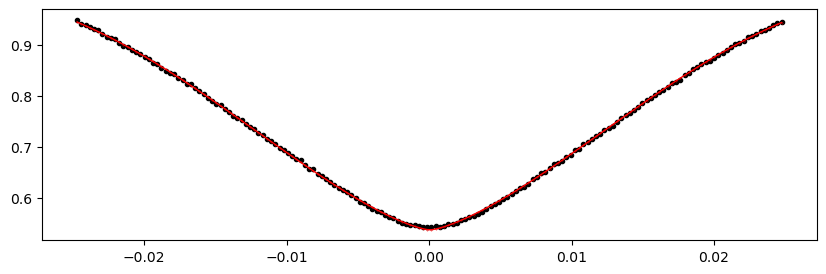

2185.27806 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 307.68it/s]


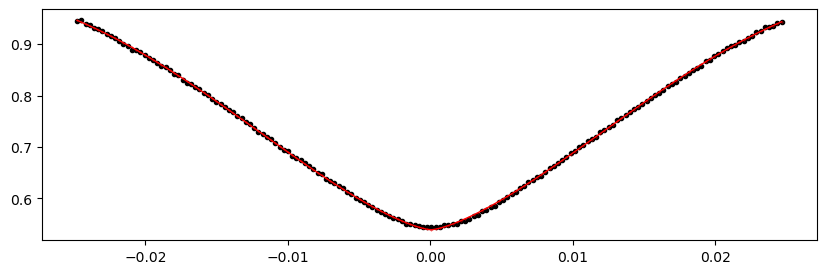

2189.967304 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 311.08it/s]


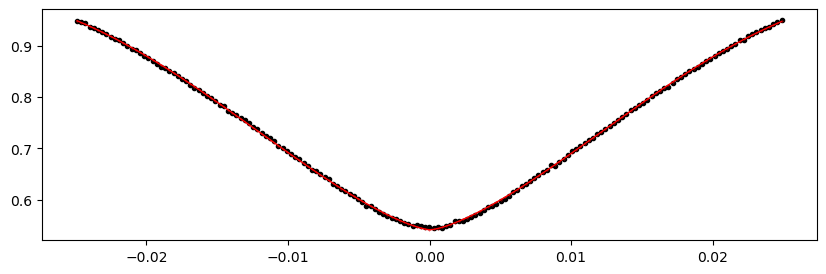

2194.656548 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.93it/s]


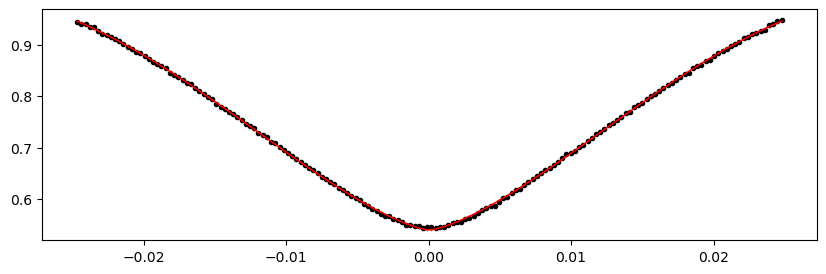

2199.345792 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.22it/s]


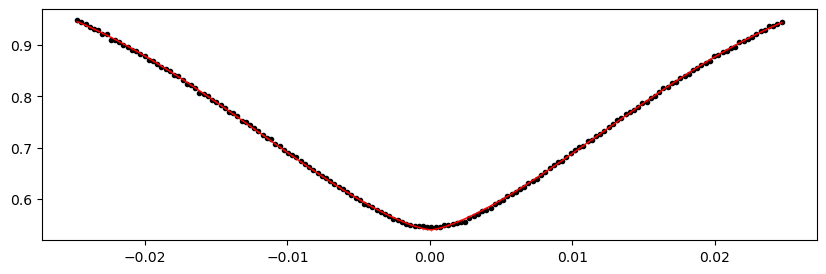

2204.035036 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.92it/s]


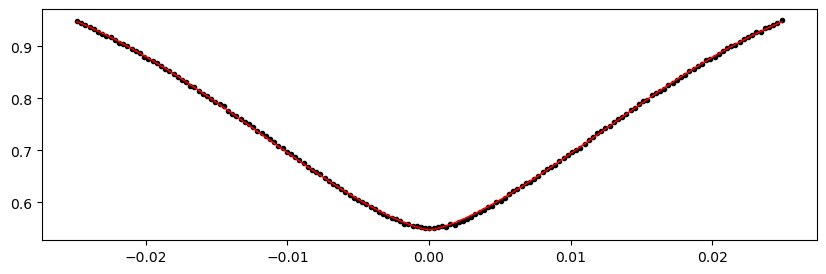

2208.72428 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.11it/s]


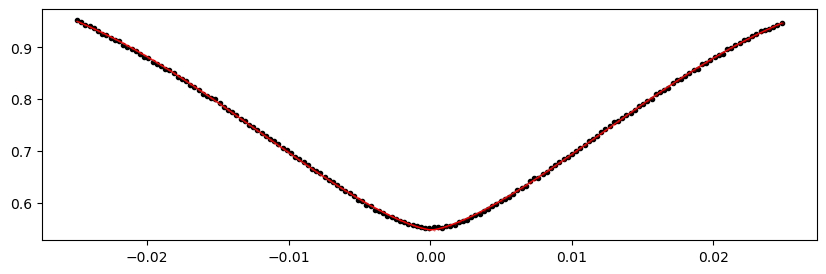

2213.413524 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.39it/s]


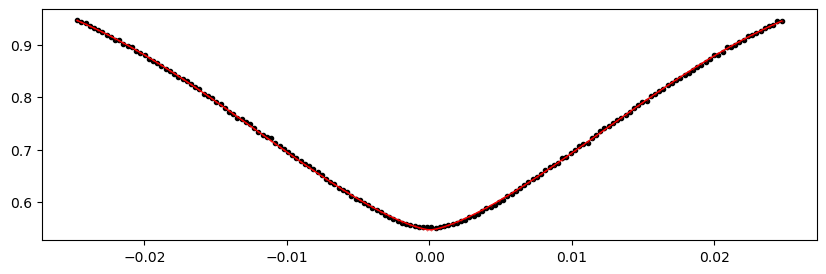

2218.1027679999997 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.89it/s]


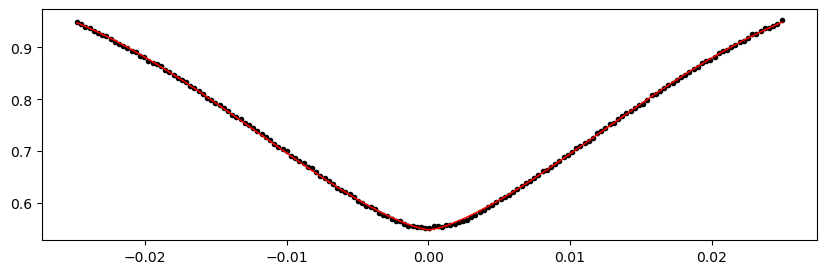

2222.792012 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.38it/s]


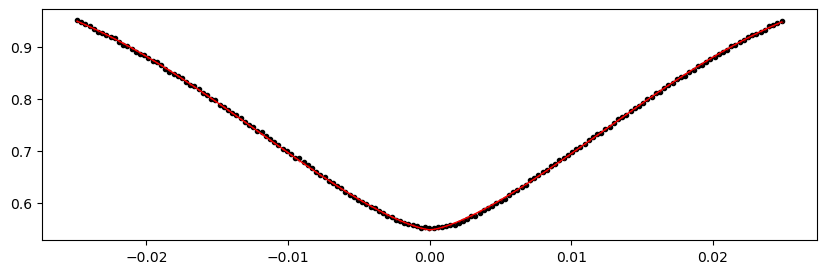

2227.481256 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 354.51it/s]


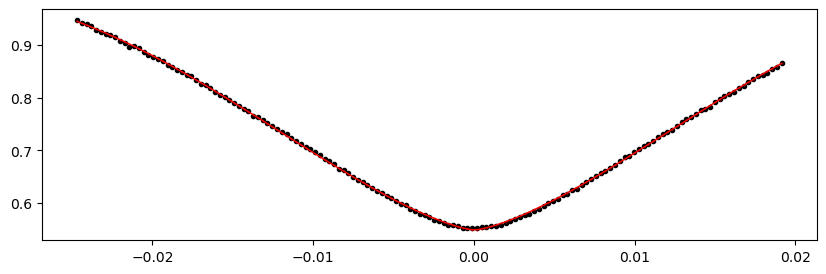

2232.1705 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 327.09it/s]


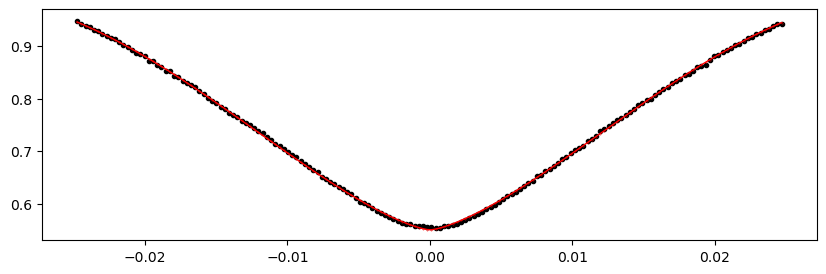

2236.859744 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.26it/s]


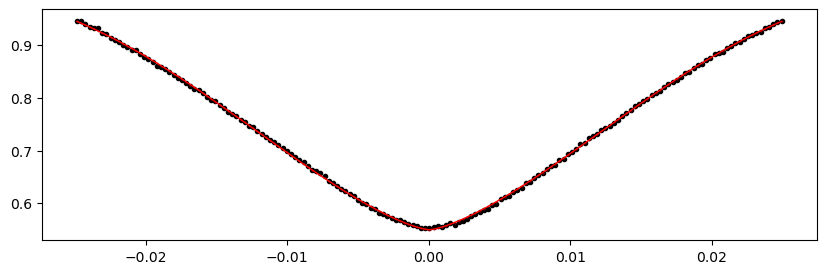

2246.238232 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.30it/s]


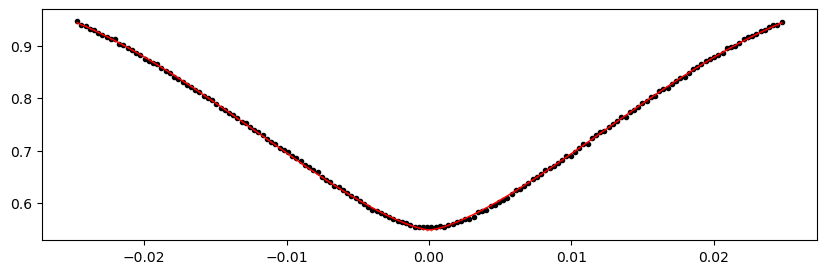

2250.927476 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.84it/s]


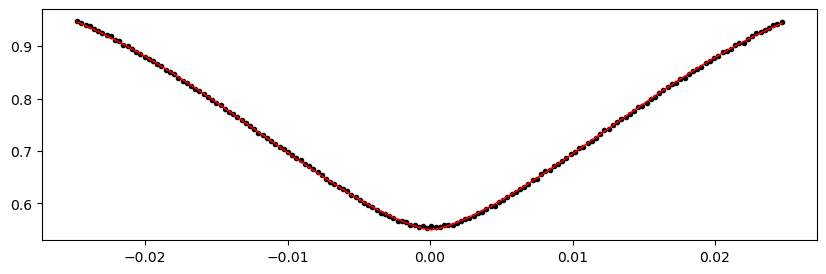

2260.305964 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.27it/s]


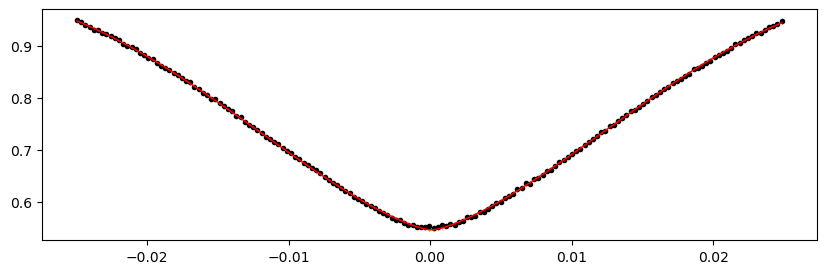

2264.9952080000003 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.65it/s]


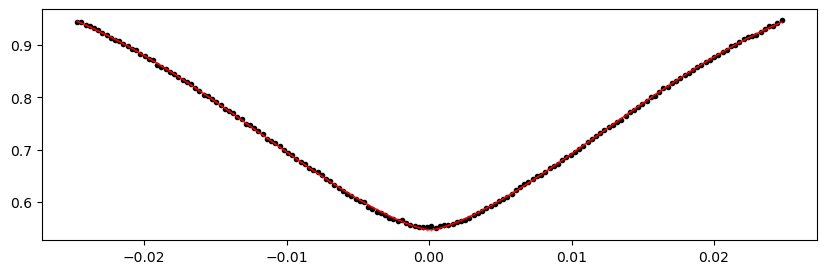

2274.373696 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.66it/s]


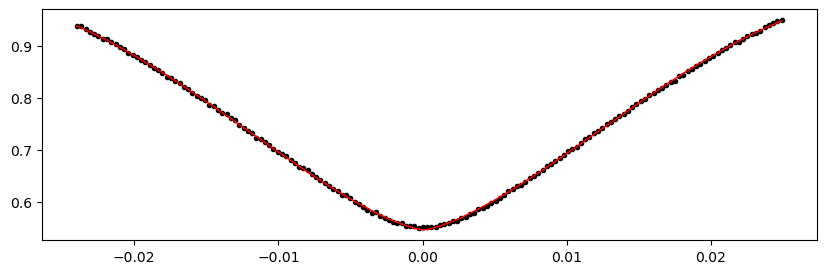

2279.06294 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.45it/s]


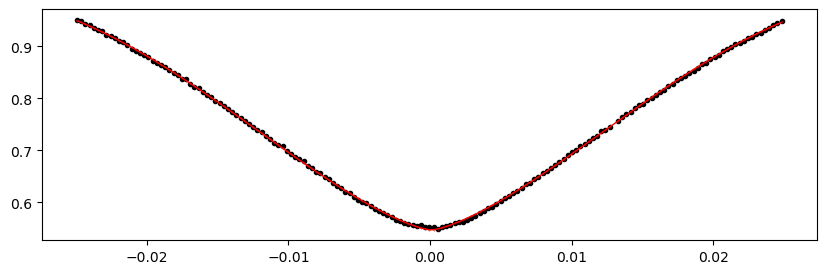

2283.752184 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.05it/s]


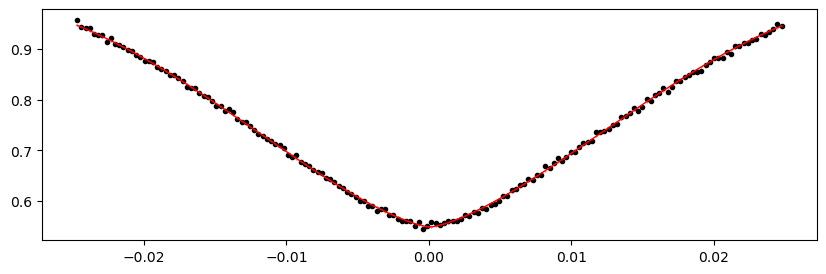

2288.441428 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 333.93it/s]


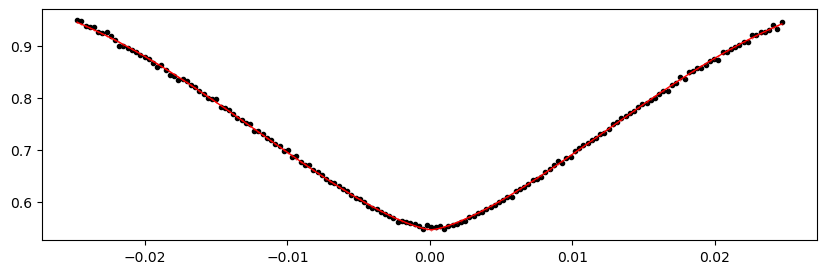

2297.819916 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 326.46it/s]


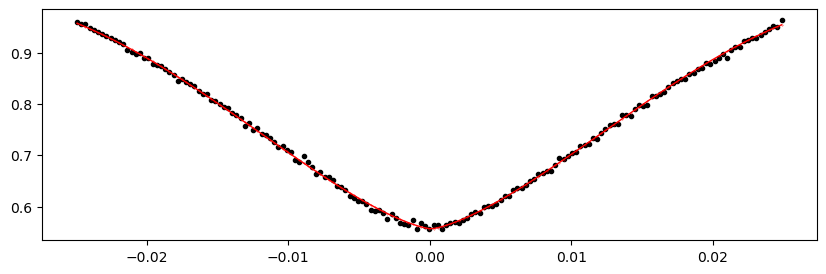

2302.50916 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.28it/s]


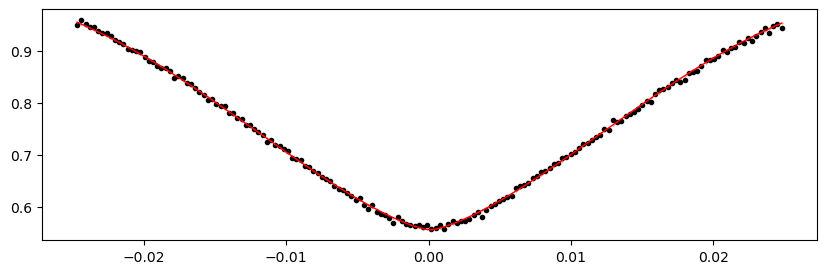

2311.887648 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.97it/s]


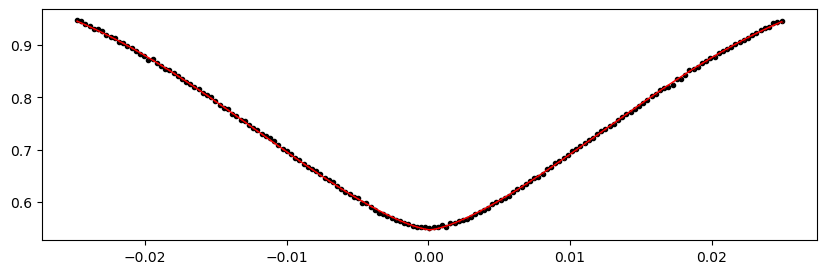

2316.576892 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 333.74it/s]


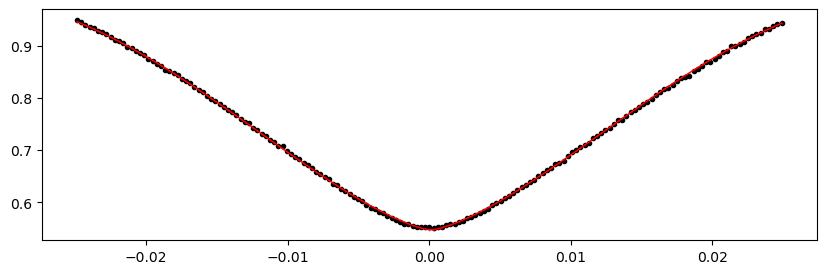

2325.95538 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.11it/s]


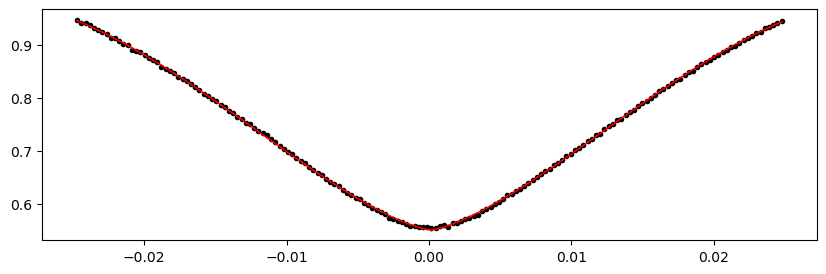

2330.644624 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 352.27it/s]


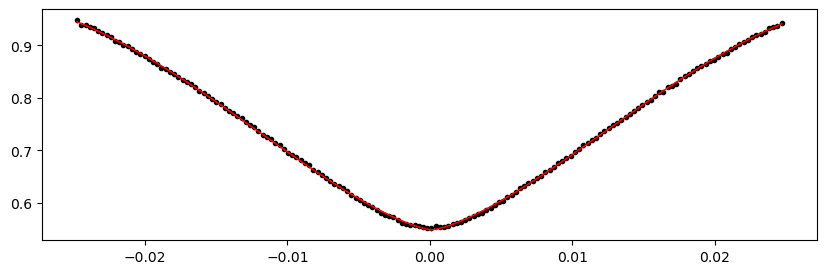

2335.333868 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.96it/s]


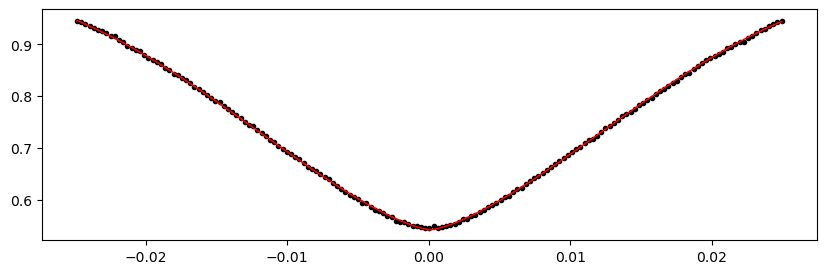

2340.023112 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:35<00:00, 283.94it/s]


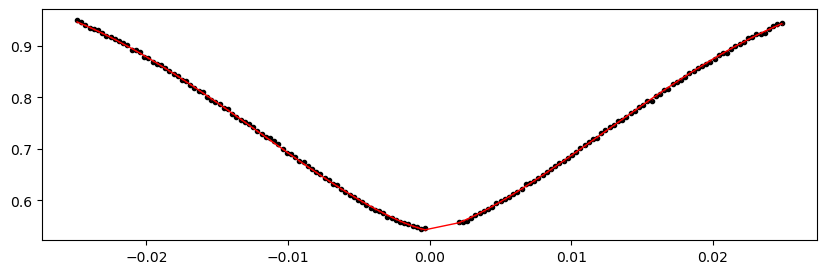

2344.712356 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.34it/s]


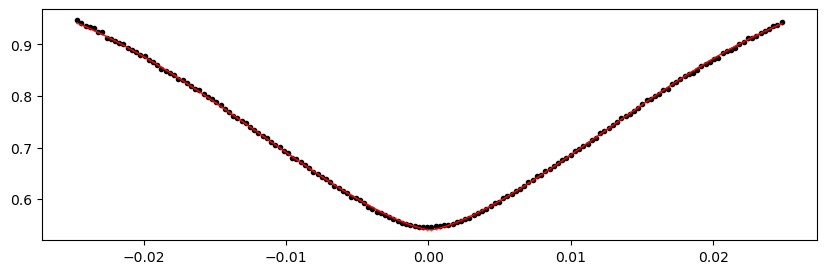

2349.4016 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.30it/s]


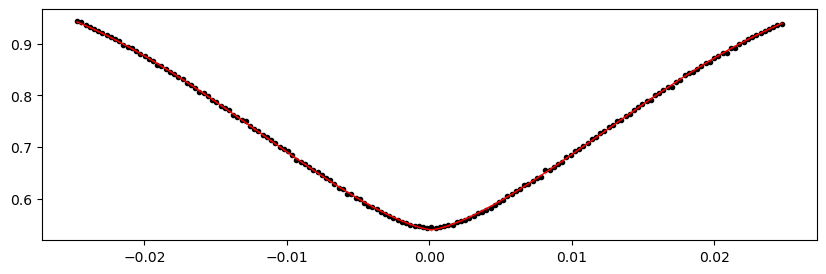

2354.0908440000003 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.85it/s]


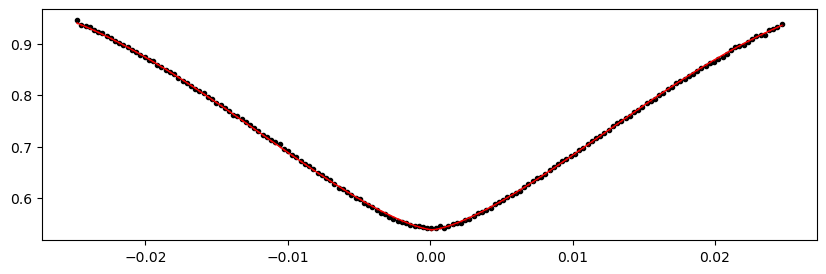

2358.780088 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.86it/s]


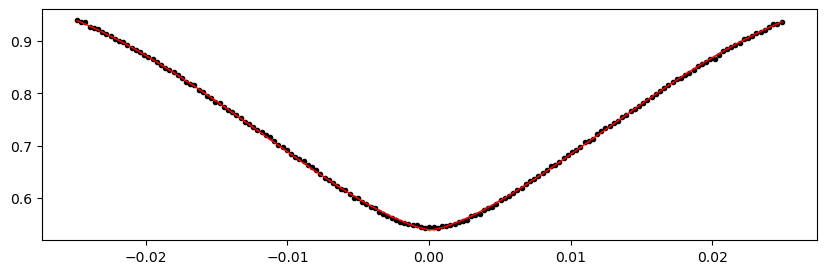

2363.469332 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.86it/s]


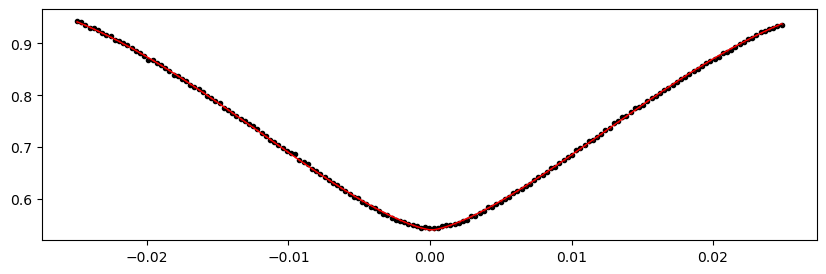

2368.158576 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.65it/s]


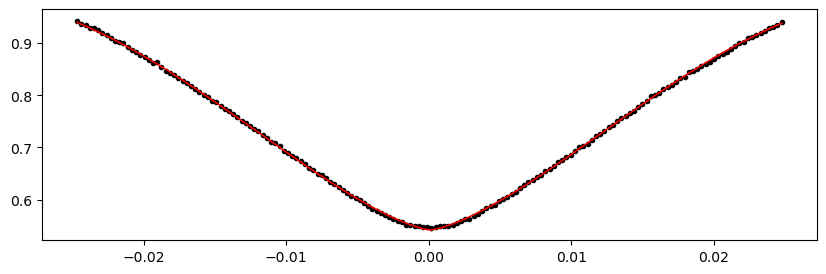

2372.84782 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.86it/s]


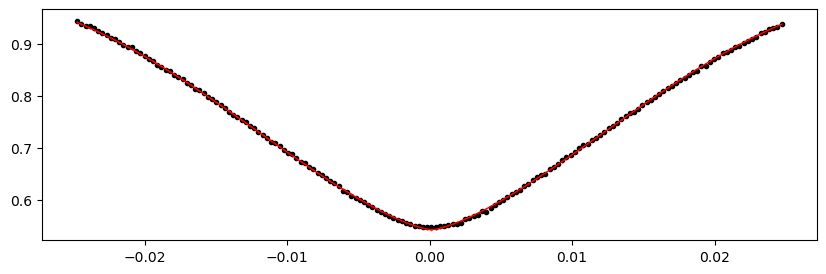

2377.537064 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.26it/s]


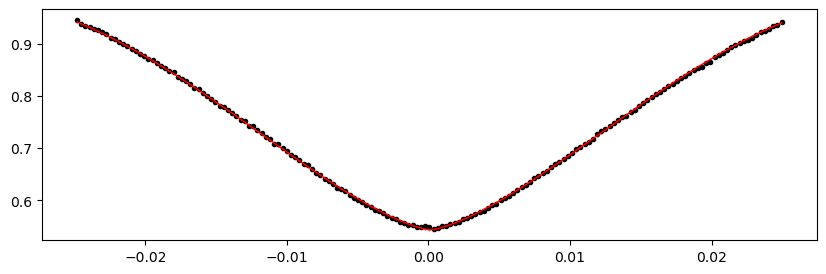

2382.2263080000002 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.29it/s]


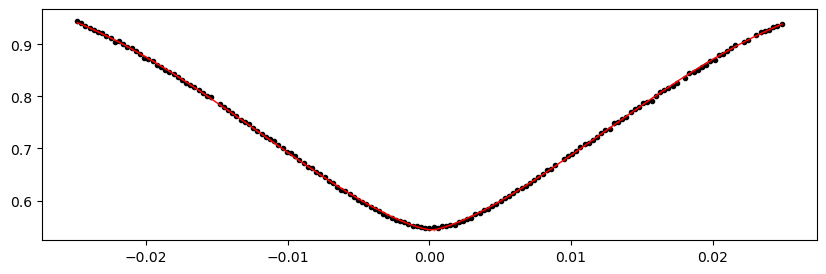

2386.915552 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.45it/s]


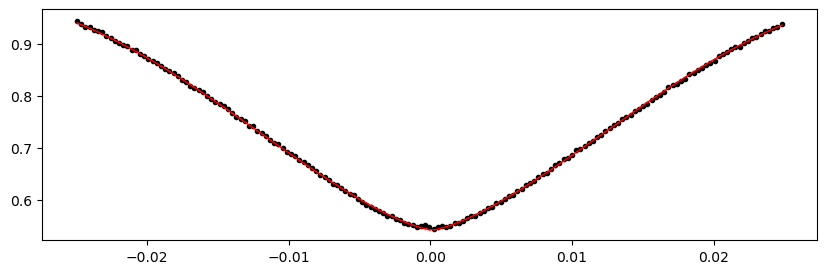

2968.381808 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.25it/s]


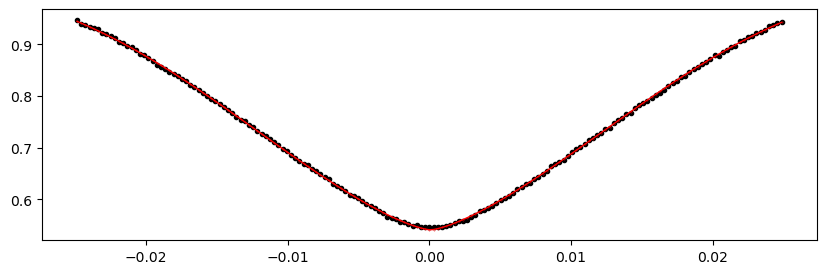

2973.0710520000002 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.13it/s]


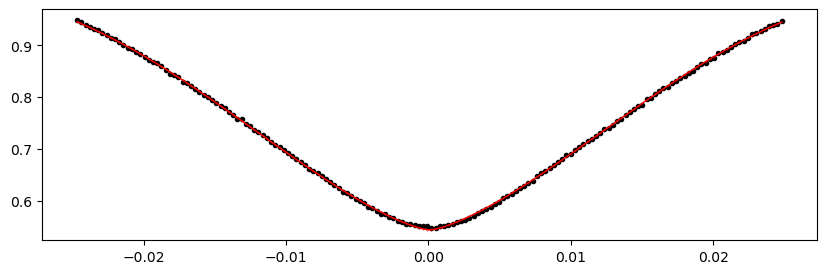

2977.7602960000004 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.27it/s]


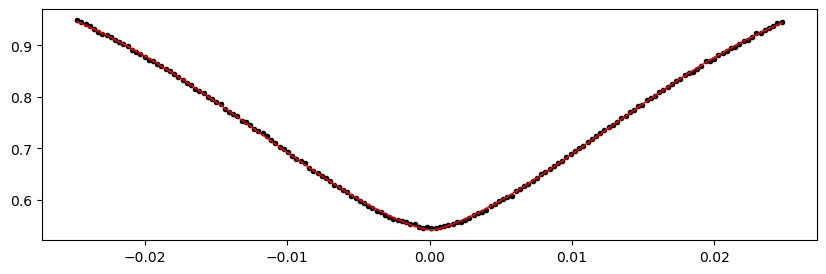

2982.44954 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.72it/s]


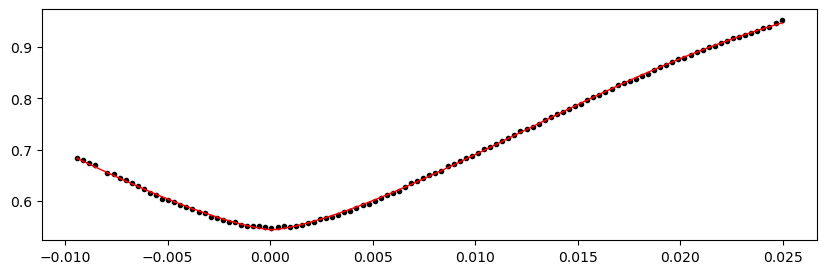

2987.1387839999998 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.34it/s]


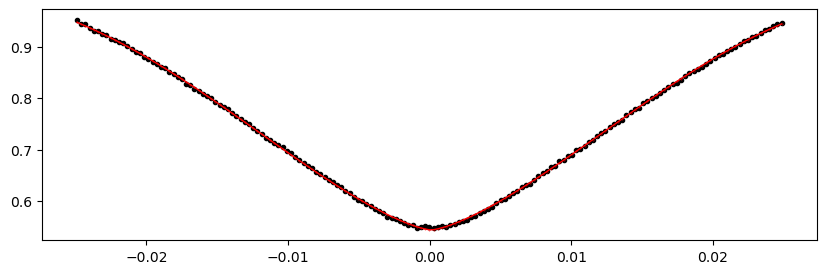

2991.828028 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.70it/s]


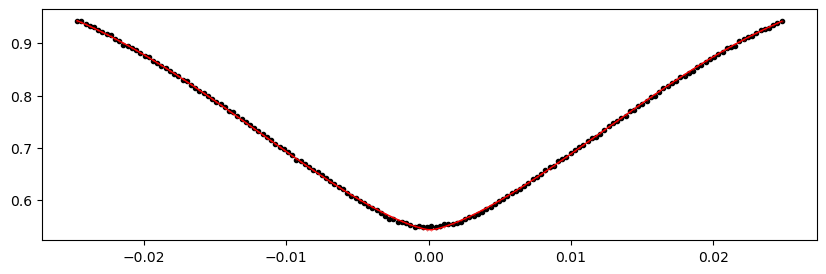

2996.517272 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 352.69it/s]


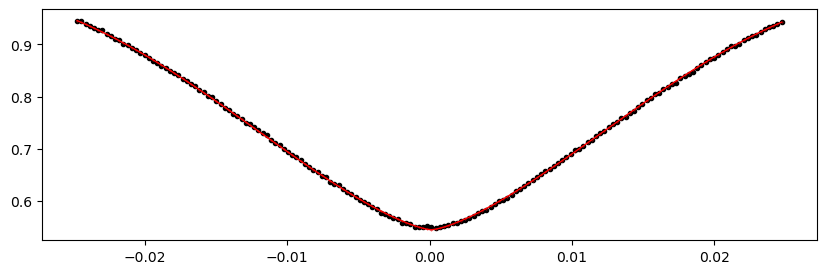

3005.8957600000003 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.34it/s]


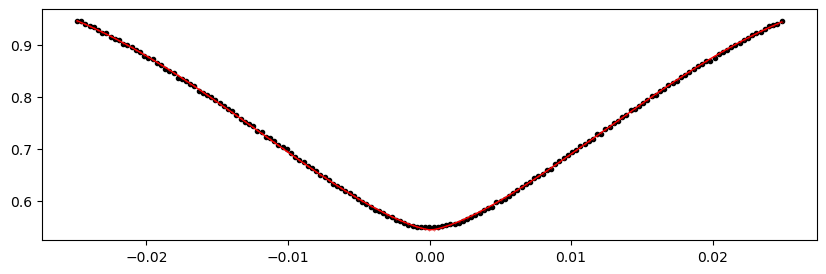

3010.585004 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.87it/s]


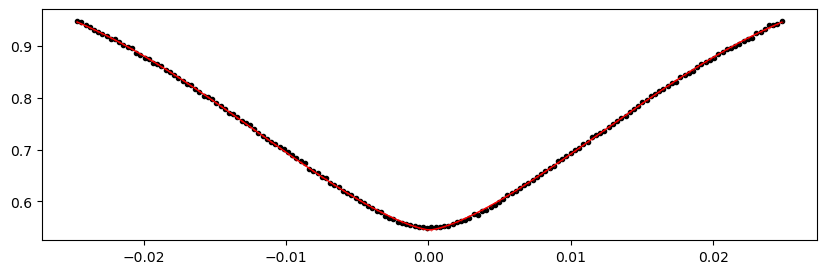

3019.963492 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.54it/s]


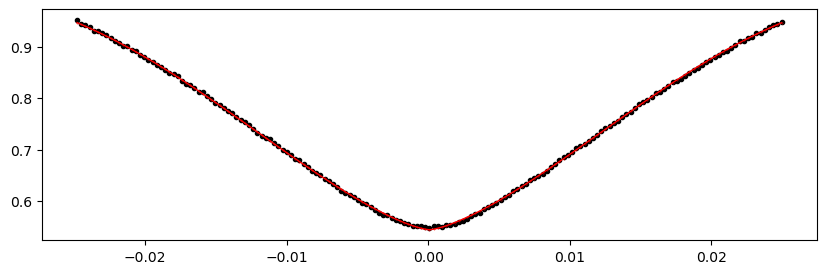

3024.652736 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.98it/s]


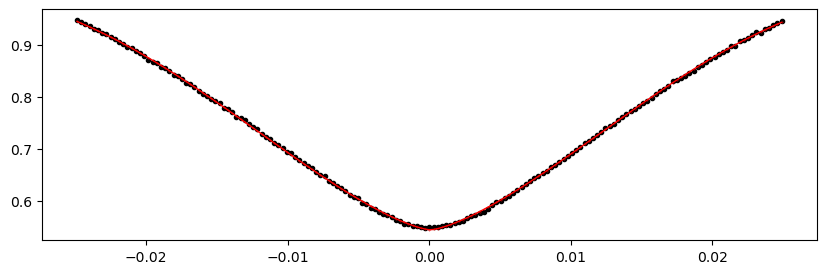

3029.34198 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.40it/s]


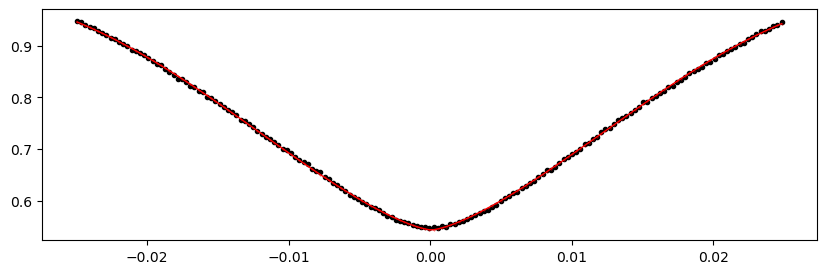

3034.0312240000003 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.50it/s]


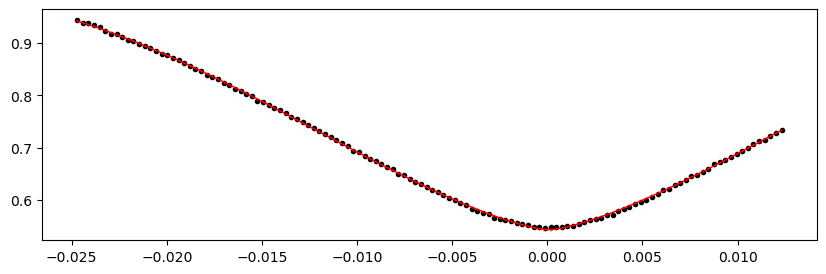

3038.720468 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.36it/s]


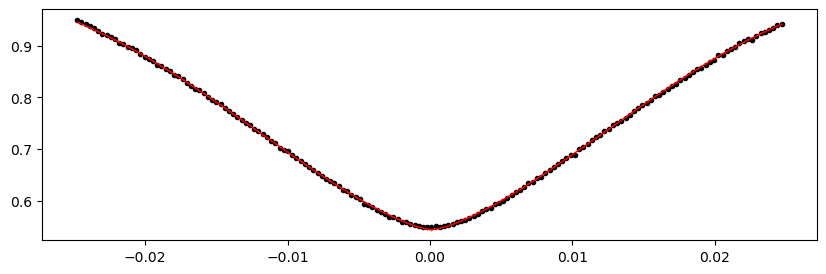

3043.409712 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 321.37it/s]


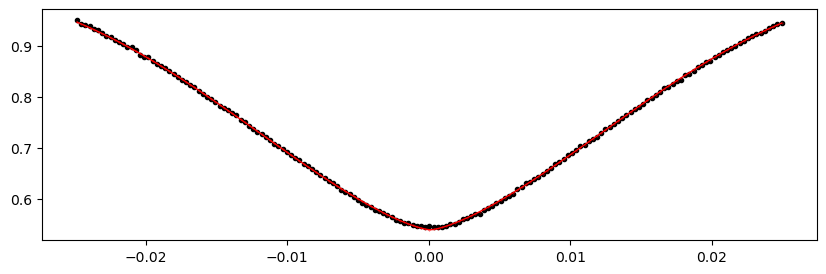

3048.098956 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 398.12it/s]


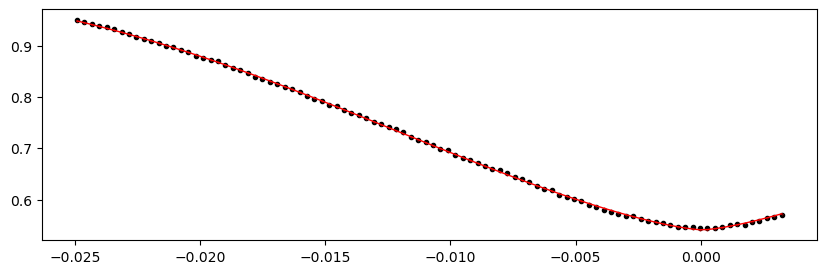

3052.7882 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.38it/s]


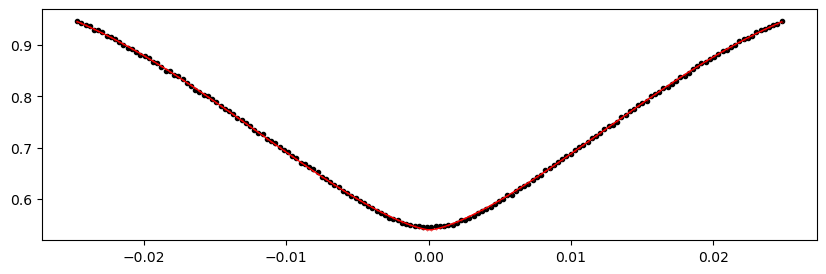

3057.477444 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.81it/s]


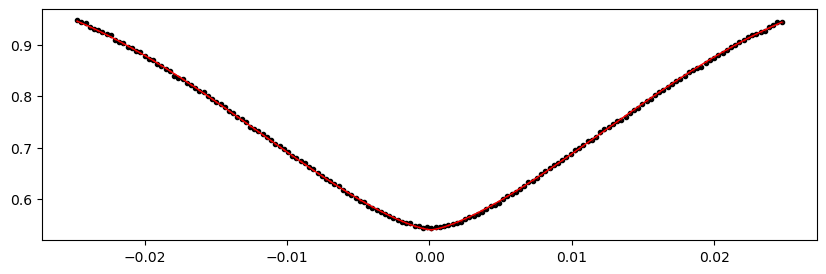

3062.1666880000002 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.76it/s]


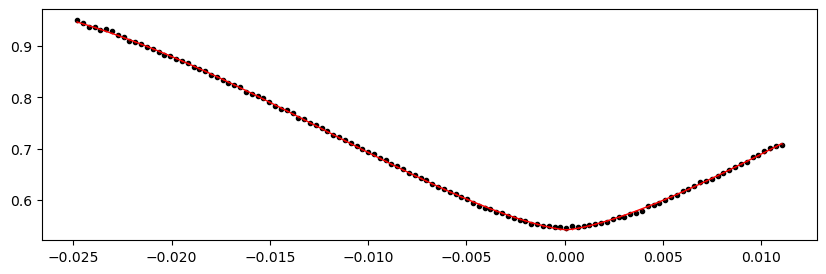

3066.8559320000004 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.77it/s]


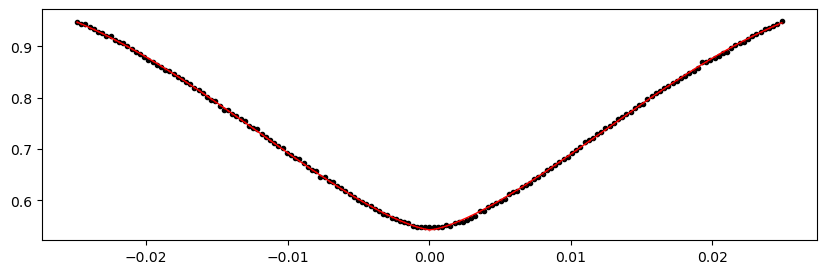

3071.545176 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 344.84it/s]


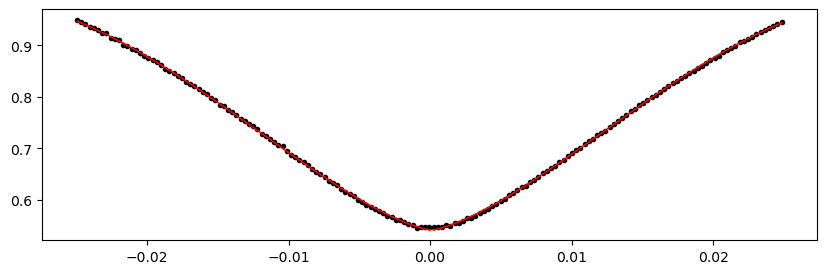

3076.23442 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.80it/s]


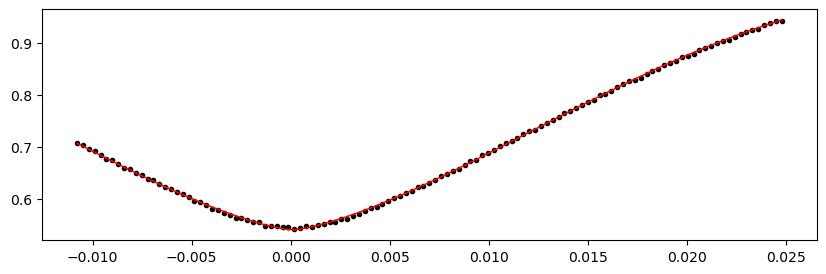

3080.923664 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.26it/s]


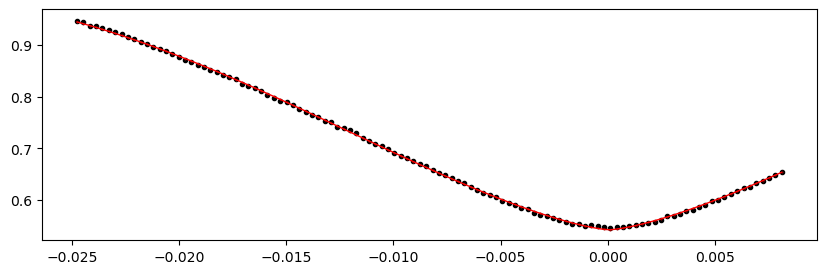

3085.612908 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.14it/s]


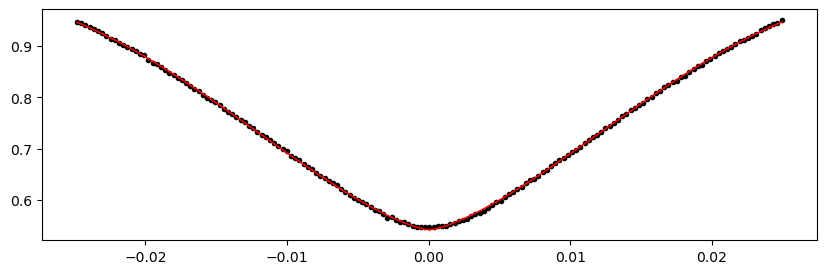

3090.302152 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 418.24it/s]


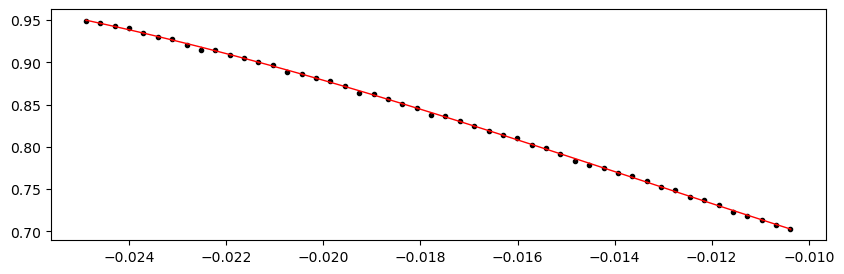

3099.68064 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.33it/s]


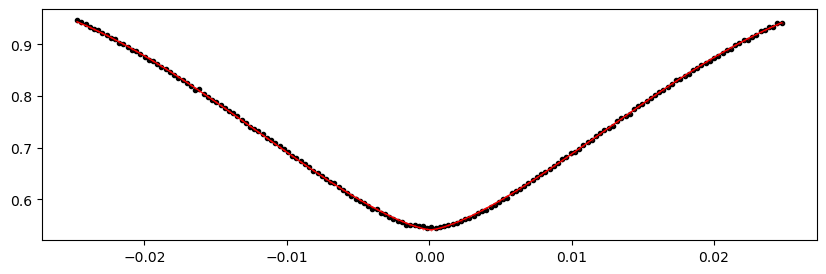

3104.369884 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.27it/s]


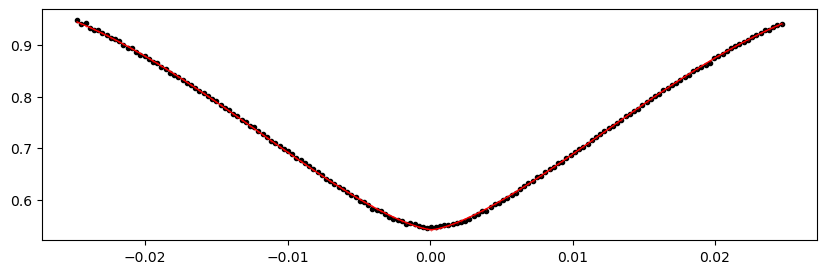

3113.748372 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.85it/s]


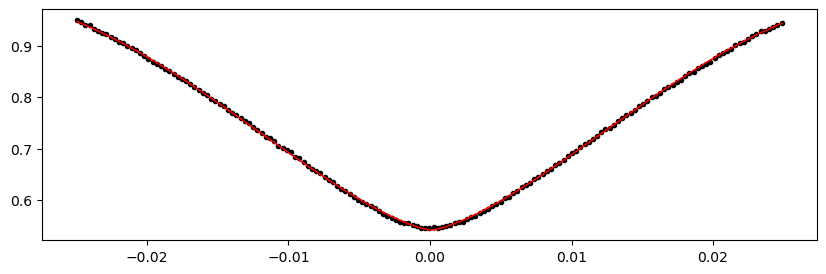

3118.437616 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 326.97it/s]


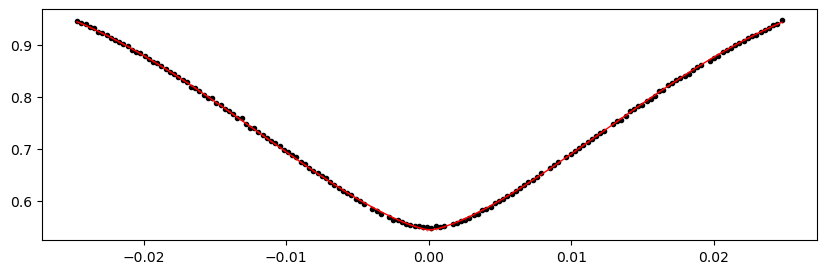

3127.816104 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.02it/s]


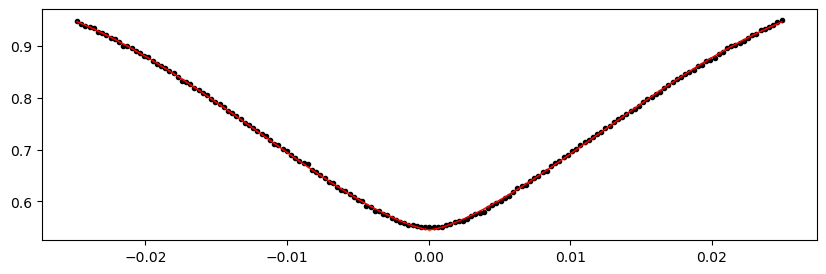

3132.505348 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.66it/s]


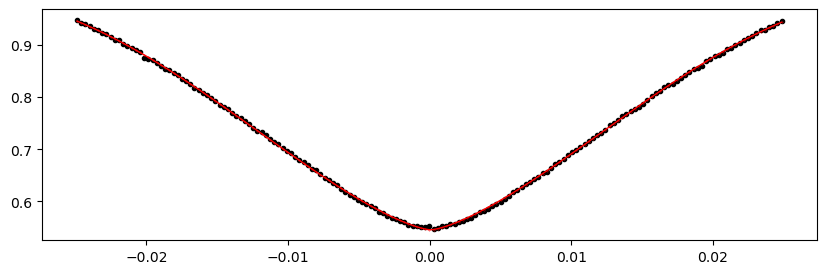

3141.883836 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.56it/s]


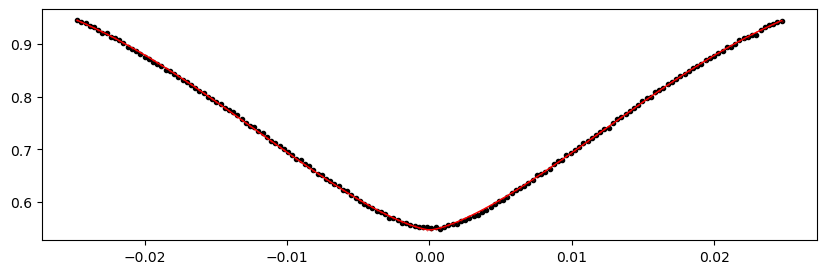

3146.57308 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 360.68it/s]


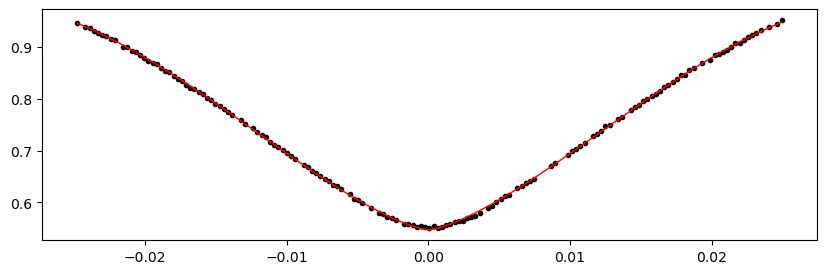

3155.9515680000004 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.61it/s]


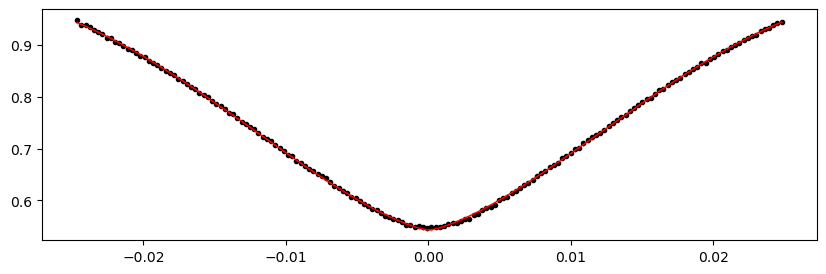

3160.640812 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.55it/s]


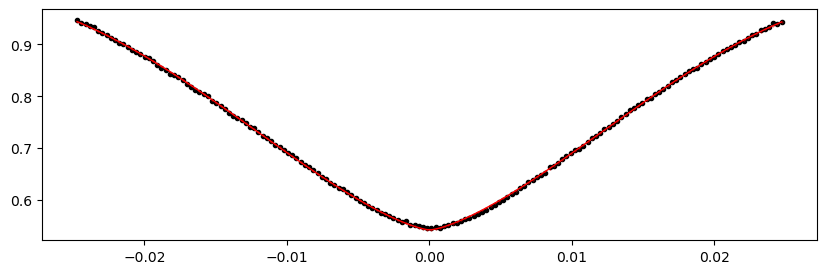

3165.330056 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.02it/s]


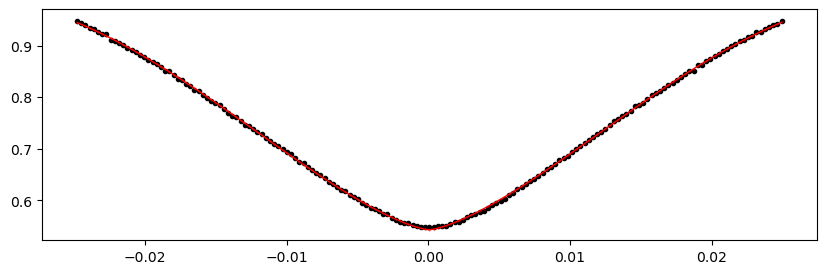

3170.0193 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.80it/s]


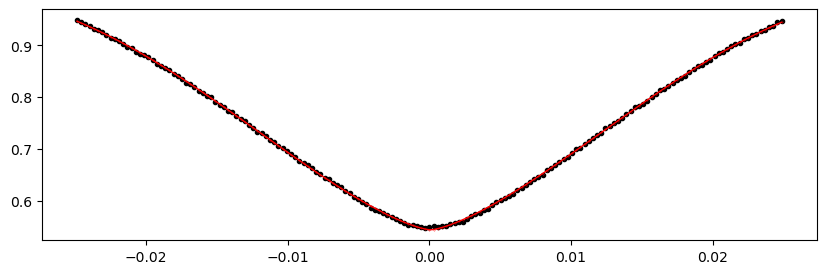

3174.708544 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 354.28it/s]


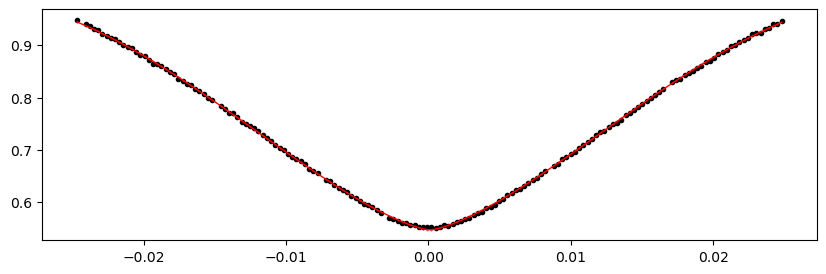

3179.397788 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.24it/s]


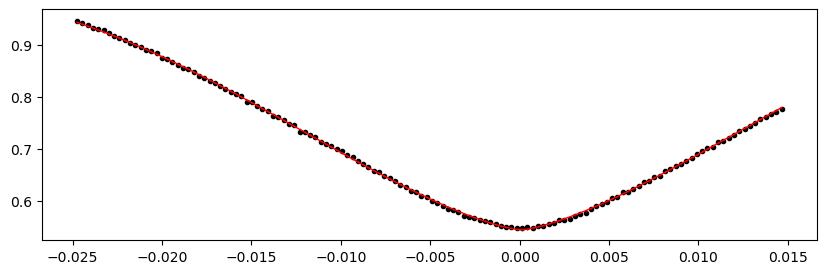

3184.0870320000004 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 363.99it/s]


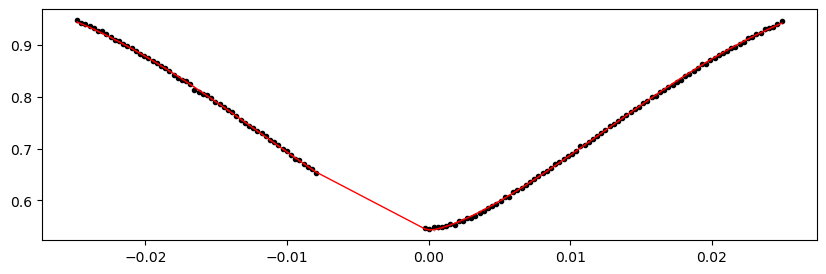

3188.776276 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.06it/s]


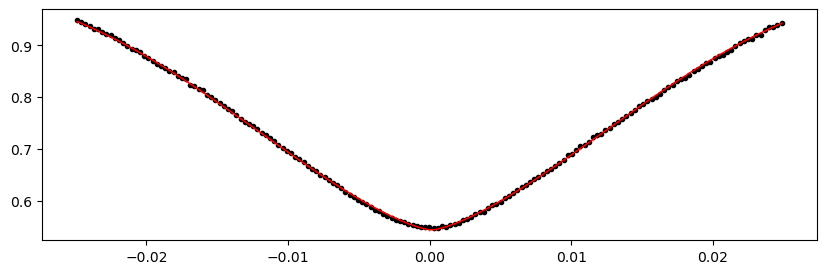

3198.154764 1.0210189608529545 -0.47678101779065185 -0.27492145435421206


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.71it/s]


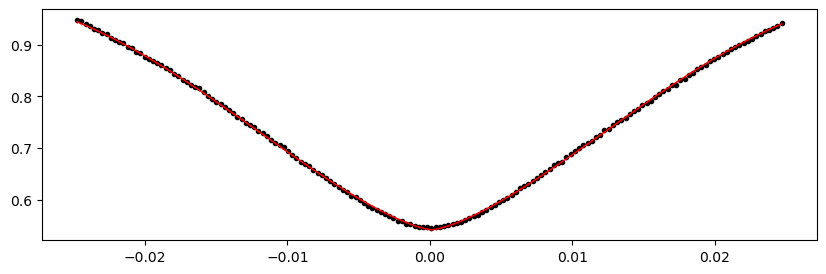

In [50]:
# ---

%matplotlib inline

print("Fitting individual secondary eclipses...")
etv_functions.fit_each_eclipse(data_secondary, n_transits, t0_secondary, period, mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s, outfile_path_s)
!$NOTIFY_CMD "Individual secondary eclipses fit done"

In [6]:
# # Uncomment to load computed ETV data, without re-running all above cells
# ticid =  30034081

# # define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
# outfile_path = f"{outfile_base}/tic{ticid}_etv_primary.csv"
# outfile_path_s = f"{outfile_base}/tic{ticid}_etv_secondary.csv"

# period = 4.689244 # MCMC

# t0_primary = 1411.5528 + period / 2
# t0_secondary = 1411.5528


Note: 4 data points in df_primary filtered out due to huge O-C error.
Note: 1 data points in in_df_secondary filtered out due to huge O-C error.


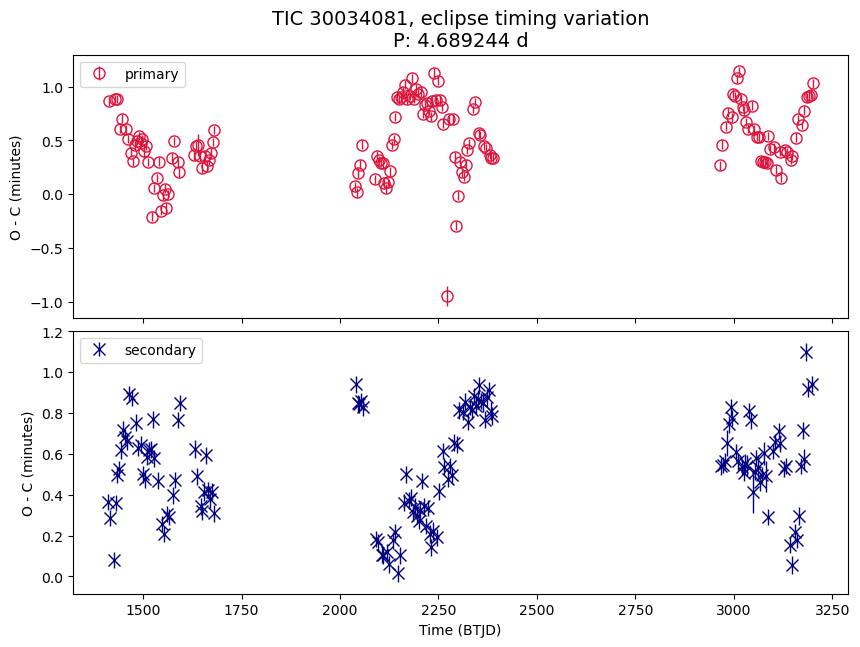

In [7]:
%matplotlib inline
# %matplotlib widget


title_suffix = "eclipse timing variation"

#plot the extracted transit times to check for ETVs

num_rows = 2 if t0_secondary is not None else 1
figsize_y = 3.3 if num_rows == 1 else num_rows * 3.5
# num_rows = 1  # force to plot primary only
# figsize_y = 3.3

fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True)
if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
    axs = [axs]

in_df_primary = pd.read_csv(outfile_path)
in_df_primary['midpoint'] = in_df_primary['epoch'] + (in_df_primary['t0']*period)
in_df_primary['shift_mins'] = in_df_primary['t0']*period*24*60
in_df_primary['std_mins'] = in_df_primary['stdv_t0']*period*24*60
in_df_primary_all = in_df_primary  # in case filtering is helpful

in_df_primary = in_df_primary[in_df_primary.std_mins < 1]  # filter out outliers in error
print(f"Note: {len(in_df_primary_all) - len(in_df_primary)} data points in df_primary filtered out due to huge O-C error.")

# axs[0].plot(in_df_primary['epoch'], in_df_primary['shift_mins'],
#              lw = 1, color = 'crimson', )
# axs[0].scatter(in_df_primary['epoch'], in_df_primary['shift_mins'],
#              marker = 'o', s=8**2, color = 'None', edgecolor = 'crimson', label="primary")
axs[0].errorbar(in_df_primary['epoch'], in_df_primary['shift_mins'], yerr = in_df_primary['std_mins'],
             lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'crimson', label="primary")

# if False:
if t0_secondary is not None:
    in_df_secondary = pd.read_csv(outfile_path_s)
    in_df_secondary['midpoint'] = in_df_secondary['epoch'] + (in_df_secondary['t0']*period)
    in_df_secondary['shift_mins'] = in_df_secondary['t0']*period*24*60
    in_df_secondary['std_mins'] = in_df_secondary['stdv_t0']*period*24*60
    in_df_secondary_all = in_df_secondary  # in case filtering is helpful

    in_df_secondary = in_df_secondary[in_df_secondary.std_mins < 1]  # filter out outliers in error
    print(f"Note: {len(in_df_secondary_all) - len(in_df_secondary)} data points in in_df_secondary filtered out due to huge O-C error.")

    # axs[1].plot(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
    #              lw = 1, color = 'navy', )
    # axs[1].scatter(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
    #              marker = 'x',  s=9**2, color = 'navy', zorder = -2, label="secondary" );
    axs[1].errorbar(in_df_secondary['epoch'], in_df_secondary['shift_mins'], yerr = in_df_secondary['std_mins'],
                 lw = 0, marker = 'x', elinewidth = 1, markersize = 9, color = 'navy', zorder = -2, label="secondary" );
else:
    in_df_secondary = None

for ax in axs:
    ax.set_ylabel("O - C (minutes)")
    ax.legend();

axs[-1].set_xlabel(f"Time ({search_result.time.format.upper()})")
axs[0].set_title(f"TIC {ticid}, {title_suffix}\nP: {period} d", fontsize=14)

plt.subplots_adjust(hspace=0.05)
# plt.ylim(-3, 8)
plt.show()

### Compare with O-C plot with ingress/egress included in the model

model based on clipped lightcurve of eclipse duration * 1.2

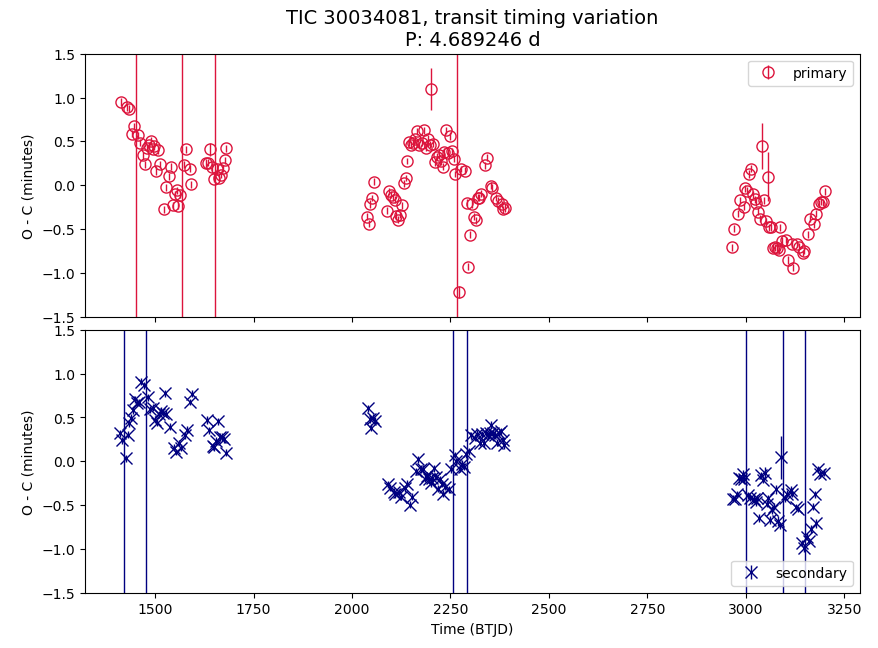


### O-C Plot, Zoom In

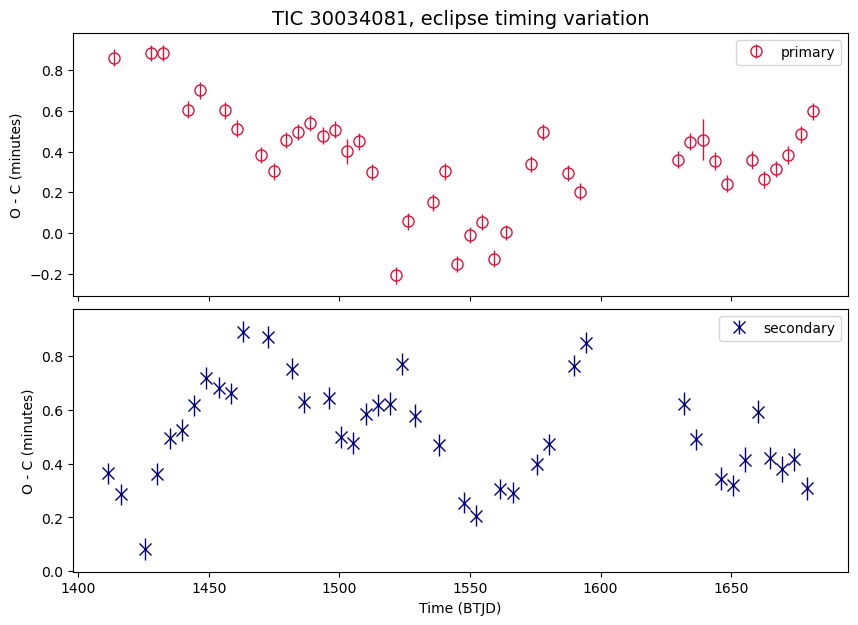

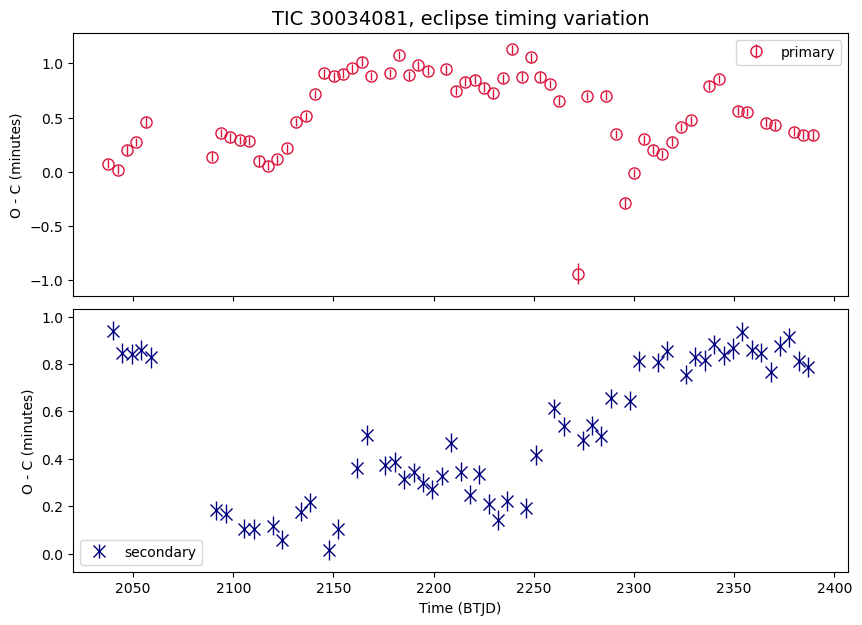

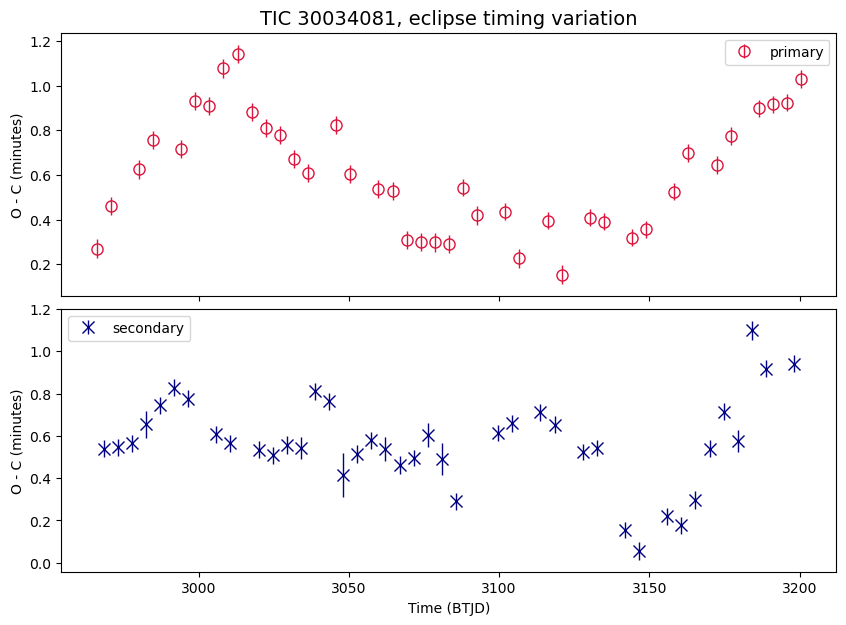

In [52]:
%matplotlib inline
# %matplotlib widget

zoom_ranges = [
    (1300, 1750),
    (2000, 2500),
    (2900, 3250),
]

def tweak_axs_list(axs_list):
    # axs_list[0][1].set_ylim(-20, 30);
    # axs_list[1][0].set_ylim(None, 0.5);
    # axs_list[1][1].set_ylim(-5.5, 2);

    # ax = axs_list[0][0]
    # ax.set_title(f"{ax.get_title()} (2min cadence)")
    # ax = axs_list[1][0]
    # ax.set_title(f"{ax.get_title()} (2min cadence)")

    pass


def plot_oc_in_zoom_ranges(in_df_primary, in_df_secondary, zoom_ranges):
    axs_list = []
    for zoom_start, zoom_end in zoom_ranges:
        num_rows = 2 if t0_secondary is not None else 1
        figsize_y = 3.3 if num_rows == 1 else num_rows * 3.5

        fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True)
        if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
            axs = [axs]

        df_zoom = in_df_primary[(in_df_primary['epoch'] > zoom_start) & (in_df_primary['epoch'] < zoom_end)]

        # axs[0].scatter(df_zoom['epoch'], df_zoom['shift_mins'],
        #                marker = 'o', s=8**2, color = 'None', edgecolor = 'crimson', label="primary")
        axs[0].errorbar(df_zoom['epoch'], df_zoom['shift_mins'], yerr = df_zoom['std_mins'],
                        lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'crimson', label="primary")

        if in_df_secondary is not None:
            df_zoom = in_df_secondary[(in_df_secondary['epoch'] > zoom_start) & (in_df_secondary['epoch'] < zoom_end)]

            # axs[1].scatter(df_zoom['epoch'], df_zoom['shift_mins'],
            #                marker = 'x',  s=9**2, color = 'navy', zorder = -2, label="secondary" );
            axs[1].errorbar(df_zoom['epoch'], df_zoom['shift_mins'], yerr = df_zoom['std_mins'],
                            lw = 0, marker = 'x', elinewidth = 1, markersize = 9, color = 'navy', zorder = -2, label="secondary" );

        for ax in axs:
            ax.set_ylabel("O - C (minutes)")
            ax.legend();

        axs[-1].set_xlabel("Time (BTJD)")
        axs[0].set_title(f"TIC {ticid}, {title_suffix}", fontsize=14)

        plt.subplots_adjust(hspace=0.05)
        axs_list.append(axs)
    return axs_list


axs_list = plot_oc_in_zoom_ranges(in_df_primary, in_df_secondary, zoom_ranges)
tweak_axs_list(axs_list);

## make a periodogram 

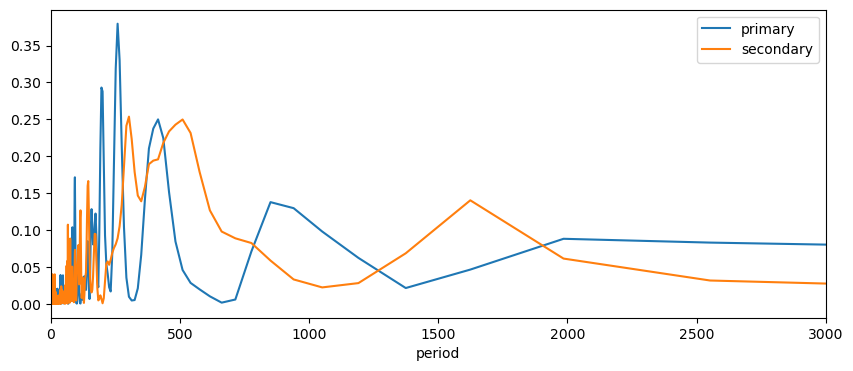

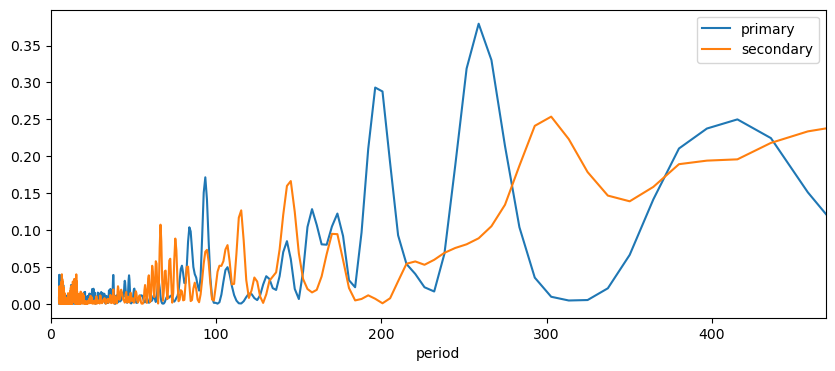

In [8]:
frequency, power = LombScargle(in_df_primary['epoch'], in_df_primary['shift_mins']).autopower()
frequency_s, power_s = LombScargle(in_df_secondary['epoch'], in_df_secondary['shift_mins']).autopower()

fig, ax = plt.subplots(figsize=(10, 4))

plt.plot(1/frequency, power, label = 'primary')    
plt.plot(1/frequency_s, power_s, label = 'secondary')    

plt.xlabel("period")
plt.xlim(0, 3000);
plt.legend()
plt.show()

if True:  # zoom
    fig, ax = plt.subplots(figsize=(10, 4))
    
    plt.plot(1/frequency, power, label = 'primary')    
    plt.plot(1/frequency_s, power_s, label = 'secondary')    
    
    plt.xlabel("period")
    plt.xlim(0, period * 100);
    # plt.ylim(0, 0.1);
    plt.legend()
    plt.show()

## O-C plot, folded

- for periodic trend in O-C

In [10]:
def truncate_freq_power_to_period_range(freq, power, period_min, period_max):
    f, p = freq, power
    if period_min is not None:
        f, p = f[f < 1 / period_min], p[f < 1 / period_min]
    if period_max is not None:
        f, p = f[f > 1 / period_max], p[f >  1 / period_max]
    return f, p


def plot_oc_folded(period_min=None, period_max=None, period_min_s=None, period_max_s=None, period=None, period_s=None):

    if period is None:
        _f, _p = truncate_freq_power_to_period_range(frequency, power, period_min, period_max)
        period = 1 / _f[np.argmax(_p)]
    phase_oc = etv_functions.phase_data(in_df_primary.epoch, 0, period)

    fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y * 1.1), sharex=False)
    if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
        axs = [axs]
    
    axs[0].scatter(phase_oc, in_df_primary.shift_mins, marker = 'o', s=12**2, c=in_df_primary.epoch);
    axs[0].errorbar(phase_oc, in_df_primary['shift_mins'], yerr = in_df_primary['std_mins'],
                    lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'None', label="primary")
    axs[0].set_title(f"TIC {ticid}, {title_suffix}\nfolded with P={period:.4f} d", fontsize=14)

    if in_df_secondary is not None:
        if period_s is None:
            _f, _p = truncate_freq_power_to_period_range(frequency_s, power_s, period_min_s, period_max_s)
            period_s= 1 / _f[np.argmax(_p)]
        phase_oc_s = etv_functions.phase_data(in_df_secondary.epoch, 0, period_s)
        axs[1].scatter(phase_oc_s, in_df_secondary.shift_mins, marker = 'o',  s=12**2, c=in_df_secondary.epoch);
        axs[1].errorbar(phase_oc_s, in_df_secondary['shift_mins'], yerr = in_df_secondary['std_mins'],
                        lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color='None', ecolor='navy', markeredgecolor = 'None', label="secondary" );
        axs[1].set_title(f"TIC {ticid}, {title_suffix}\nfolded with P={period_s:.4f} d", fontsize=14)

    for ax in axs:
        ax.set_ylabel("O - C (minutes)")
        ax.set_xlabel("Phase (Normalized)")
        ax.legend();
    plt.subplots_adjust(hspace=0.4)
    return axs

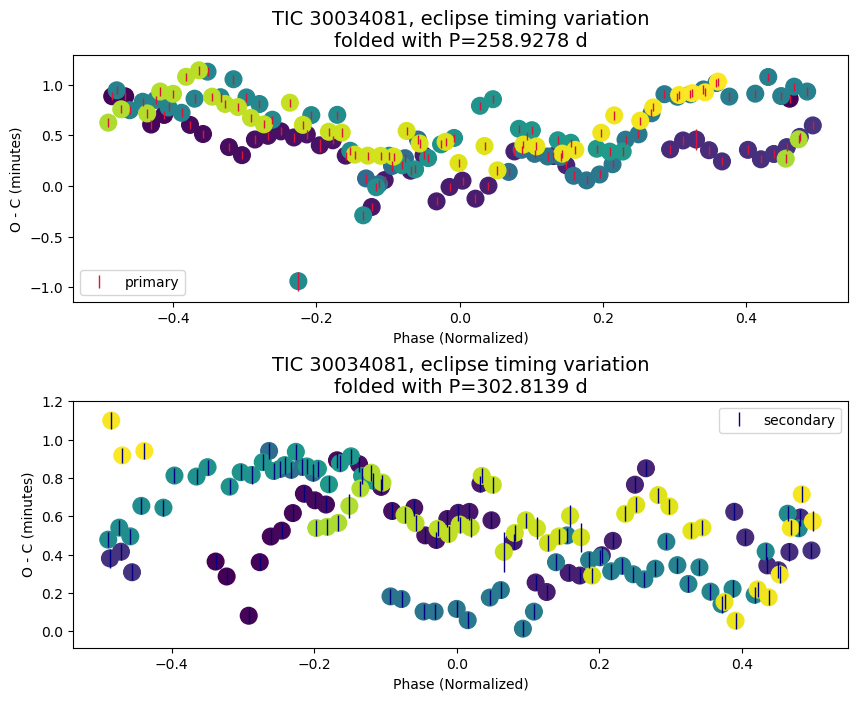

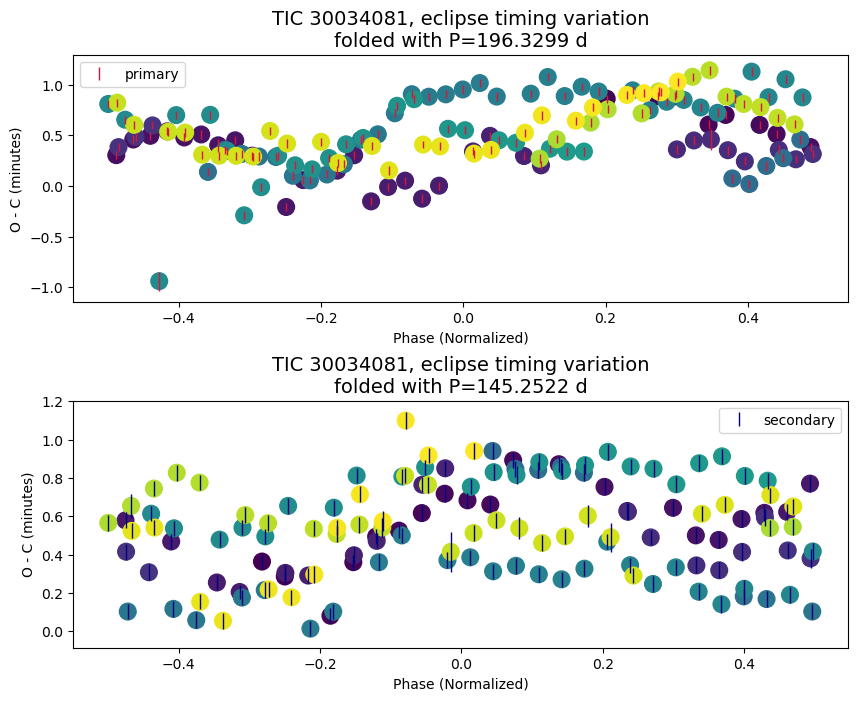

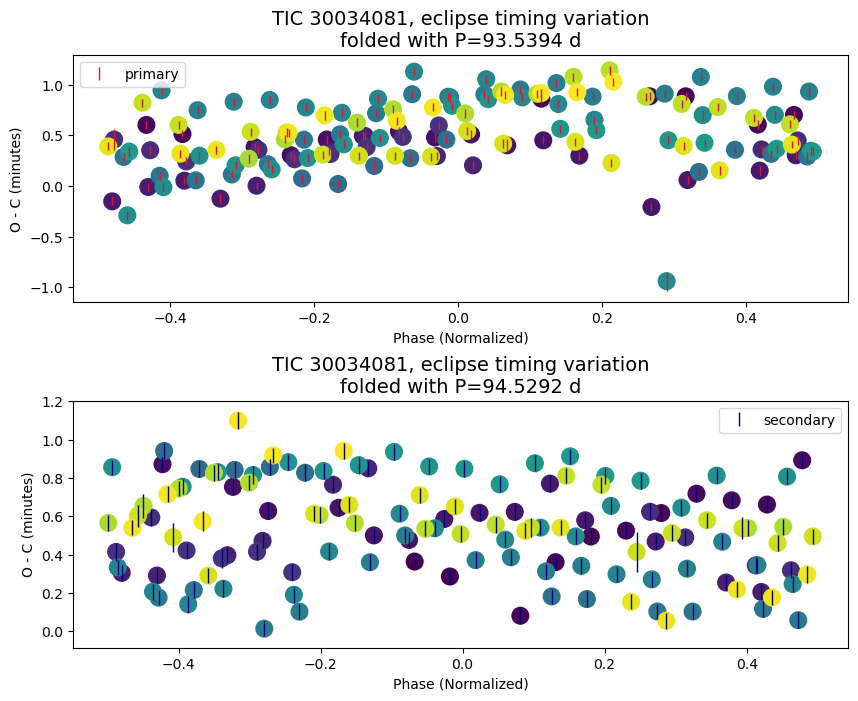

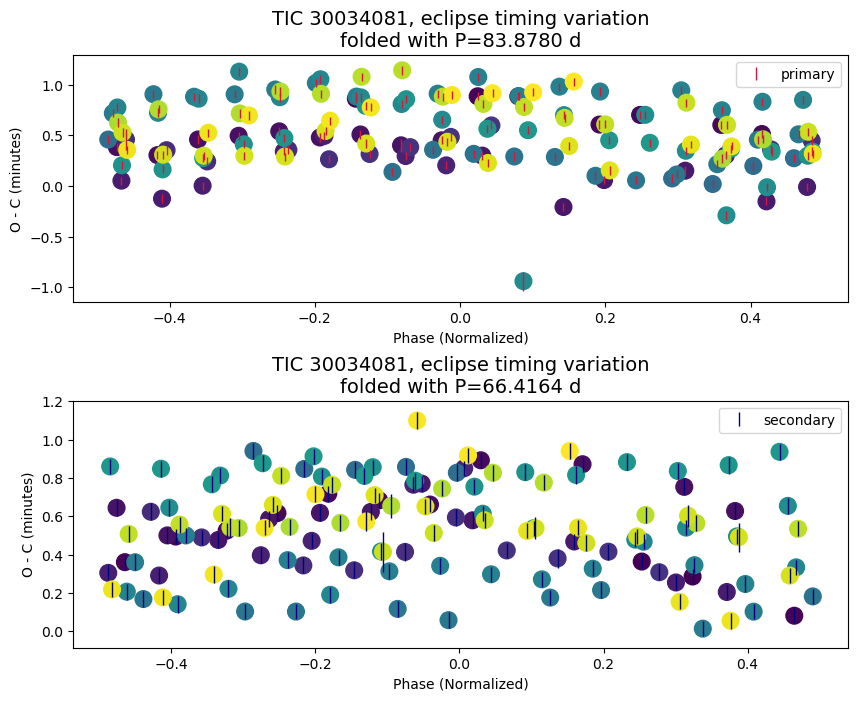

In [13]:
%matplotlib inline
# %matplotlib widget

if True:  # plot O-C periodic trend by folding with a period (from LS Periodogram by default)
    def tweak_axs(axs):
        pass

    axs = plot_oc_folded(
        period_min=None, period_max=None,
        period_min_s=None, period_max_s=None,
    )
    tweak_axs(axs)

    axs = plot_oc_folded(
        period_min=None, period_max=250,
        period_min_s=None, period_max_s=250,
    )

    axs = plot_oc_folded(
        period_min=None, period_max=100,
        period_min_s=80, period_max_s=100,
    )

    axs = plot_oc_folded(
        period_min=None, period_max=90,
        period_min_s=None, period_max_s=90,
    )


## Results Summary

In [60]:
# FILL-IN the ETV results / comments
has_etv = "Y"
comments = "Non-linear trend, but no clear O-C period in folded O-C. EB Period to SB Period ~= 2.8:1 . The trend of primary is opposite of the one of secondary in some time range. VSX Period is half of true period. [D*0.8]"

# Eclipse depth from the model
depth_pct_p = round(-mean_alpha1 * 100, 2)
if t0_secondary is not None:
    depth_pct_s = round(-mean_alpha1_s * 100, 2)
else:
    depth_pct_s = None

summary = {
    "tic": ticid,
    "has_etv": has_etv,
    "comments": comments,
    "period": period,  # the period used in ETV analysis
    "depth_pct_p": depth_pct_p,
    "depth_pct_s": depth_pct_s,
    "epoch_p": t0_primary,
    "epoch_s": t0_secondary,
    "num_sectors": len(sr),
    "time_span": round(time[-1] - time[0], 2),
    "time_start": round(time[0], 2),
    "time_end": round(time[-1], 2),
}

summary = pd.DataFrame.from_dict(summary, orient="index")
with pd.option_context('display.max_colwidth', None, 'display.max_rows', 999, 'display.max_columns', 99):
    display(summary);

# Single line to be added to a CSV
print("")
print(summary.transpose().to_csv(
    index=False,
    header=True, 
))

,0
tic,30034081
has_etv,Y
comments,"Non-linear trend, but no clear O-C period in folded O-C. EB Period to SB Period ~= 2.8:1 . The trend of primary is opposite of the one of secondary in some time range. VSX Period is half of true period. [D*0.8]"
period,4.689244
depth_pct_p,47.61
depth_pct_s,47.68
epoch_p,1413.897422
epoch_s,1411.5528
num_sectors,30
time_span,1797.24



tic,has_etv,comments,period,depth_pct_p,depth_pct_s,epoch_p,epoch_s,num_sectors,time_span,time_start,time_end
30034081,Y,"Non-linear trend, but no clear O-C period in folded O-C. EB Period to SB Period ~= 2.8:1 . The trend of primary is opposite of the one of secondary in some time range. VSX Period is half of true period. [D*0.8]",4.689244,47.61,47.68,1413.897422,1411.5528,30,1797.24,1410.9,3208.14

